meta NOT subset; don't know how to subset; dropped


Index(['PS', 'P4VP', 'fComb', 'thickness', 'pxlsToUm', 'imgSize',
       'periodicity', 'grainSize', 'pctLinesDark', 'junctionDensityDark',
       'endDensityDark', 'pctLinesLight', 'junctionDensityLight',
       'endDensityLight', 'block_ratio', 'area_frac_lines',
       'area_frac_dark_dots', 'area_frac_light_dots', 'area_frac_featureless',
       'fCombCalc', 'fPDPCalc', 'ratioWithNPs', 'npSizeNormed',
       'thicknessNormed', 'periodPS', 'periodP4VP', 'chiN_eff',
       'assumedBlockRatio'],
      dtype='object')


meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


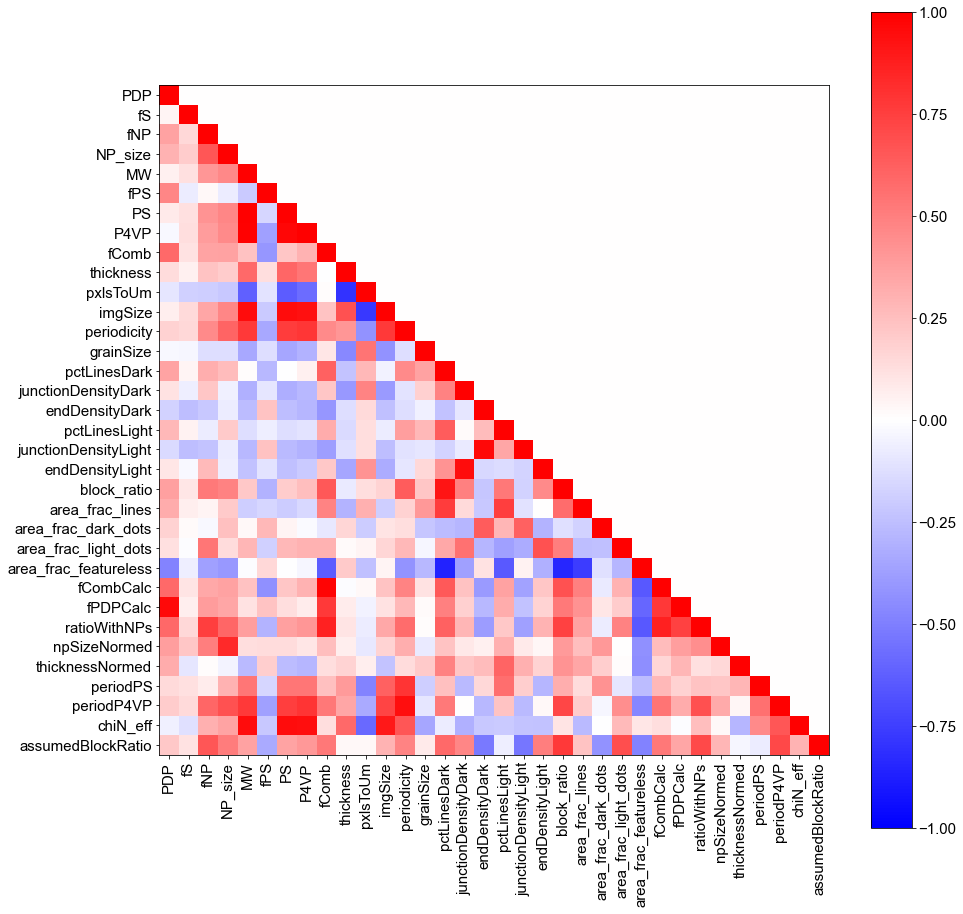

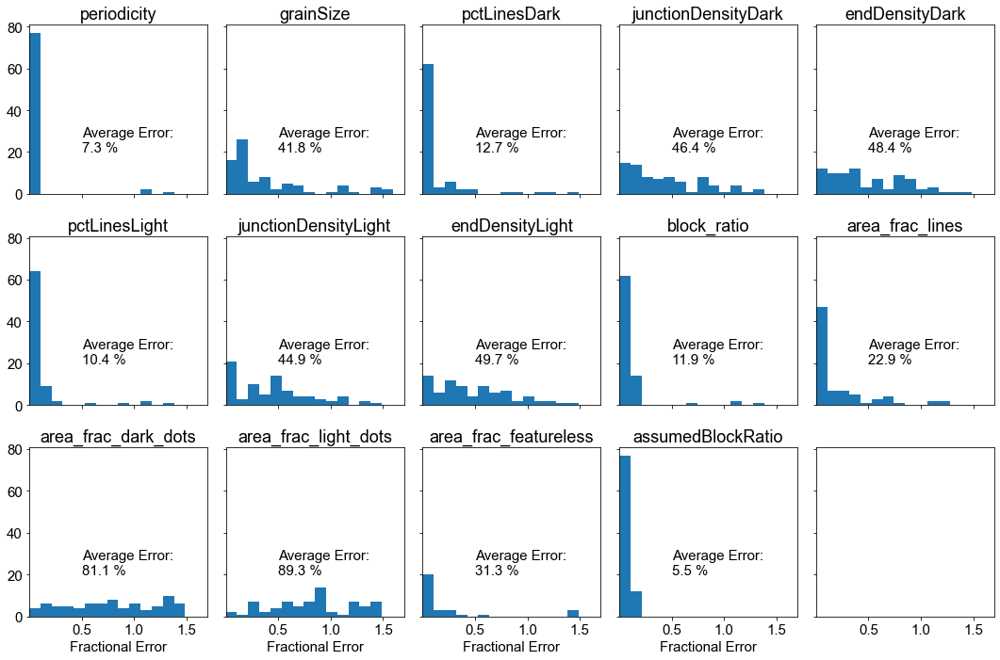

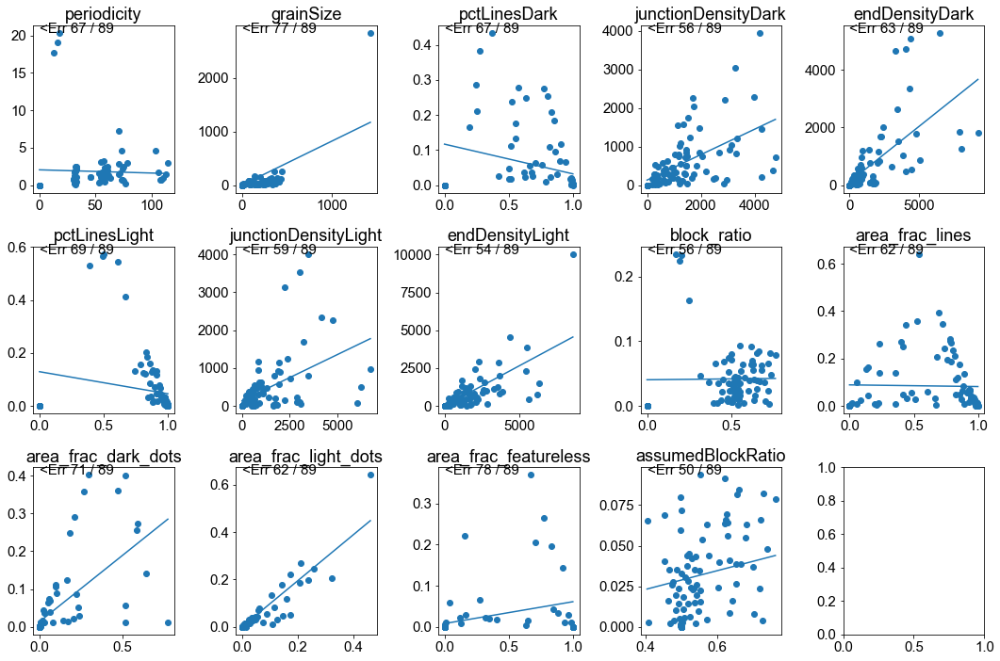

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import copy
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


# changing matplotlib font style so that pdf's saved from this notebook can be opened in Adobe illustrator
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['font.sans-serif'] = "Arial"
mpl.rcParams['font.family'] = "sans-serif"
mpl.rcParams['font.size'] = 15

# line equation used as error correlation function
def err_corr_func(x,a,b):
    return a*x + b




ia_data = pd.read_csv('2021-12-02_image_analysis.csv')
# the expected comb fraction based on the weight fractions of PS, P4VP, and PDP 

ia_data['MW'] = ia_data['PS'] + ia_data['P4VP']
ia_data['fPS'] = ia_data['PS'] / ia_data['MW']

ia_data['fCombCalc'] = 1 - (ia_data['PS'] / (ia_data['PS'] + ia_data['P4VP'] + ia_data['P4VP']/105 * ia_data['PDP']*304.51)) # weight of PS block, P4VP block, and PDP

ia_data['fPDPCalc'] = (ia_data['P4VP']*(ia_data['PDP']-1)*304.51)/(ia_data['PS']*105 + ia_data['P4VP']*105 + ia_data['P4VP']*(ia_data['PDP'])*304.51)

#ia_data['freePDP_NPCalc'] = (ia_data['P4VP']*ia_data['PDP']*304.51)/(ia_data['PS']*105 + ia_data['P4VP']*105 + ia_data['P4VP']*(ia_data['PDP']-1)*304.51)

ia_data['ratioWithNPs'] = ia_data['fCombCalc'] + ia_data['fNP']/100 # block ratio assuming all NPs are in P4VP

ia_data['npSizeNormed'] = ia_data['NP_size']/(ia_data['periodicity']*ia_data['block_ratio'])

ia_data['thicknessNormed']=ia_data['thickness']/ia_data['periodicity']


ia_data['periodPS'] = ia_data['periodicity']*(1-ia_data['block_ratio'])
ia_data['periodP4VP'] = ia_data['periodicity']*(ia_data['block_ratio'])


# approximating the domain widths of PS and P4VP(PDP)
ia_data['chiN_eff'] = (ia_data['PS']+ia_data['P4VP'])*(1- ia_data['fPDPCalc'])*(1-ia_data['fS']/100)

#ia_data['thickness_hist'] = pd.cut(ia_data['thickness'].values,bins = np.arange(40,260,10))

ia_data.replace(np.inf,0,inplace = True)
ia_data = ia_data.fillna(0)

ia_data['assumedBlockRatio'] = ia_data['area_frac_featureless']/2 + (1-ia_data['area_frac_featureless'])* ia_data['block_ratio']

ins = ['PDP', 'fS', 'fNP', 'NP_size','MW', 'fPS']
df = ia_data
num_df = (df.drop(df.columns, axis=1).join(df[df.columns].apply(pd.to_numeric, errors='coerce')))
num_df = num_df[num_df.columns[1:]].dropna(axis = 1)
mdf_mean = num_df.groupby(ins).mean().reset_index()
mdf_std = num_df.groupby(ins).std().reset_index()
# average dataset
#print(mdf_mean)
# Plotting Covariance Matrix
plt.figure(figsize = (15,15))
Scaler = StandardScaler()
Scaler.fit(mdf_mean)
x_scaled = Scaler.transform(mdf_mean)
emp_cov = np.dot(x_scaled.transpose(),x_scaled)/len(mdf_mean)
plt.imshow(np.tril(emp_cov,k=0),cmap='bwr',vmin = -1, vmax = 1)
plt.colorbar()
plt.xticks(range(len(mdf_mean.columns)),mdf_mean.columns,rotation='vertical')
plt.yticks(range(len(mdf_mean.columns)),mdf_mean.columns)
plt.savefig('Covariance.pdf', format = 'pdf')

# gathering duplicate data points
s_data = ia_data
s_data['namex'] = [name.split('.jpg')[0] for name in ia_data['name']]
s_datam = s_data.drop('name',axis = 1).groupby('namex').mean()
duplicate_TF = s_datam.duplicated(ins, keep = False)
duplicate_data = s_datam[duplicate_TF]

# calculating means and standard deviations of duplicate points


dgroup = duplicate_data.groupby(ins)
dmeans = dgroup.mean()
dstd = dgroup.std()
print(dstd.columns)

# names of outputs
out_names = ['periodicity', 'grainSize', 'pctLinesDark', 'junctionDensityDark',
       'endDensityDark', 'pctLinesLight', 'junctionDensityLight',
       'endDensityLight', 'block_ratio', 'area_frac_lines',
       'area_frac_dark_dots', 'area_frac_light_dots', 'area_frac_featureless','assumedBlockRatio']

# plotting error histograms
fig,ax = plt.subplots(3,5,sharex = True,sharey = True, figsize = (15,10))
ax = [item for sublist in ax for item in sublist]
for i in range(len(out_names)):
    ax[i].hist(np.abs(dstd[out_names[i]] / dmeans[out_names[i]]),bins =np.linspace(0,1.7,17))
    ax[i].title.set_text(out_names[i])
    ax[i].text(0.5,20,'Average Error: \n' + str(round(100*np.mean(dstd[out_names[i]] / dmeans[out_names[i]]),1)) + ' %')
    ax[i].set_xlim(0,1.7)
    if i >= 10:
        ax[i].set_xlabel('Fractional Error')
        ax[i].set_xticks([0.5,1,1.5])
fig.tight_layout() 
plt.savefig('Error Histogramsv2.pdf', format = 'pdf')

# plotting and fitting parameter standard deviations as a function of parameter means
err_params = {}
err_avgs = {}
fig,ax = plt.subplots(3,5, figsize = (15,10))
ax = [item for sublist in ax for item in sublist]
for i in range(len(out_names)):
    ax[i].scatter(dmeans[out_names[i]],dstd[out_names[i]])
    a,b = curve_fit(err_corr_func,dmeans[out_names[i]],dstd[out_names[i]],bounds = [[-np.inf,0],[np.inf,np.inf]])
    err_params[out_names[i]] = a
    err_params[out_names[i] + 'cov'] = b
    drange = np.linspace(min(dmeans[out_names[i]]),max(dmeans[out_names[i]]),20)
    err_avgs[out_names[i]] = np.average(dstd[out_names[i]])
    dnum = dstd[out_names[i]] - err_corr_func(dmeans[out_names[i]],*a)
    ax[i].text(min(drange),max(dstd[out_names[i]]),'<Err ' + str(len(dnum[dnum<=0])) + ' / ' + str(len(dnum)))
    ax[i].plot(drange,err_corr_func(drange,*a))
    ax[i].title.set_text(out_names[i])

    #if i >= 21:
        #ax[i].set_xlabel('Parameter Value')
        #ax[i].set_xticks([0.5,1,1.5])
    #if i%7 == 0:
        #ax[i].set_ylabel('Parameter Error Value')
fig.tight_layout()    
plt.savefig('Error Fitsv2.pdf', format = 'pdf')

In [3]:
from sklearn.model_selection import KFold as KF
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn import ensemble
from sklearn.ensemble import HistGradientBoostingRegressor as hgbr
from sklearn.ensemble import GradientBoostingRegressor as gbr
from sklearn.ensemble import RandomForestRegressor as rfr
from lightgbm import LGBMRegressor as lgbr
from sklearn.feature_selection import f_regression
from sklearn.svm import SVR as svr
from sklearn.kernel_ridge import KernelRidge as krr

print(dir(ensemble))

['AdaBoostClassifier', 'AdaBoostRegressor', 'BaggingClassifier', 'BaggingRegressor', 'BaseEnsemble', 'ExtraTreesClassifier', 'ExtraTreesRegressor', 'GradientBoostingClassifier', 'GradientBoostingRegressor', 'HistGradientBoostingClassifier', 'HistGradientBoostingRegressor', 'IsolationForest', 'RandomForestClassifier', 'RandomForestRegressor', 'RandomTreesEmbedding', 'StackingClassifier', 'StackingRegressor', 'VotingClassifier', 'VotingRegressor', '__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '_bagging', '_base', '_forest', '_gb', '_gb_losses', '_gradient_boosting', '_hist_gradient_boosting', '_iforest', '_stacking', '_voting', '_weight_boosting']


In [4]:
ins_ch = ['PS', 'P4VP', 'PDP', 'fS', 'fNP', 'NP_size', 'thickness',
          'MW', 'fPS', 'fCombCalc', 'fPDPCalc', 'ratioWithNPs','chiN_eff']
ins_s = ['PS', 'P4VP', 'PDP', 'fS', 'fNP', 'NP_size']

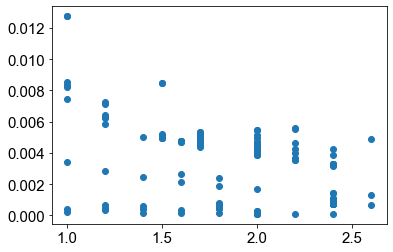

In [5]:
mdf_mean['PDP_dist_ratio'] = -1/(mdf_mean['block_ratio'] * (mdf_mean['PS'] + mdf_mean['P4VP']) + mdf_mean['P4VP'])/((mdf_mean['block_ratio'] - 1) * mdf_mean['P4VP']/105 * mdf_mean['PDP']*304.51) 
plt.scatter(mdf_mean['PDP'],mdf_mean['PDP_dist_ratio'])
plt.show()

In [6]:
combidata = copy.deepcopy(mdf_mean)
ins_fvals = ['PS', 'P4VP', 'PDP', 'fS', 'fNP', 'NP_size', 'thickness',
          'MW', 'fPS', 'fCombCalc', 'fPDPCalc', 'ratioWithNPs','chiN_eff']
outs_fvals = ['periodicity','block_ratio','grainSize','assumedBlockRatio',
            'area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots',
            'junctionDensityDark','endDensityDark', 'junctionDensityLight','endDensityLight']
f_vals = [f_regression(combidata[ins_fvals],combidata[out_v])[0] for out_v in outs_fvals]
dbfvals = pd.DataFrame(f_vals,index = outs_fvals,columns = ins_fvals)

dbfvals.to_csv('f_values.csv')

meta NOT subset; don't know how to subset; dropped


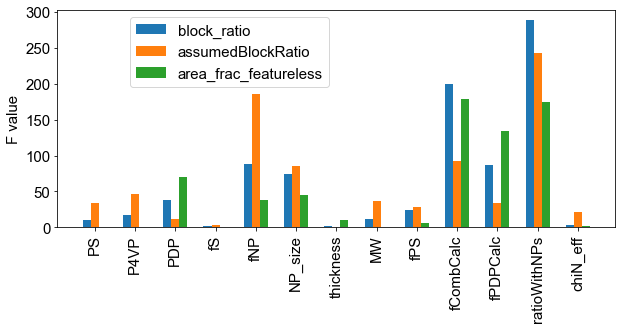

In [8]:

X = combidata[ins_ch]
y1,y2,y3 = combidata['block_ratio'],combidata['assumedBlockRatio'],combidata['area_frac_featureless']
check_fy1 = f_regression(X,y1)
check_fy2 = f_regression(X,y2)
check_fy3 = f_regression(X,y3)

p_vals_multi = np.array(check_fy1[1])+np.array(check_fy2[1])+np.array(check_fy3[1])
F_vals_multi = np.array(check_fy1[0])+np.array(check_fy2[0])+np.array(check_fy3[0])

plt.figure(figsize = (10,4))
plt.bar([i*3-0.6 for i in range(len(ins_ch))],check_fy1[0],label = 'block_ratio',width = 0.6)
plt.bar([i*3 for i in range(len(ins_ch))],check_fy2[0], label = 'assumedBlockRatio',width = 0.6)
plt.bar([i*3+0.6 for i in range(len(ins_ch))],check_fy3[0],label = 'area_frac_featureless',width = 0.6)
plt.xticks([i*3 for i in range(len(ins_ch))],list(ins_ch),rotation = 90)
plt.legend(bbox_to_anchor = [0.5,1])
plt.ylabel('F value')
#plt.ylim(0,119)
plt.savefig('F value plot.pdf',format = 'pdf')
plt.show()

In [9]:
mdf_std = num_df.groupby(ins).std().reset_index()
combi_data = copy.deepcopy(mdf_mean)
combi_errors = copy.deepcopy(mdf_std)


combi_data = combi_data[np.abs(combi_data['PS']-61.7)>0.5]

combi_data = combi_data[np.abs(combi_data['PS']-25)>0.5].iloc[1:,:]
combi_errors = combi_errors.loc[combi_data.index,:]

combi_errors_minsds = np.nanmin(combi_errors.replace(0,np.nan).values,axis = 0)
print(combi_errors.replace(0,np.nan).values.shape)
print(len(combi_errors_minsds))
for ni in range(len(combi_errors.columns)):
    combi_errors.iloc[:,ni] = combi_errors.iloc[:,ni].replace(0,combi_errors_minsds[ni])
    
for i in range(len(out_names)):
        combi_errors[out_names[i]] = np.sqrt(combi_errors[out_names[i]]**2 + np.max(np.vstack(((err_params[out_names[i]][0]*combi_data[out_names[i]] + err_params[out_names[i]][1]),err_avgs[out_names[i]]*np.ones(len(combi_data[out_names[i]])))),axis = 0)**2)
#print(np.abs(combi_data['PS']-61.7)>0.5)
#print(list(combi_data['PS']))
print(combi_data['PS'].unique())
#print(combi_data)
combi_data = combi_data.reset_index()
combi_errors = combi_errors.reset_index()

(232, 34)
34
[ 19.  47. 104.  50.]


C:\Users\Jakob Dahl\AppData\Local\Temp\ipykernel_44116\1258781453.py:11: RuntimeWarning: All-NaN slice encountered
  combi_errors_minsds = np.nanmin(combi_errors.replace(0,np.nan).values,axis = 0)


In [11]:
combi_test = mdf_mean[((mdf_mean['PS'] - 61.7)**2 < 0.5)].append(mdf_mean[((mdf_mean['PS'] - 25.0)**2 < 0.5)])
combi_test_err = mdf_std[((mdf_mean['PS'] - 61.7)**2 < 0.5)].append(mdf_std[((mdf_mean['PS'] - 25.0)**2 < 0.5)])
for i in range(len(out_names)):
        combi_test_err[out_names[i]] = np.sqrt(combi_test_err[out_names[i]]**2 + np.max(np.vstack(((err_params[out_names[i]][0]*combi_test[out_names[i]] + err_params[out_names[i]][1]),err_avgs[out_names[i]]*np.ones(len(combi_test[out_names[i]])))),axis = 0)**2)
print(len(combi_test))

7


C:\Users\Jakob Dahl\AppData\Local\Temp\ipykernel_44116\3782897290.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combi_test = mdf_mean[((mdf_mean['PS'] - 61.7)**2 < 0.5)].append(mdf_mean[((mdf_mean['PS'] - 25.0)**2 < 0.5)])
C:\Users\Jakob Dahl\AppData\Local\Temp\ipykernel_44116\3782897290.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combi_test_err = mdf_std[((mdf_mean['PS'] - 61.7)**2 < 0.5)].append(mdf_std[((mdf_mean['PS'] - 25.0)**2 < 0.5)])


In [13]:
block_dat = combi_data[(combi_data['block_ratio'] > 0.05 ) & (combi_data['block_ratio'] < 0.95)]
block_err = combi_errors[(combi_data['block_ratio'] > 0.05) & (combi_data['block_ratio'] < 0.95)]

In [18]:
# option 1: Fit all data on input with GBC regressors

In [15]:
GBR_params  = {'min_samples_leaf' : [1,2,3,4,5,6,8,10,15,20,30],'n_estimators' : [10,25,50,75,100,130,200,400]}
all_params = {}
ni = 0
for pa in GBR_params['min_samples_leaf']:
    for pb in GBR_params['n_estimators']:
        all_params[ni] = {'min_samples_leaf' : pa, 'n_estimators' : pb}
        ni+=1
cvn = 5
combi_datan = combi_data[combi_data['periodicity']>1.0].sample(frac = 1)
ins_ch = ['PS', 'P4VP', 'PDP', 'fS', 'fNP', 'NP_size', 'thickness',
          'MW', 'fPS', 'fCombCalc', 'fPDPCalc', 'ratioWithNPs','chiN_eff']
ins_simple = ['MW','fPS', 'PDP', 'fS', 'fNP', 'NP_size', 'thickness']


In [16]:
from sklearn.metrics import r2_score

In [17]:
predicts1 = ['periodicity','block_ratio','grainSize','assumedBlockRatio',
            'area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots',
            'junctionDensityDark','endDensityDark', 'junctionDensityLight','endDensityLight']

In [18]:
def run_cv_tests(model,model_params,ins_specific,predicts,name):
    option = []

    plt.figure(1)
    fig1,ax1 = plt.subplots(3,4,sharex = True, sharey = True,figsize = (20,15))
    ax1 = [ax for sublist in ax1 for ax in sublist]
    plt.figure(2)
    fig2,ax2 = plt.subplots(3,4,figsize = (20,15))
    ax2 = [ax for sublist in ax2 for ax in sublist]
    par1,par2 = model_params.keys()
    for predict in predicts:
        Xn_train,Xn_test,yn_train,yn_test,en_train,en_test = train_test_split(combi_datan[ins_specific],combi_datan[predict],combi_errors.loc[combi_datan.index,predict],train_size = 0.8,random_state=42)

        ni = len(option)
        kf = KF(n_splits = cvn)
        gscv = GridSearchCV(model,model_params,cv = kf,n_jobs = -1,scoring = 'r2')
        gscv.fit(Xn_train,yn_train)
        gscv_results = pd.DataFrame.from_dict(gscv.cv_results_)

        nax1 = ax1[ni].tricontourf(gscv_results['param_' + par1],gscv_results['param_' + par2],gscv_results['mean_test_score'],levels = 10)
        ax1[ni].set_xlabel(par1)
        ax1[ni].set_ylabel(par2)
        fig1.colorbar(nax1,ax = ax1[ni], label = 'R2')
        ax1[ni].set_yscale('log')
        ax1[ni].set_yticks([10,30,100,300]) 
        ax1[ni].set_yticklabels([10,30,100,300]) 
        ax1[ni].set_xlim(min(gscv_results['param_' + par1]),max(gscv_results['param_' + par1]))
        ax1[ni].set_ylim(min(gscv_results['param_' + par2]),max(gscv_results['param_' + par2]))

        ax1[ni].set_title(predict)
        ax1[ni].scatter(gscv.best_params_[par1],gscv.best_params_[par2],edgecolor = 'r',facecolor = 'None')
        Chi2 = np.sum(((gscv.predict(Xn_test)-yn_test)/en_test)**2/len(yn_test))
        ax2[ni].errorbar(gscv.predict(Xn_train),yn_train,yerr = en_train,linewidth = 0, marker = 'o',elinewidth = 1,capthick = 1,capsize = 5)
        ax2[ni].errorbar(gscv.predict(Xn_test),yn_test,yerr = en_test,linewidth = 0, marker = 'o',elinewidth = 1,capthick = 1,capsize = 5)
        if max(yn_test) < 1.1:
            ax2[ni].plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1))
        else:
            y_max,y_min = ax2[ni].get_ylim()
            ax2[ni].plot(np.linspace(y_max,y_min,10),np.linspace(y_max,y_min,10))

        ax2[ni].set_title(predict + ' R2cv : ' + str(round(gscv.best_score_,2)) + '\n R2 : ' + str(round(gscv.score(Xn_test,yn_test),2)) + ' Chi2 : ' + str(round(Chi2,2)))
        ax2[ni].set_xlabel('Predicted Values')
        ax2[ni].set_ylabel('Measured Values')

        option.append((predict,gscv,gscv_results,gscv.score(Xn_test,yn_test),Chi2))

    fig1.tight_layout()
    fig1.savefig(name + '_CVmap.pdf',format = 'pdf')
    fig1.show()


    fig2.tight_layout()
    fig2.savefig(name + '_Results.pdf',format = 'pdf')
    fig2.show()
    return option

meta NOT subset; don't know how to subset; dropped
C:\Users\Jakob Dahl\AppData\Local\Temp\ipykernel_44116\3675254422.py:49: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
meta NOT subset; don't know how to subset; dropped
C:\Users\Jakob Dahl\AppData\Local\Temp\ipykernel_44116\3675254422.py:54: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


<Figure size 432x288 with 0 Axes>

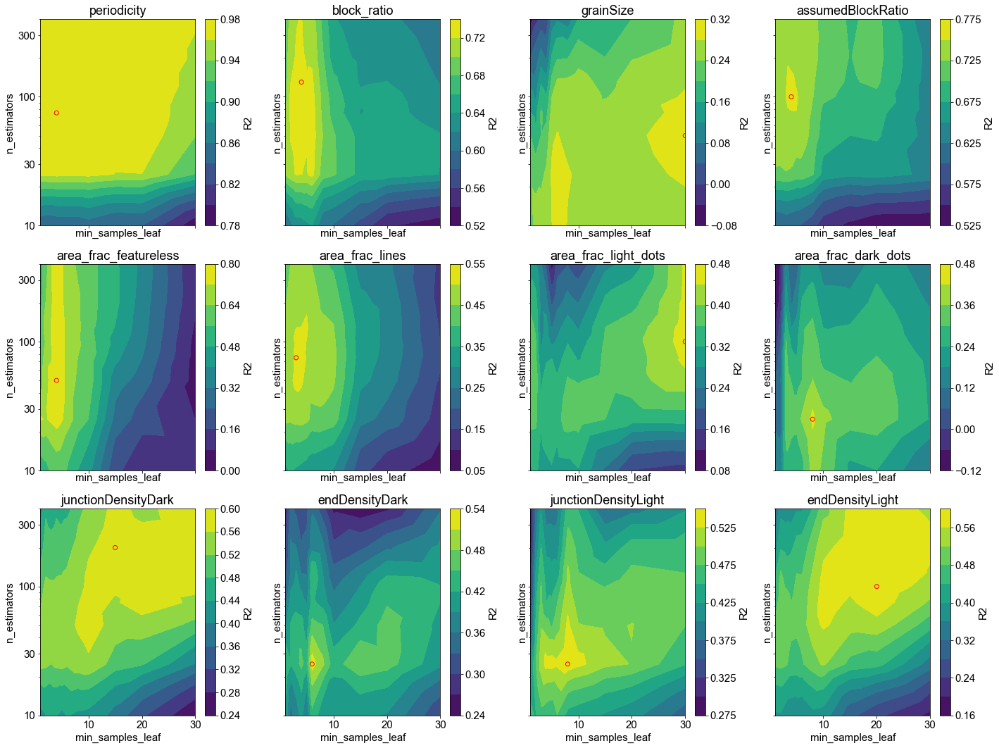

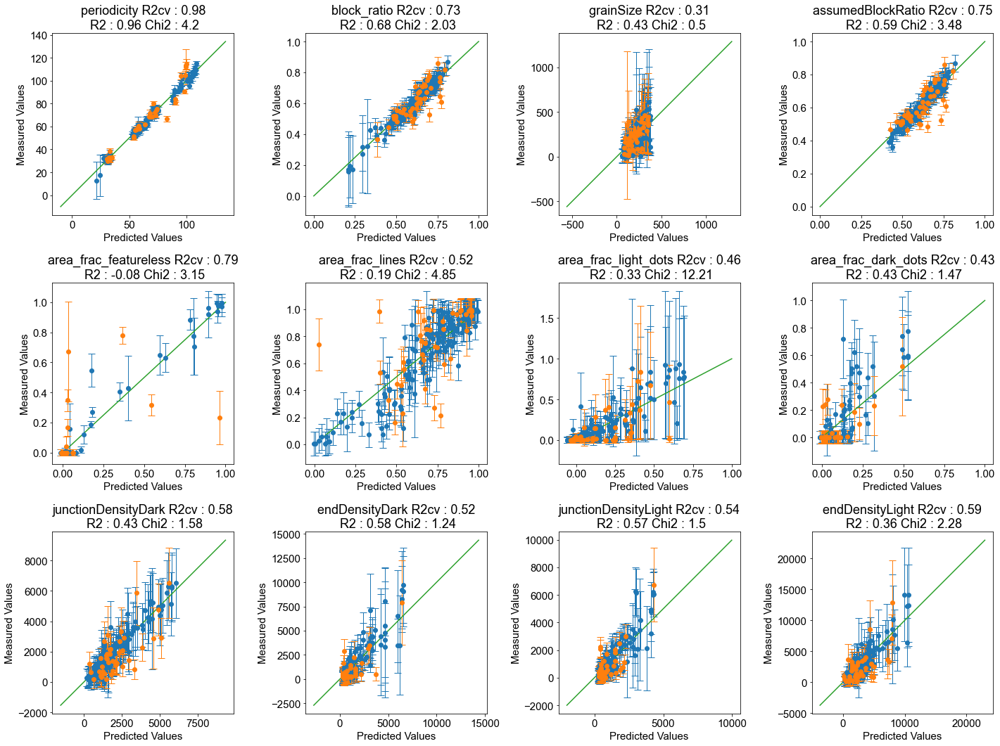

In [19]:
option1f = run_cv_tests(gbr(),GBR_params,ins_ch,predicts1,'O1GBR')



C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


<Figure size 432x288 with 0 Axes>

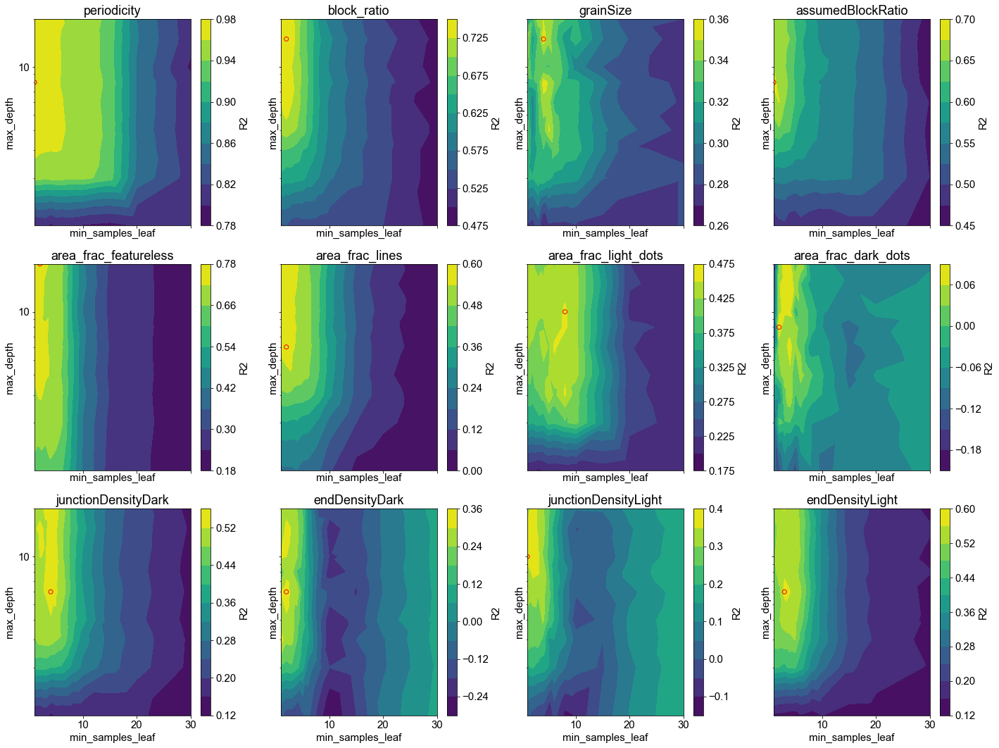

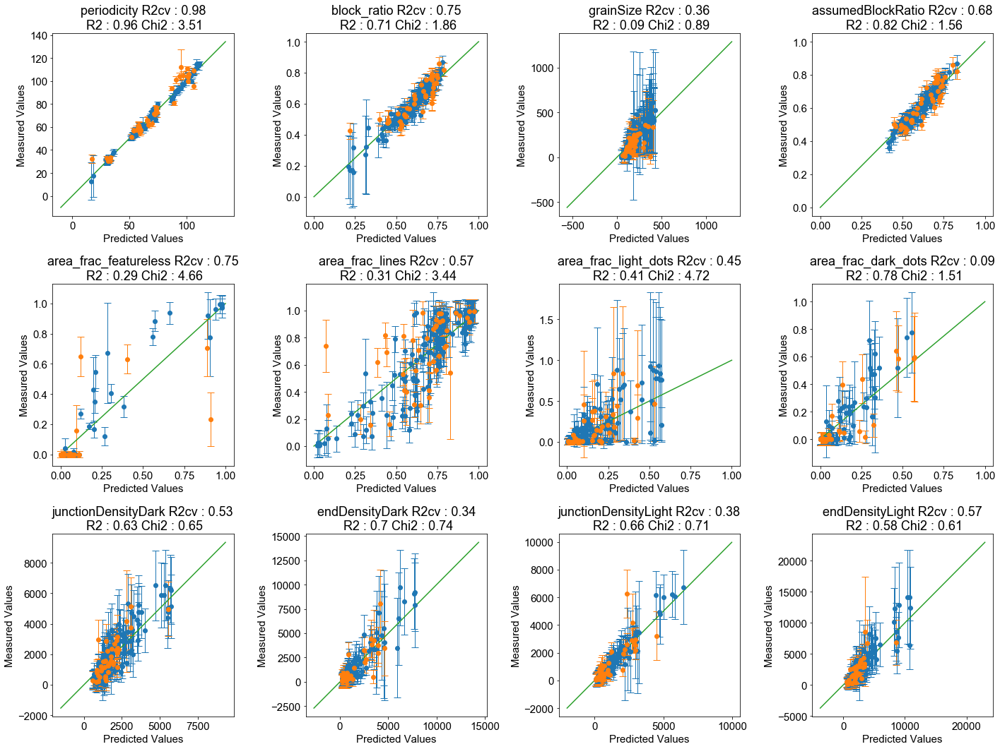

In [23]:
RFR_params = {'min_samples_leaf' : [1,2,3,4,5,6,8,10,15,20,30],'max_depth' : [1,2,3,4,6,8,10,15,20]}
option1r = run_cv_tests(rfr(),RFR_params,ins_ch,predicts1,'O1RFR')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:190: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:190: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently usin

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


<Figure size 432x288 with 0 Axes>

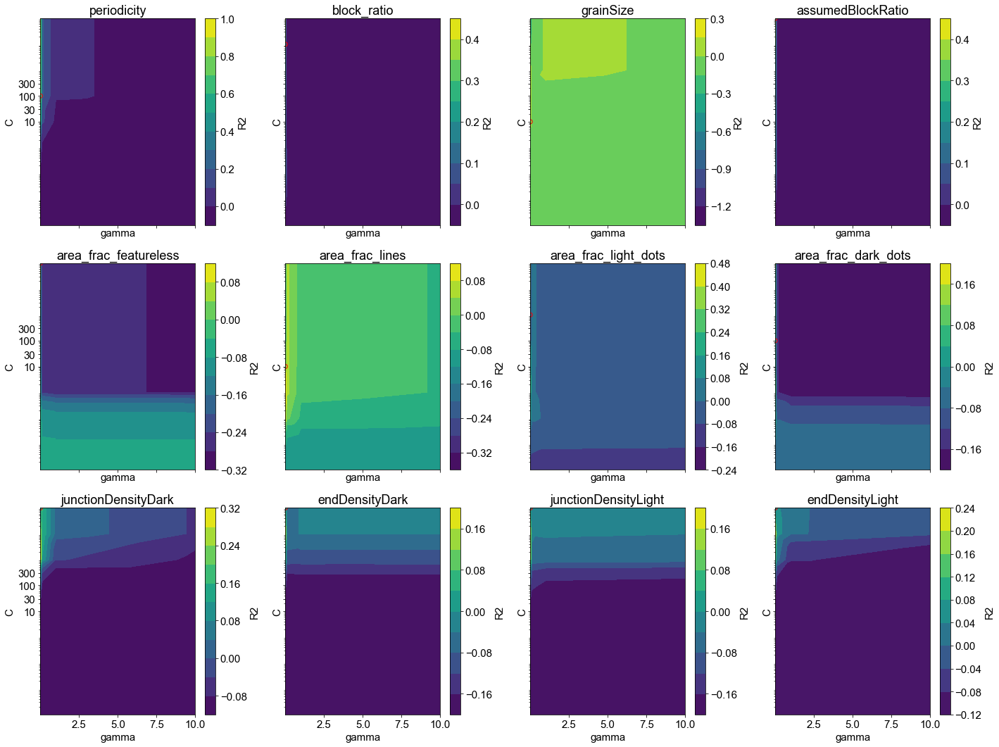

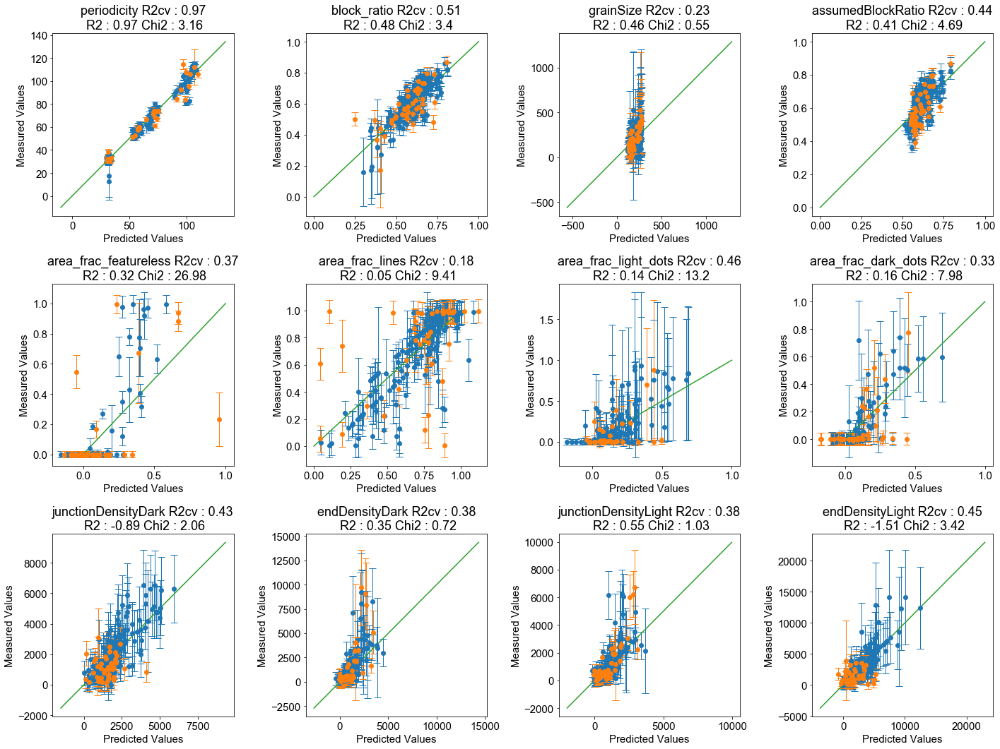

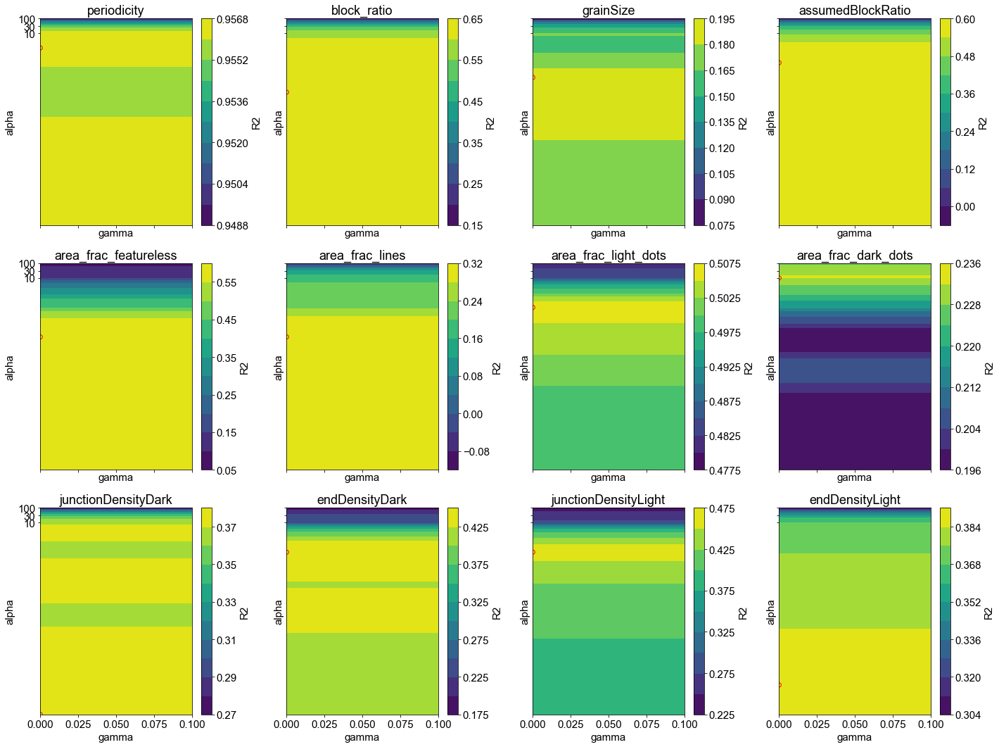

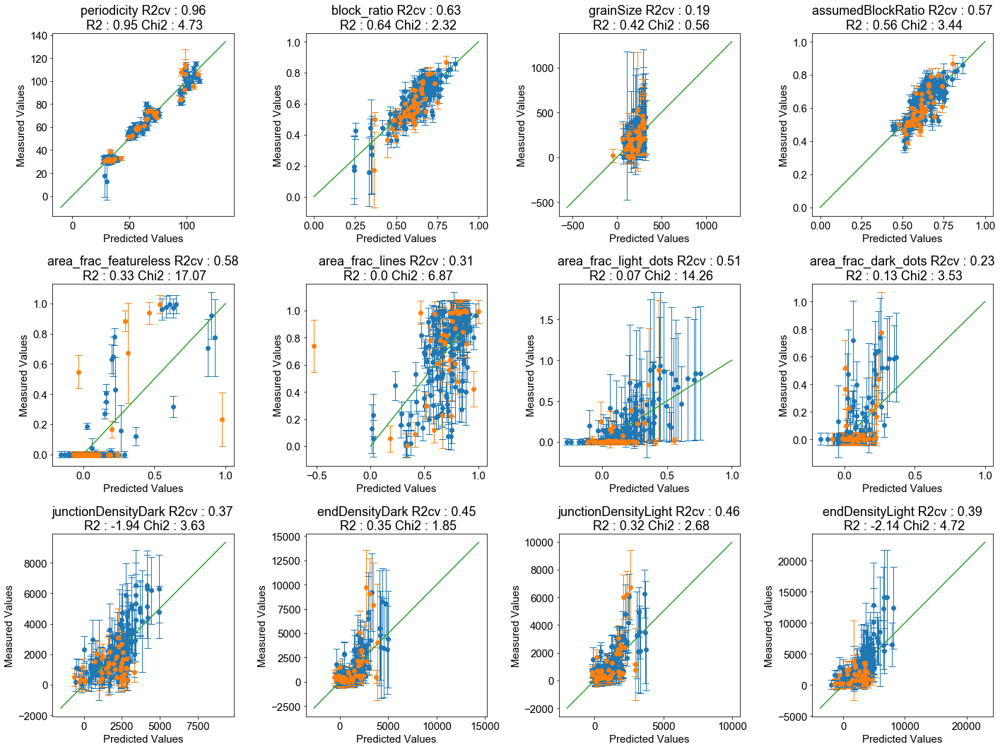

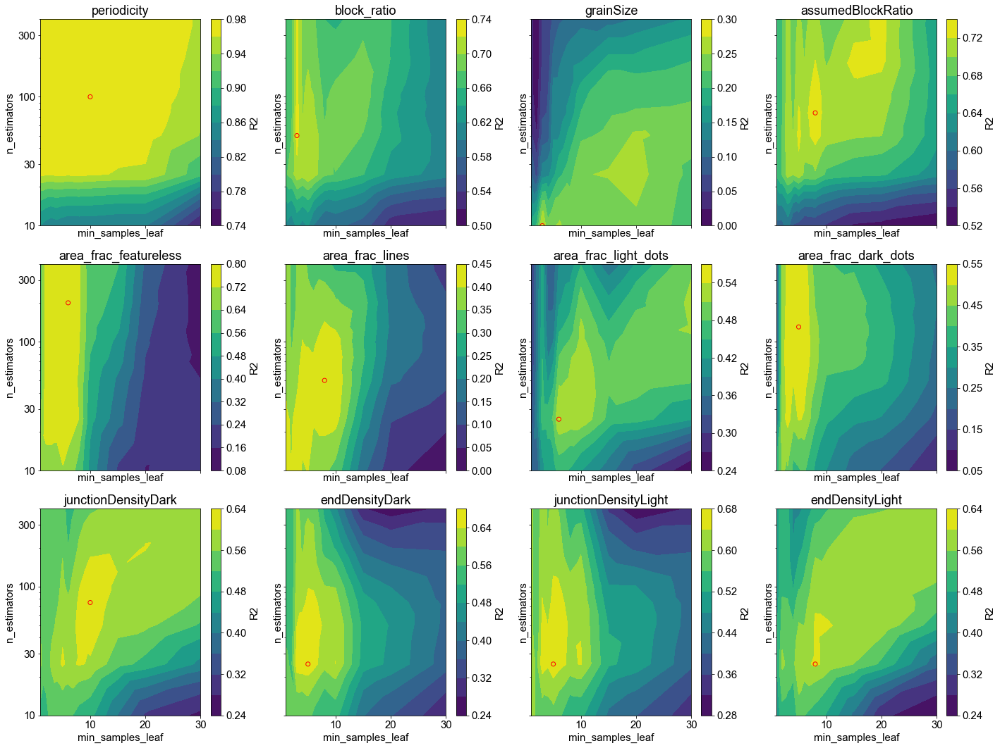

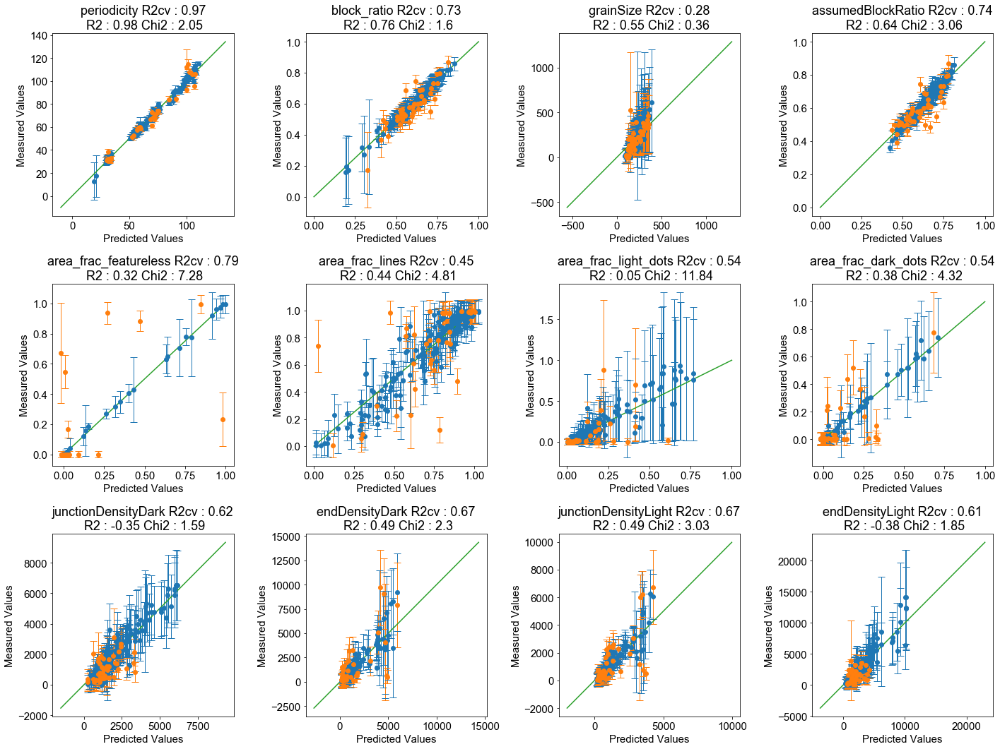

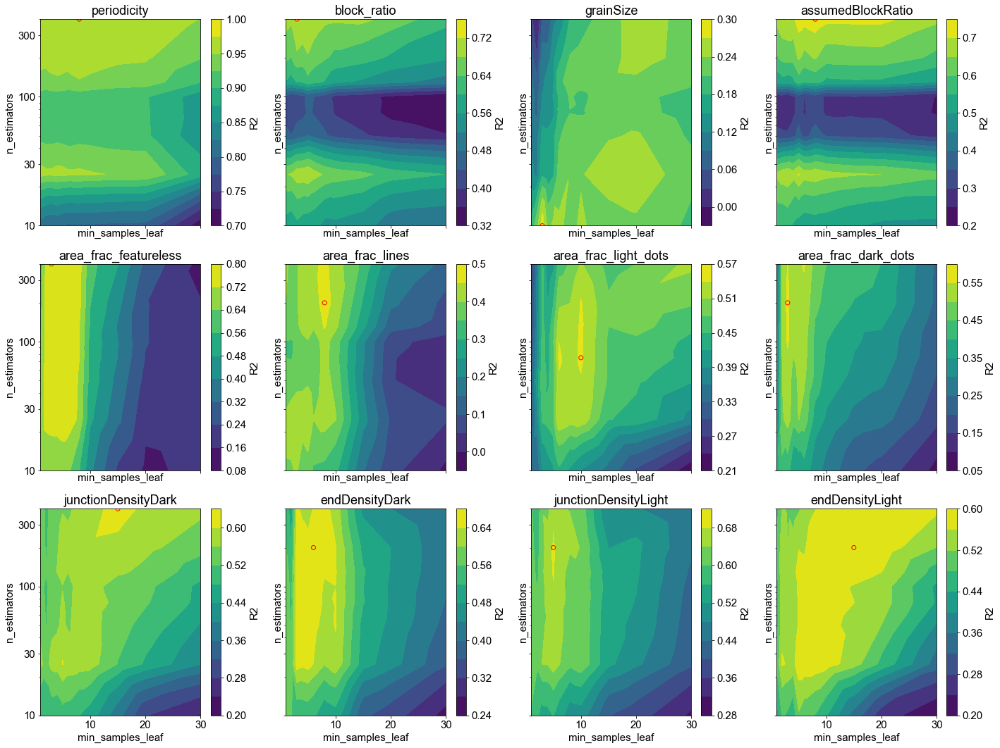

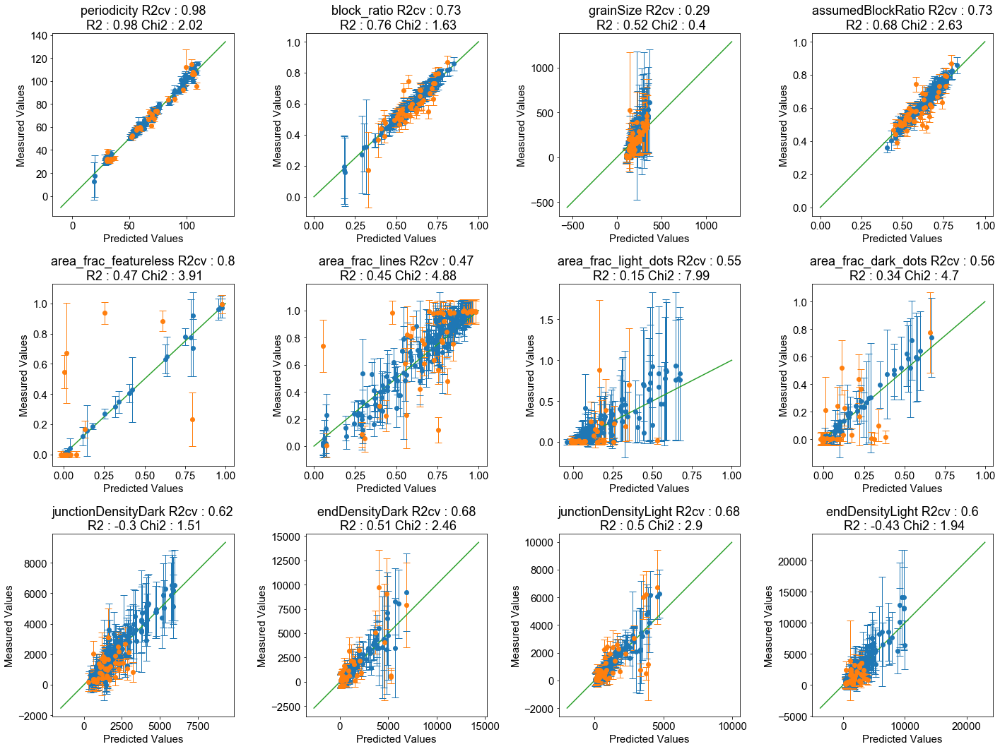

In [87]:

SVR_params = {'gamma' : [1.0e-8,1.0e-6,1.0e-4,1.0e-3,1.0e-2,1.0e-1,1.0,1.0e1] ,'C' : [1.0e-3,1.0e-2,1.0e-1,1.0,1.0e1,1.0e2,1.0e3,1.0e4,1.0e5]}
KRR_params = {'gamma' : [1.0e-12,1.0e-10,1.0e-8,1.0e-6,1.0e-4,1.0e-3,1.0e-2,1.0e-1] ,'alpha' : [1.0e-12,1.0e-10,1.0e-8,1.0e-6,1.0e-4,1.0e-3,1.0e-2,1.0e-1,1.0,1.0e1,1.0e2]}
option1s = run_cv_tests(svr(),SVR_params,ins_ch,predicts1,'O1SVR')
option1k = run_cv_tests(krr(),KRR_params,ins_ch,predicts1,'O1KRR')
option1l = run_cv_tests(lgbr(boosting_type='gbdt'),GBR_params,ins_ch,predicts1,'O1LGBR')
option1d = run_cv_tests(lgbr(boosting_type='dart'),GBR_params,ins_ch,predicts1,'O1DBGR')

In [88]:
option1all = [option1f,option1r,option1s,option1k,option1l,option1d]
results1R2test,results1R2cv,results1Chi2 = {},{},{}
model_name = ['GBR','RFR','SVR','KRR','LGBR','DGBR']
predicts1 = ['periodicity','block_ratio','grainSize','assumedBlockRatio',
            'area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots',
            'junctionDensityDark','endDensityDark', 'junctionDensityLight','endDensityLight']
for ni in range(len(option1all)):
    results1R2test[model_name[ni]] = {predicts1[nj] : option1all[ni][nj][3] for nj in range(len(predicts1))}
    results1R2cv[model_name[ni]] = {predicts1[nj] : option1all[ni][nj][1].best_score_ for nj in range(len(predicts1))}
    results1Chi2[model_name[ni]] = {predicts1[nj] : option1all[ni][nj][4] for nj in range(len(predicts1))}

In [89]:
r1cv = pd.DataFrame.from_dict(results1R2cv)
r1cv

,GBR,RFR,SVR,KRR,LGBR,DGBR
periodicity,0.972072,0.969576,0.965092,0.956648,0.973585,0.975028
block_ratio,0.734410,0.749910,0.514123,0.627410,0.728562,0.726267
grainSize,0.261137,0.258923,0.228007,0.188288,0.277331,0.288318
assumedBlockRatio,0.759594,0.754831,0.443524,0.569706,0.735296,0.733928
area_frac_featureless,0.802699,0.786250,0.372121,0.584016,0.791780,0.796684
area_frac_lines,0.487268,0.536768,0.175386,0.310720,0.445057,0.473793
area_frac_light_dots,0.537961,0.554454,0.455592,0.506345,0.541191,0.545501
area_frac_dark_dots,0.521230,0.503370,0.333586,0.232286,0.543959,0.563244
junctionDensityDark,0.602893,0.605921,0.434479,0.373329,0.622532,0.615151
endDensityDark,0.634611,0.633108,0.377806,0.449033,0.668351,0.679012


In [90]:
r1test= pd.DataFrame.from_dict(results1R2test)
r1test

,GBR,RFR,SVR,KRR,LGBR,DGBR
periodicity,0.977003,0.972583,0.966959,0.950395,0.975636,0.977029
block_ratio,0.732762,0.758396,0.478252,0.641052,0.764017,0.758526
grainSize,0.675529,0.741910,0.456762,0.424935,0.545709,0.520438
assumedBlockRatio,0.676103,0.670882,0.410950,0.557576,0.638997,0.675913
area_frac_featureless,0.422266,0.378566,0.315737,0.331210,0.322064,0.472031
area_frac_lines,0.459009,0.490110,0.054132,0.001786,0.436193,0.446947
area_frac_light_dots,0.021771,0.000793,0.144280,0.074917,0.047945,0.152800
area_frac_dark_dots,0.300954,0.371684,0.157428,0.128050,0.378181,0.339688
junctionDensityDark,-0.438515,-0.720996,-0.888393,-1.939400,-0.354468,-0.299637
endDensityDark,0.539248,0.467151,0.352719,0.347189,0.494921,0.508681


In [91]:
r1test.mean(axis = 0)

GBR     0.354966
RFR     0.327464
SVR     0.124409
KRR    -0.025347
LGBR    0.362639
DGBR    0.385255
dtype: float64

In [92]:
r1cv.mean(axis = 0)

GBR     0.628899
RFR     0.635769
SVR     0.427096
KRR     0.470472
LGBR    0.633664
DGBR    0.639914
dtype: float64

In [93]:
r1Chi2 = pd.DataFrame.from_dict(results1Chi2)
r1Chi2

,GBR,RFR,SVR,KRR,LGBR,DGBR
periodicity,1.969001,2.140298,3.164673,4.732780,2.048179,2.015249
block_ratio,1.795848,1.523739,3.395313,2.315143,1.599537,1.631110
grainSize,0.388984,0.310741,0.553874,0.560603,0.364267,0.396238
assumedBlockRatio,2.673661,2.841246,4.693054,3.444977,3.056242,2.625137
area_frac_featureless,4.699551,6.621536,26.984829,17.067684,7.276734,3.908798
area_frac_lines,4.445437,4.555147,9.413812,6.870649,4.807800,4.882855
area_frac_light_dots,11.465838,12.366833,13.200611,14.264550,11.835034,7.988106
area_frac_dark_dots,6.404406,4.084986,7.977174,3.529811,4.317383,4.703491
junctionDensityDark,1.707774,2.069956,2.063621,3.625688,1.586617,1.513592
endDensityDark,2.114794,2.397358,0.724812,1.854312,2.296825,2.459261


In [94]:
feature_importancerf = {}

for pi in range(len(predicts1)):
    feature_importancerf[predicts1[pi]] = {ins_ch[i] : option1r[pi][1].best_estimator_.feature_importances_[i] for i in range(len(ins_ch))}
    
feature_importancegb = {}

for pi in range(len(predicts1)):
    feature_importancegb[predicts1[pi]] = {ins_ch[i] : option1f[pi][1].best_estimator_.feature_importances_[i] for i in range(len(ins_ch))}

In [95]:
fdb = pd.DataFrame.from_dict(feature_importancerf)
fdb.mean(axis = 1)

PS              0.017513
P4VP            0.016177
PDP             0.023053
fS              0.048499
fNP             0.074857
NP_size         0.111322
thickness       0.090910
MW              0.020453
fPS             0.040029
fCombCalc       0.090508
fPDPCalc        0.038004
ratioWithNPs    0.264636
chiN_eff        0.164038
dtype: float64

In [96]:
gdb = pd.DataFrame.from_dict(feature_importancegb)
gdb.mean(axis = 1)

PS              0.006029
P4VP            0.013379
PDP             0.010484
fS              0.040286
fNP             0.089123
NP_size         0.121709
thickness       0.084050
MW              0.024396
fPS             0.037450
fCombCalc       0.092748
fPDPCalc        0.057373
ratioWithNPs    0.241929
chiN_eff        0.181043
dtype: float64

In [97]:
feature_importanceda = {}

for pi in range(len(predicts1)):
    feature_importanceda[predicts1[pi]] = {ins_ch[i] : option1d[pi][1].best_estimator_.feature_importances_[i] for i in range(len(ins_ch))}
    
feature_importancel = {}

for pi in range(len(predicts1)):
    feature_importancel[predicts1[pi]] = {ins_ch[i] : option1l[pi][1].best_estimator_.feature_importances_[i] for i in range(len(ins_ch))}

In [98]:
dadb = pd.DataFrame.from_dict(feature_importanceda)
dadb = dadb/dadb.sum()
dadb.mean(axis = 1)

PS              0.023692
P4VP            0.000000
PDP             0.042221
fS              0.115251
fNP             0.099969
NP_size         0.159130
thickness       0.218302
MW              0.000000
fPS             0.004388
fCombCalc       0.047807
fPDPCalc        0.006132
ratioWithNPs    0.119306
chiN_eff        0.163802
dtype: float64

In [99]:
ldb = pd.DataFrame.from_dict(feature_importancel)
ldb = ldb/ldb.sum()
ldb.mean(axis = 1)

PS              0.017183
P4VP            0.000000
PDP             0.047896
fS              0.112957
fNP             0.087073
NP_size         0.146266
thickness       0.237688
MW              0.000000
fPS             0.002469
fCombCalc       0.043943
fPDPCalc        0.005229
ratioWithNPs    0.132653
chiN_eff        0.166644
dtype: float64

In [100]:
ins_05 = ['fS','fNP','NP_size','thickness','ratioWithNPs','chiN_eff']
ins_10 = ['fNP','NP_size','ratioWithNPs','chiN_eff']

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

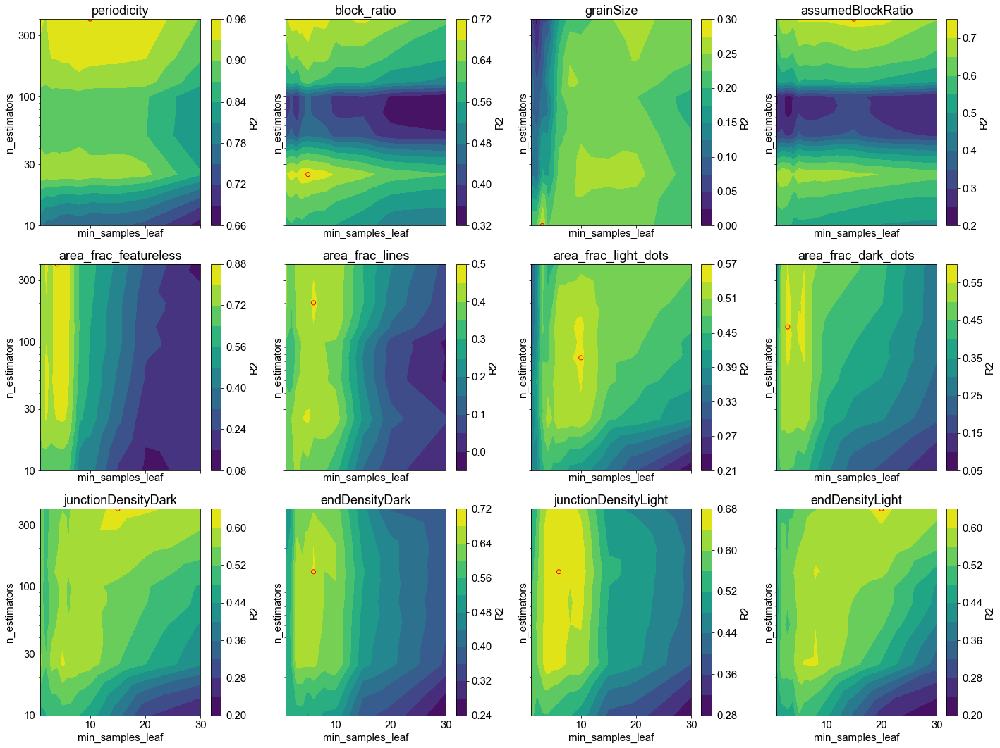

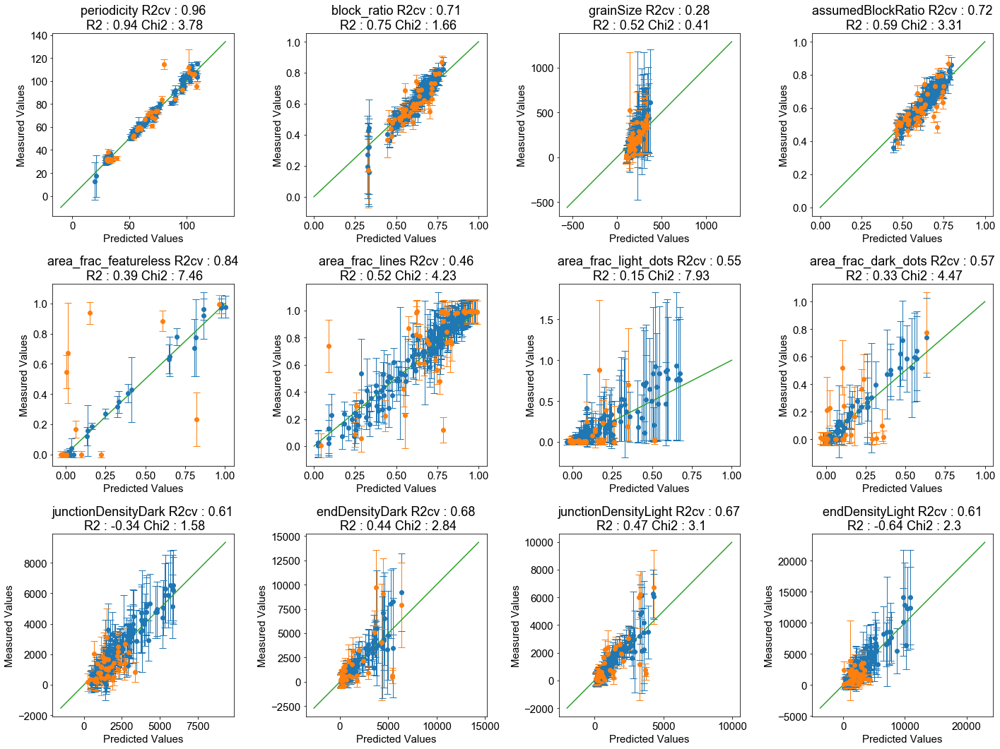

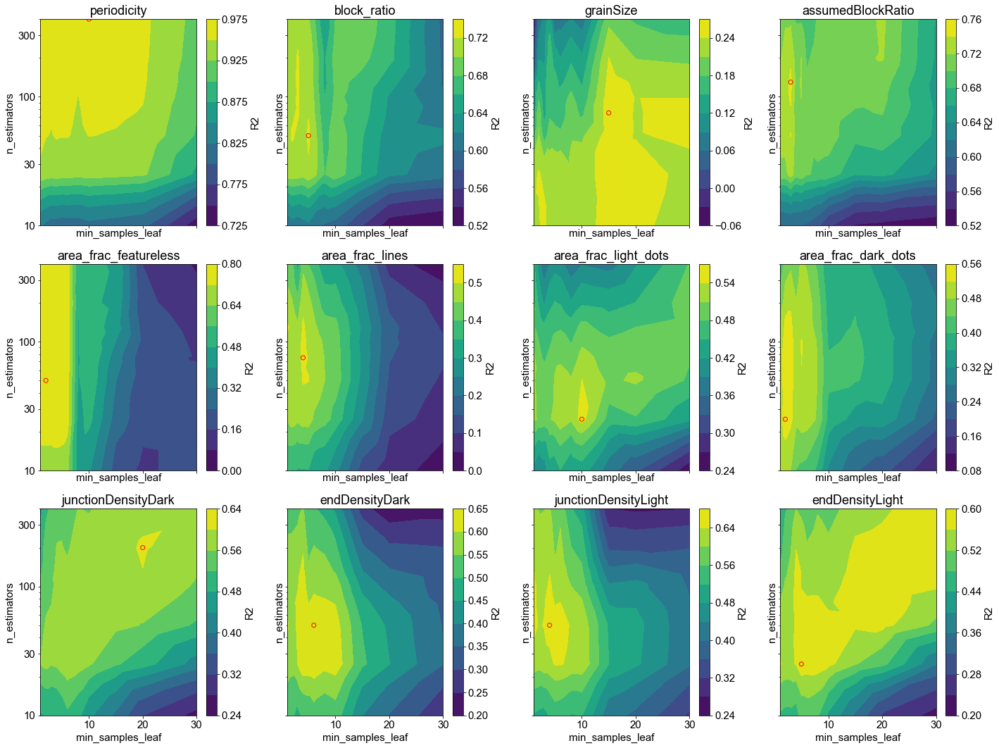

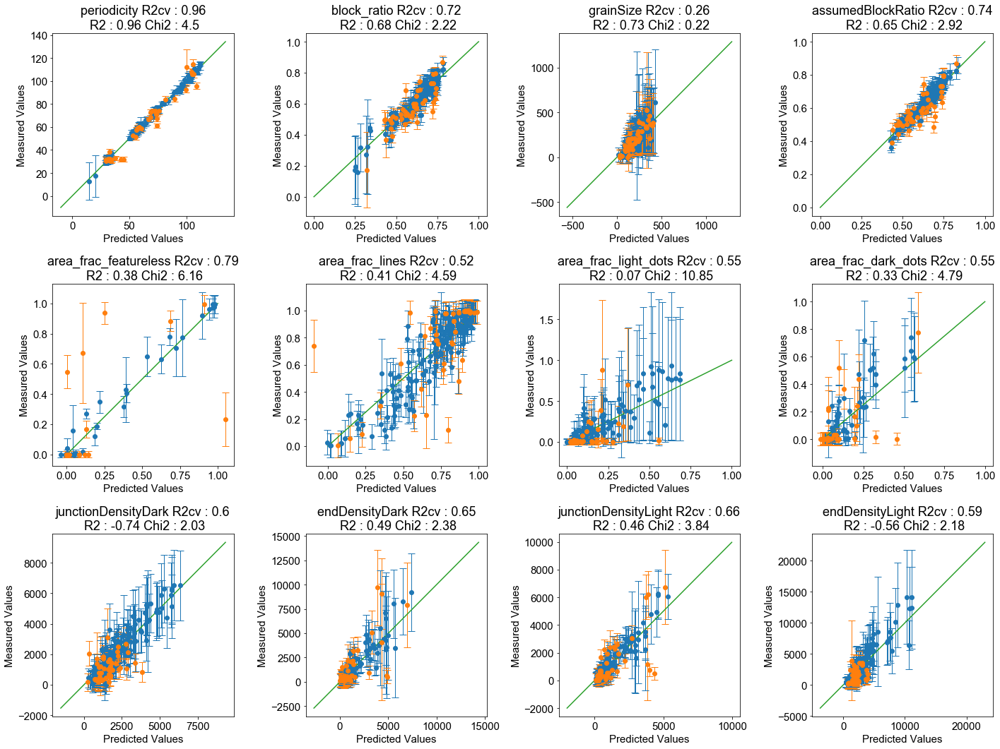

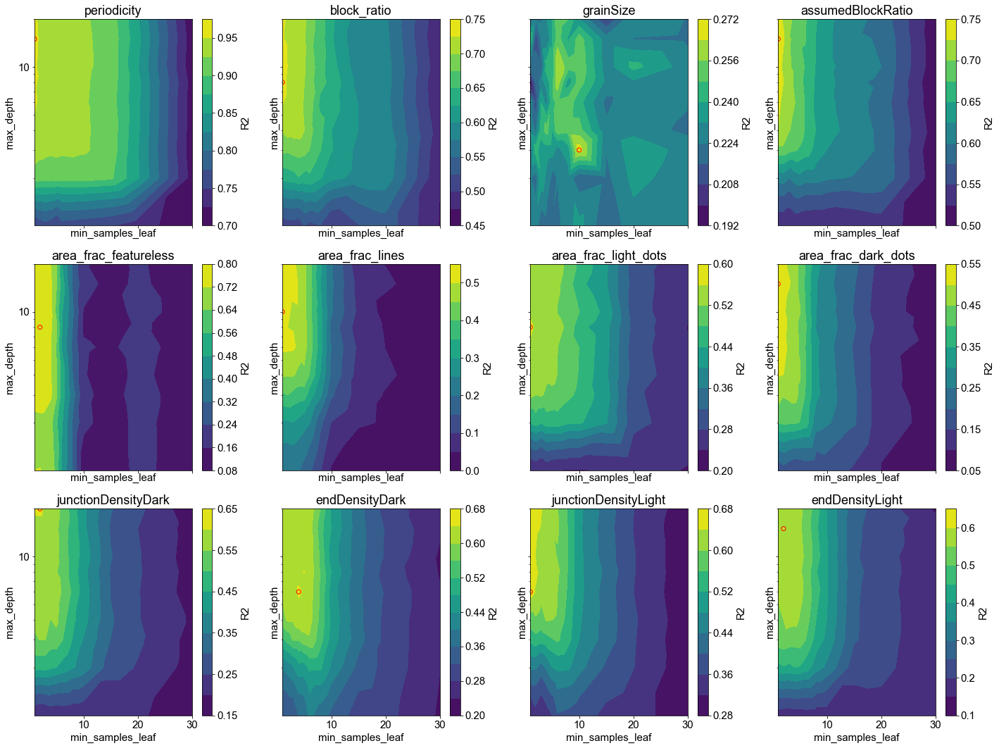

...

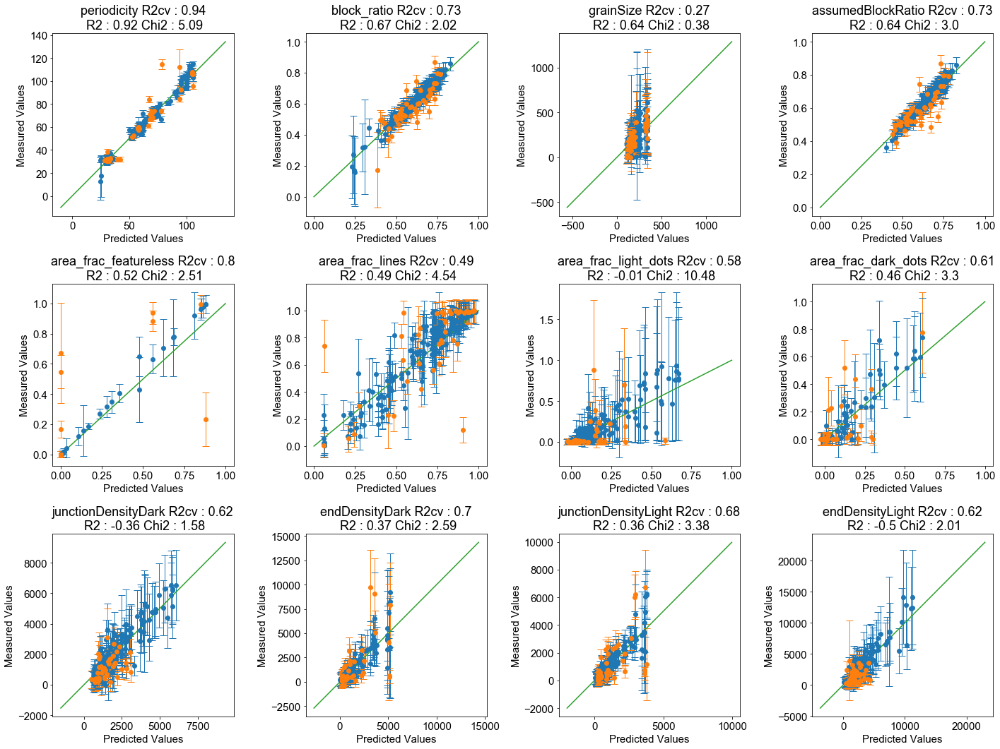

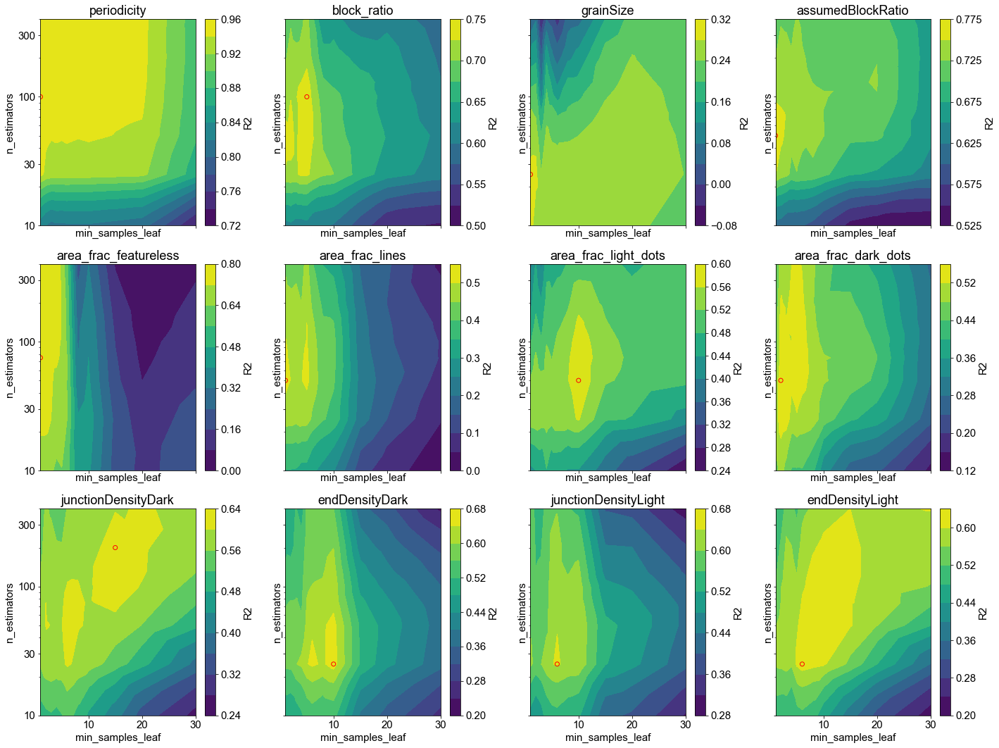

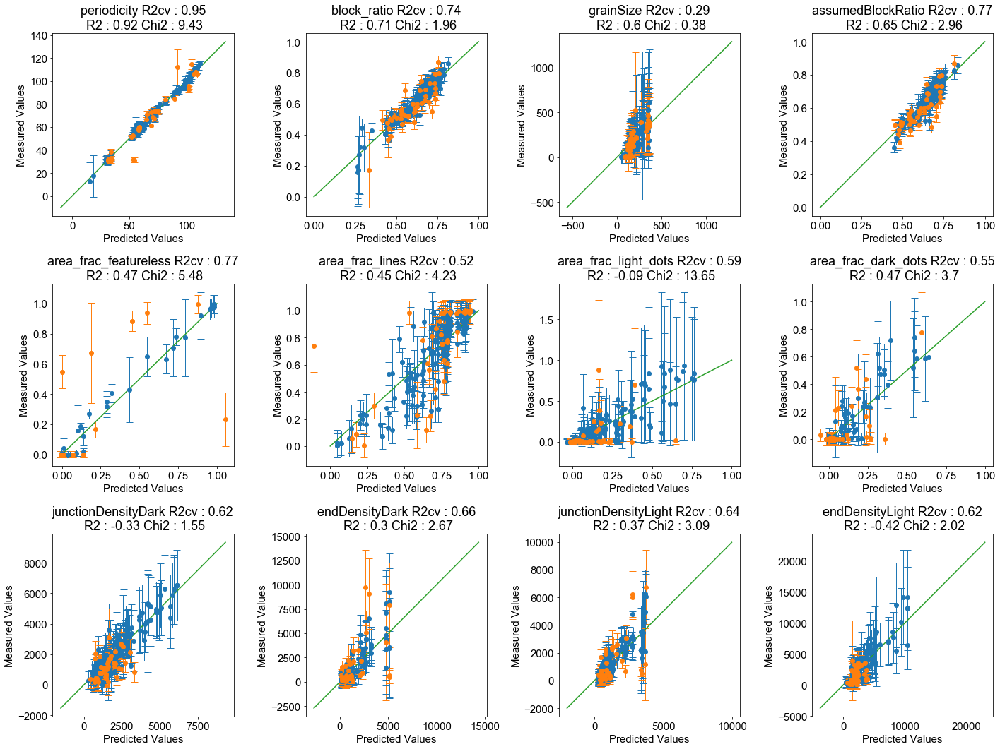

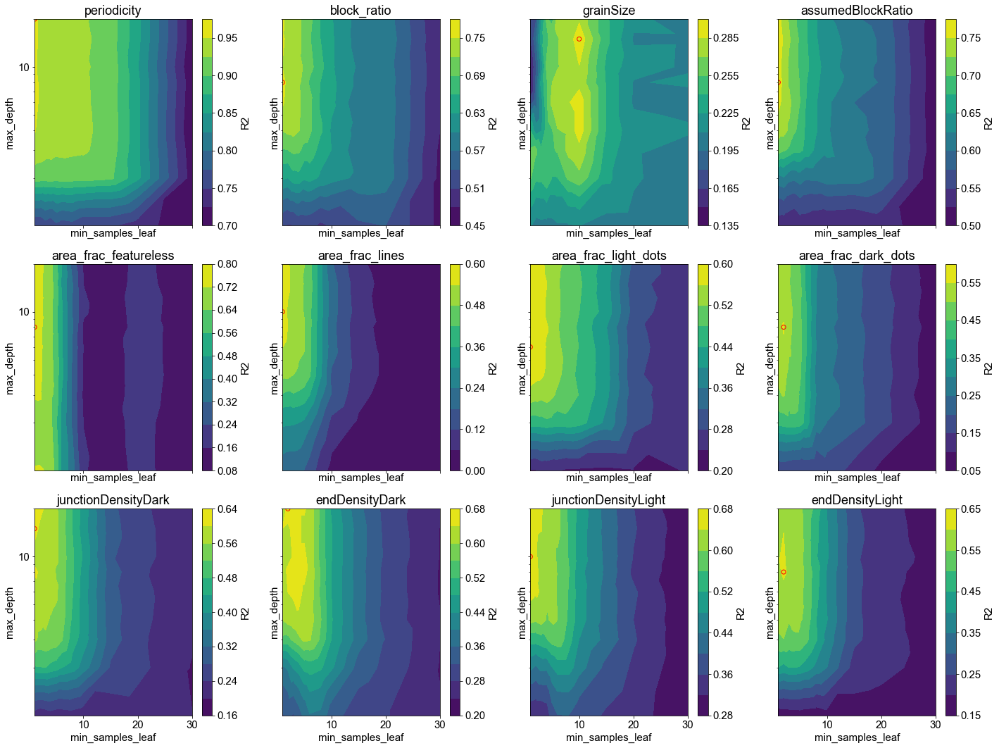

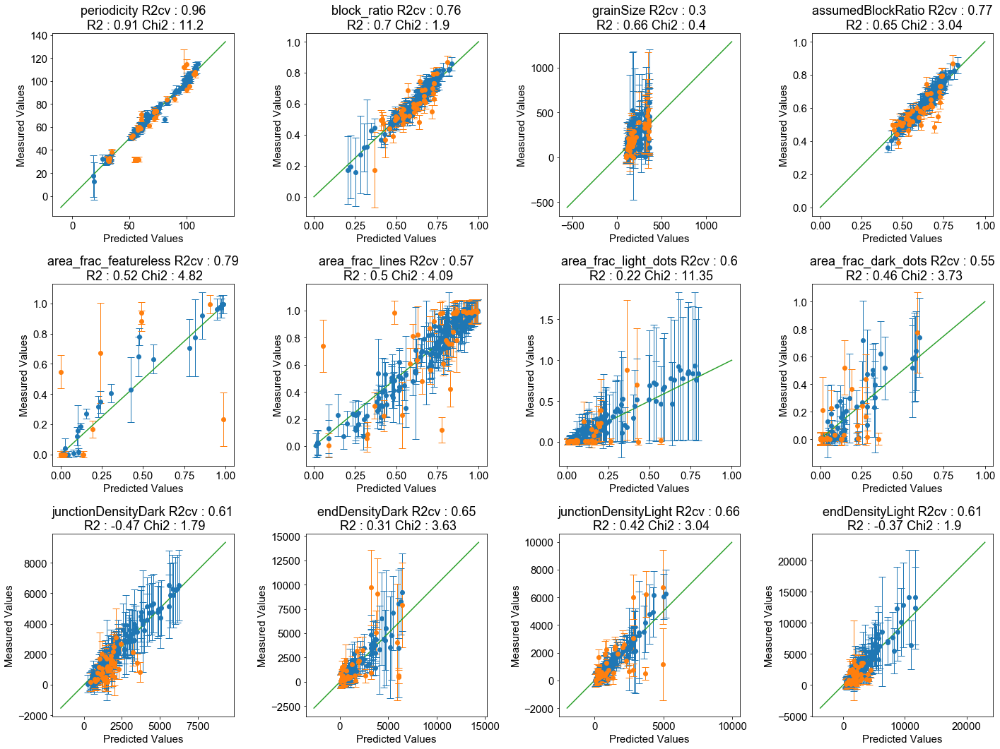

In [101]:
# option1.05 - use only inputs with average feature importance over 5 %
# option1.1 - use only inputs with average feature importance over 10 %

option105d = run_cv_tests(lgbr(boosting_type='dart'),GBR_params,ins_05,predicts1,'O105DBGR')
option105g = run_cv_tests(gbr(),GBR_params,ins_05,predicts1,'O105GBR')
option105r = run_cv_tests(rfr(),RFR_params,ins_05,predicts1,'O105RFR')

option11d = run_cv_tests(lgbr(boosting_type='dart'),GBR_params,ins_10,predicts1,'O110DBGR')
option11g = run_cv_tests(gbr(),GBR_params,ins_10,predicts1,'O110GBR')
option11r = run_cv_tests(rfr(),RFR_params,ins_10,predicts1,'O110RFR')

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

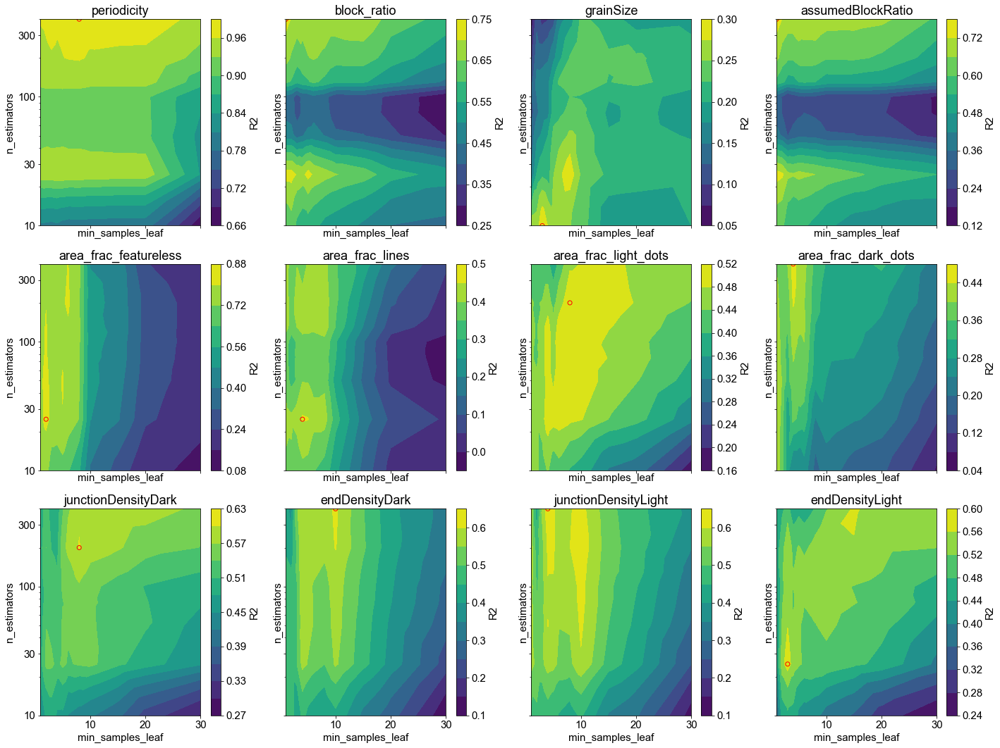

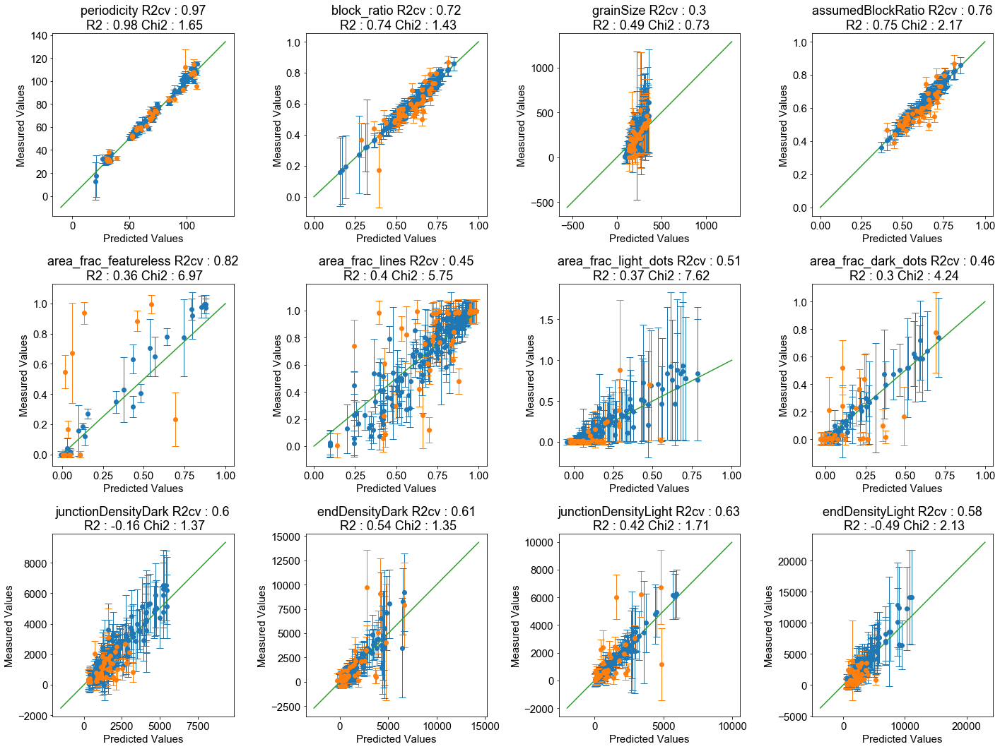

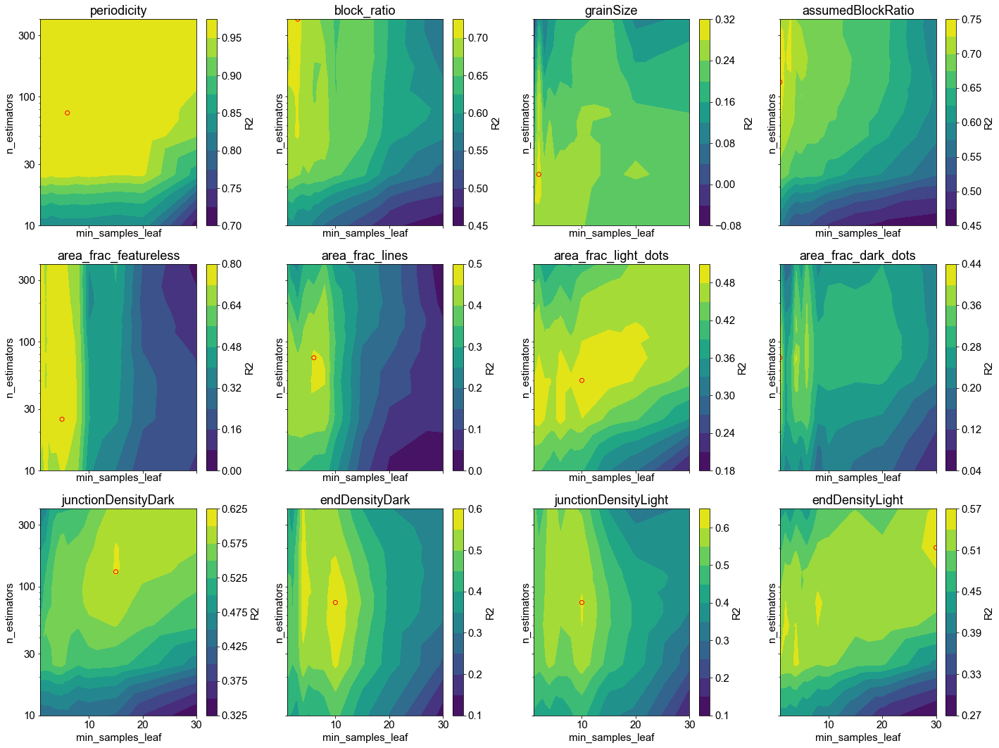

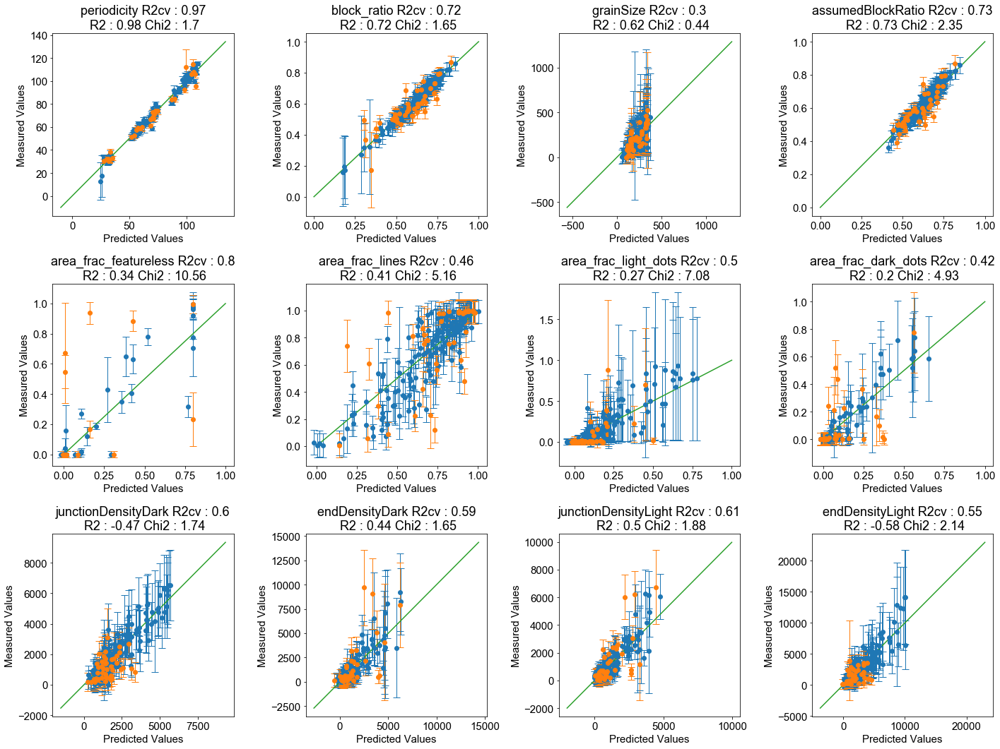

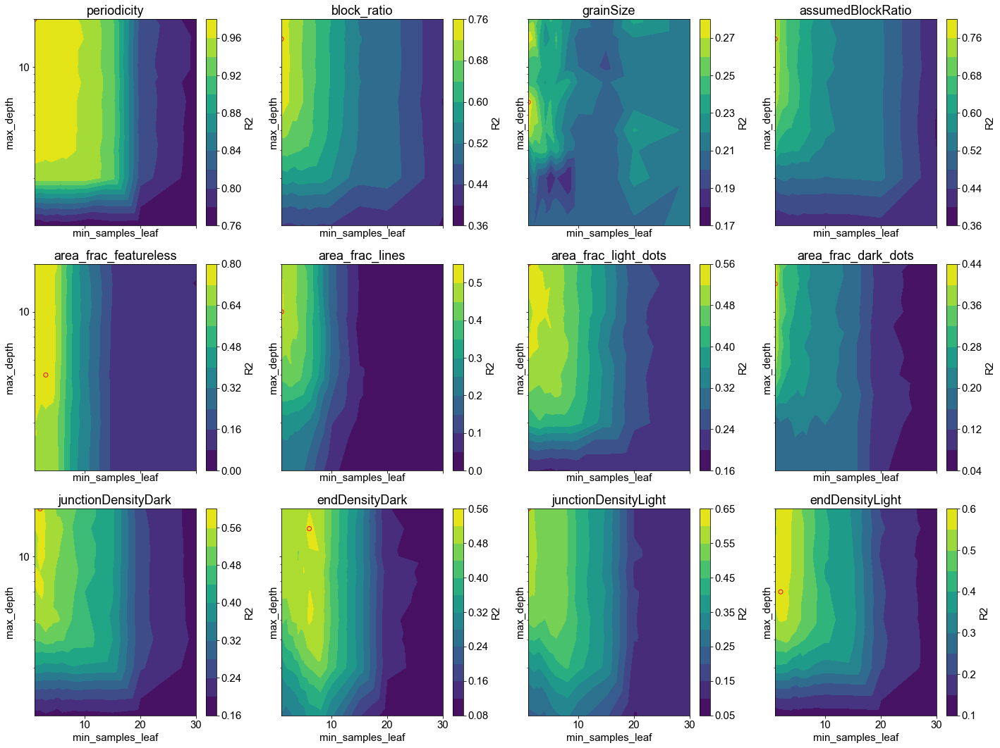

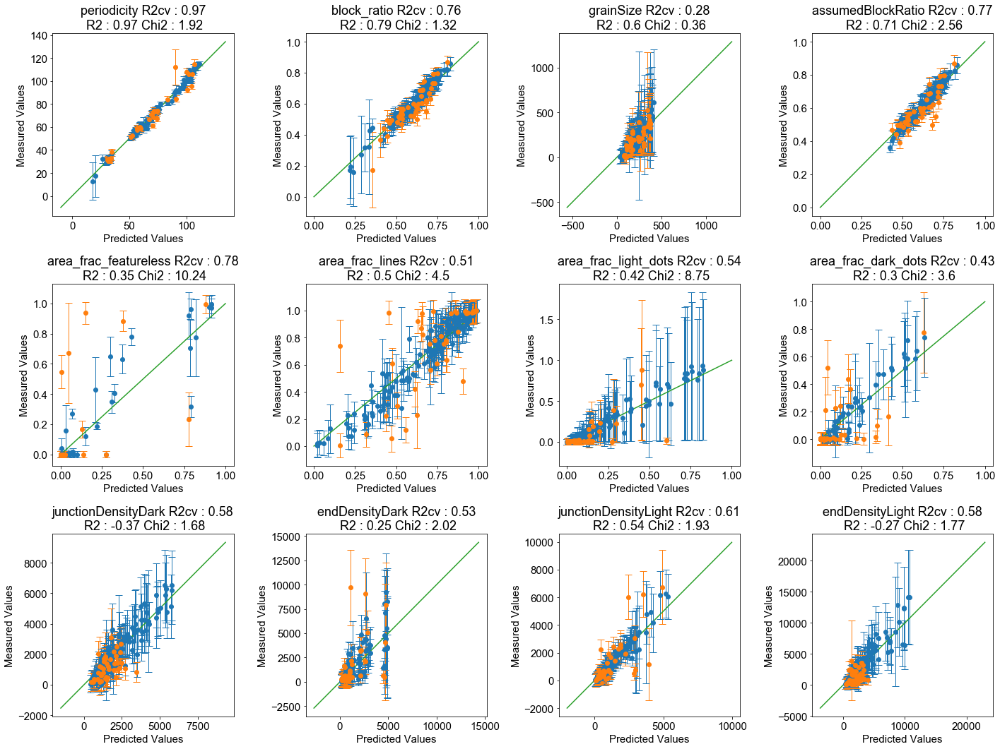

In [102]:
# option 1_s: fit all data on simple inputs
option1s_d = run_cv_tests(lgbr(boosting_type='dart'),GBR_params,ins_simple,predicts1,'O1sDBGR')
option1s_g = run_cv_tests(gbr(),GBR_params,ins_simple,predicts1,'O1sGBR')
option1s_r = run_cv_tests(rfr(),RFR_params,ins_simple,predicts1,'O1s0RFR')

In [103]:
### option 2: fit all data on chiN_eff and ratioWithNPs with GBC regressors

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

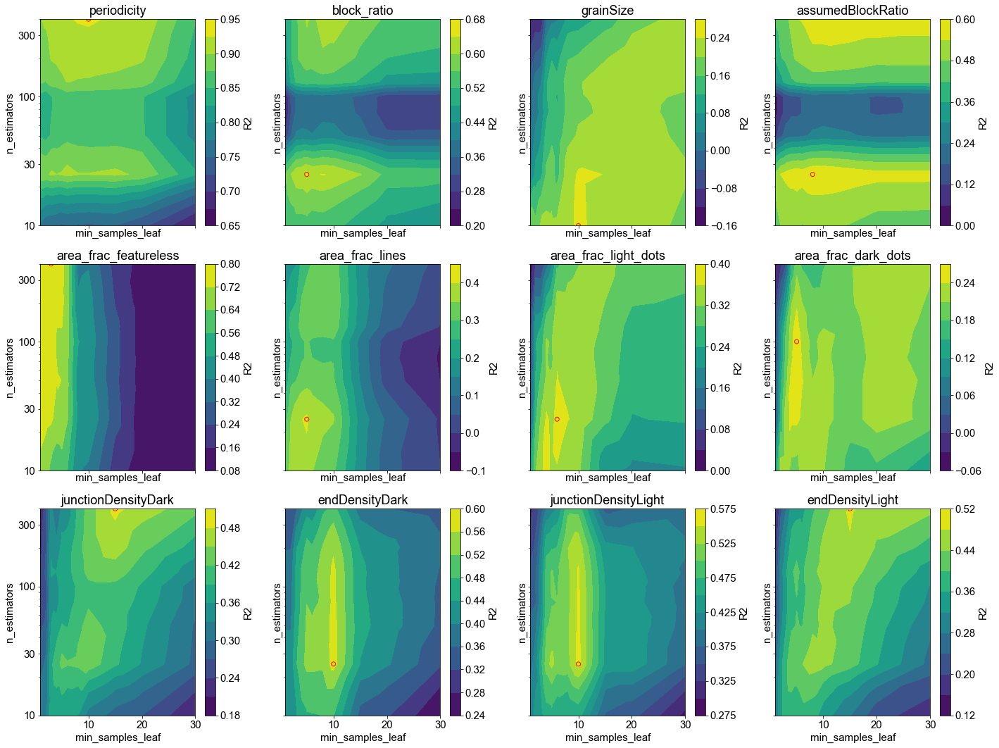

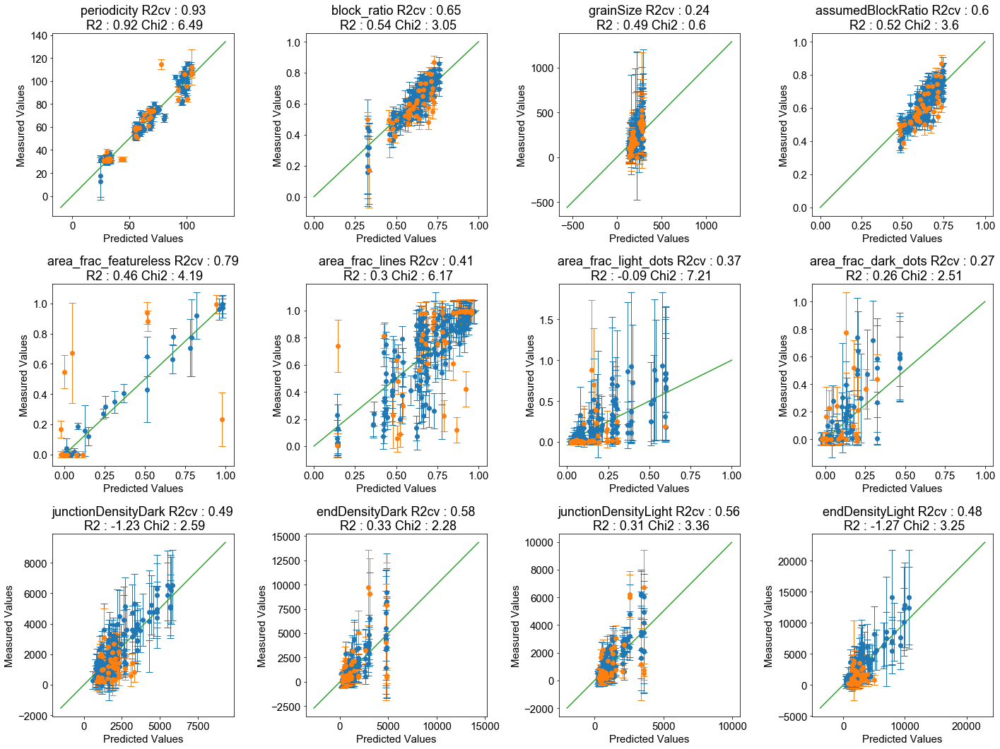

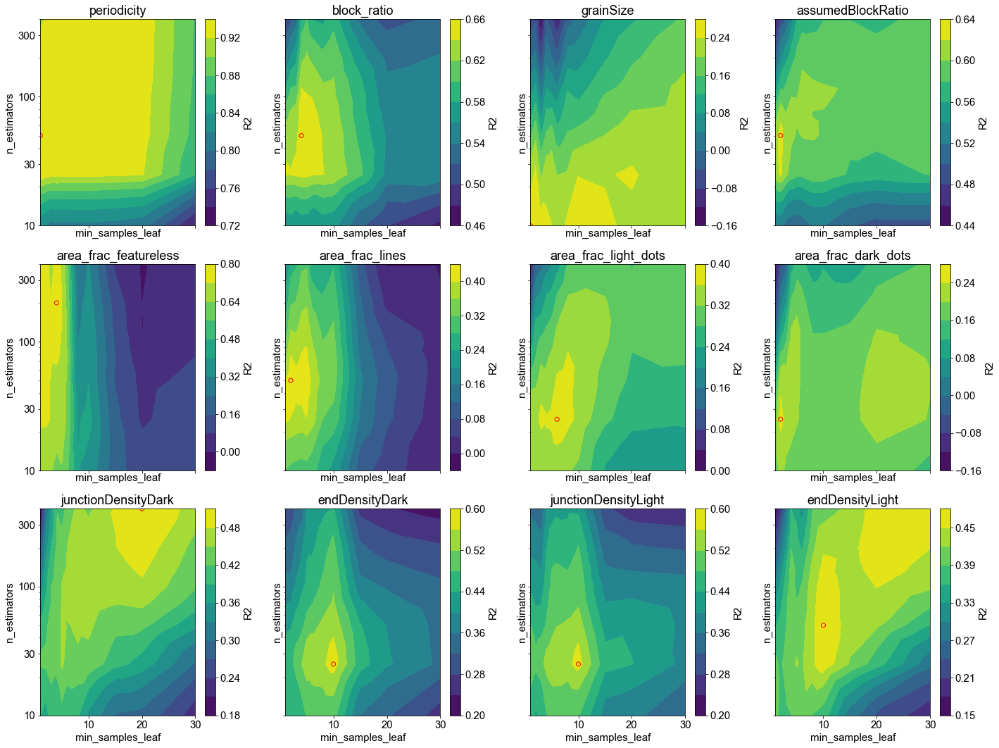

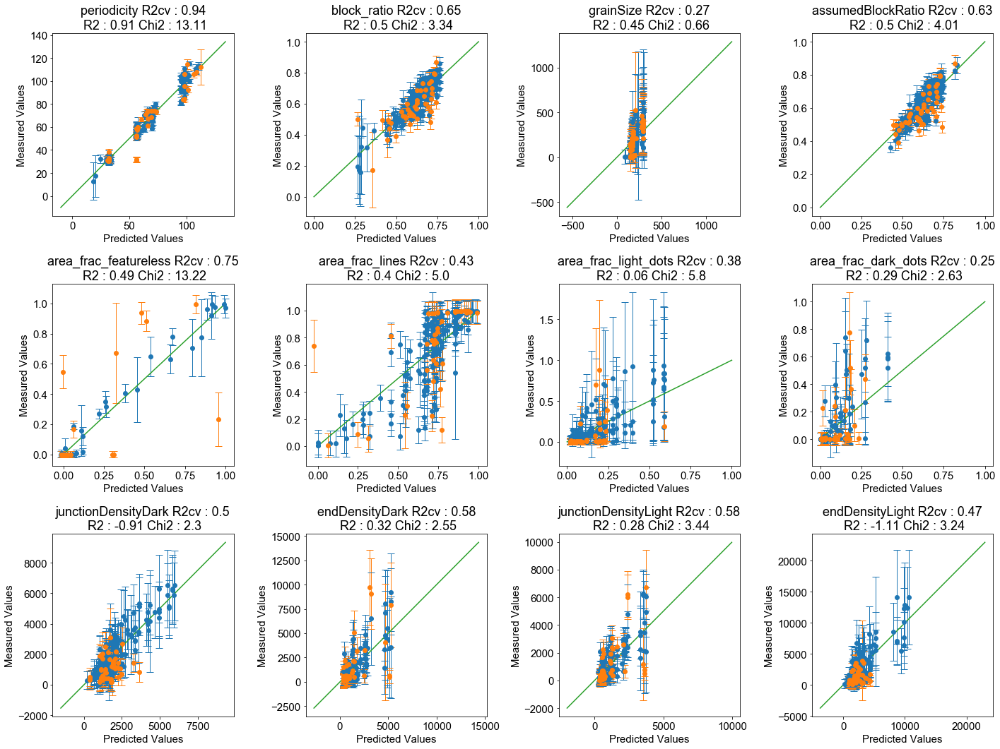

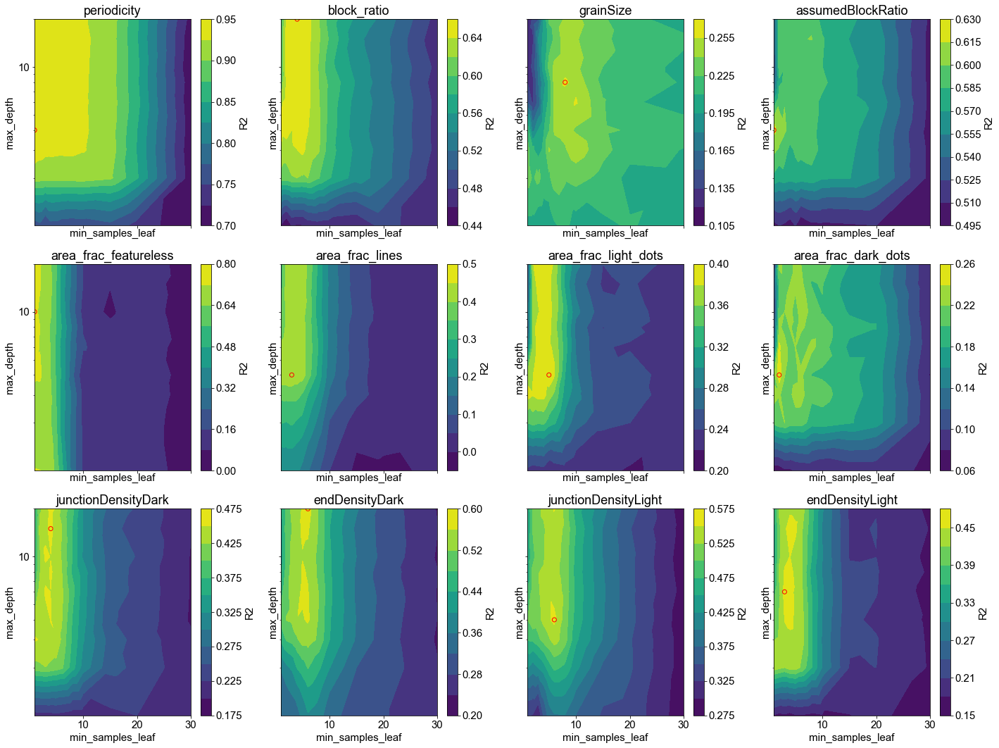

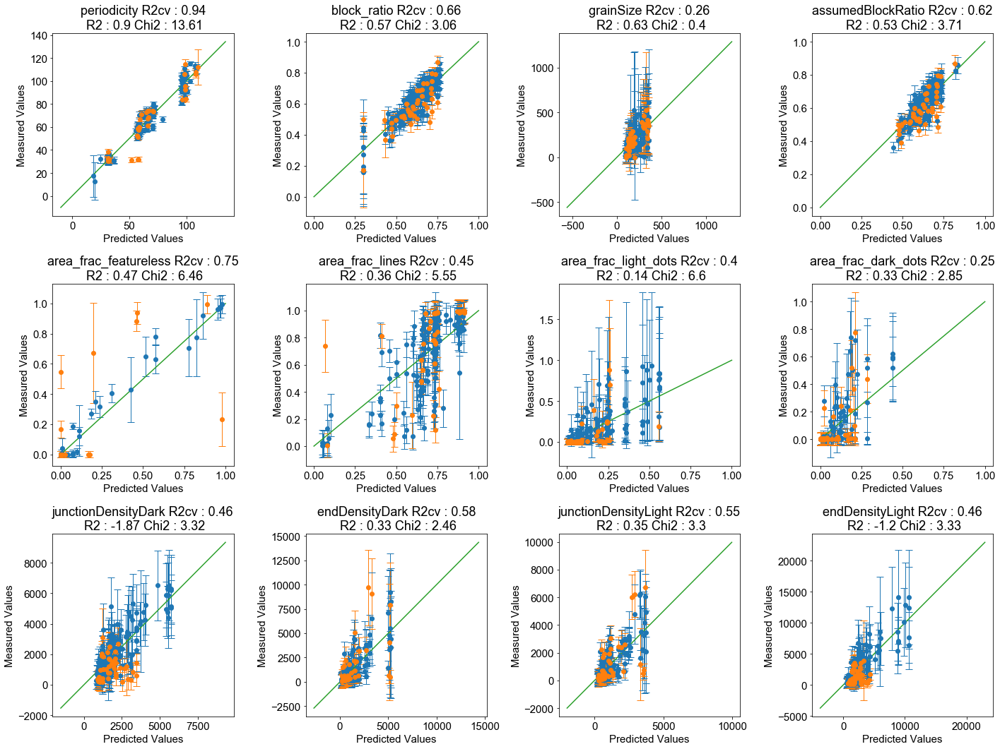

In [104]:
option2d = run_cv_tests(lgbr(boosting_type='dart'),GBR_params,['chiN_eff','ratioWithNPs'],predicts1,'O2DBGR')
option2g = run_cv_tests(gbr(),GBR_params,['chiN_eff','ratioWithNPs'],predicts1,'O2GBR')
option2r = run_cv_tests(rfr(),RFR_params,['chiN_eff','ratioWithNPs'],predicts1,'O2RFR')

(2500, 2)
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=30. Current value: min_data_in_leaf=30


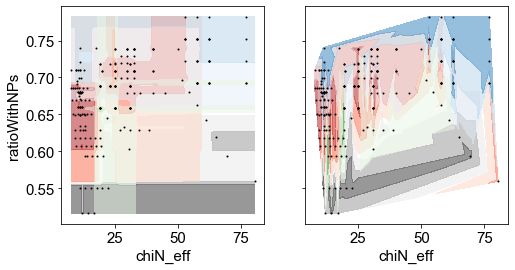

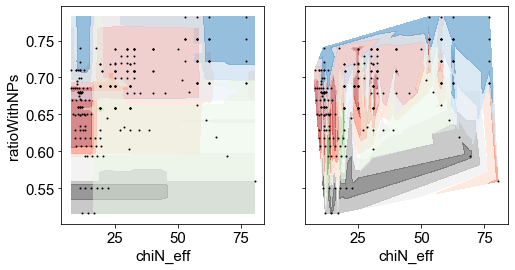

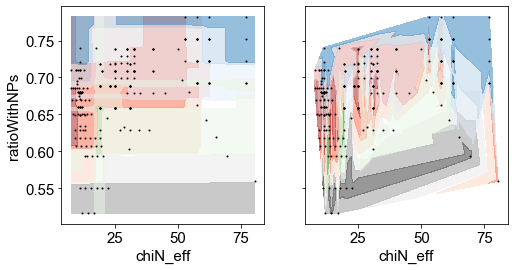

In [105]:
ins_specific = ['chiN_eff','ratioWithNPs']
range1 = [min(combi_datan[ins_specific[0]]),max(combi_datan[ins_specific[0]])]
range2 = [min(combi_datan[ins_specific[1]]),max(combi_datan[ins_specific[1]])]

X,Y = np.meshgrid(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50))
inputs = np.hstack([X.reshape(-1,1),Y.reshape(-1,1)])
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option2d[pi+2][1]
    trained_e.fit(combi_datan[ins_specific],combi_datan[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],combi_datan[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],s = 1,color = 'k')
plt.show()    
fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option2r[pi+2][1]
    trained_e.fit(combi_datan[ins_specific],combi_datan[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],combi_datan[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],s = 1,color = 'k')
plt.show()
fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option2g[pi+2][1]
    trained_e.fit(combi_datan[ins_specific],combi_datan[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],combi_datan[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datan[ins_specific[0]],combi_datan[ins_specific[1]],s = 1,color = 'k')
plt.show()  

In [106]:
# option 3: fit block_ratio data and then fit all data on chiN_eff and predicted block_ratio

In [24]:
def run_cv_test_p_first(model,model_params,ins_specific,predicts,name,p_first,p_first_model = gbr(min_samples_leaf = 9,n_estimators = 50,learning_rate = 0.1),p_first_ins = ins_ch):
    option = []

    plt.figure(1)
    fig1,ax1 = plt.subplots(2,4,sharex = True, sharey = True,figsize = (20,10))
    ax1 = [ax for sublist in ax1 for ax in sublist]
    plt.figure(2)
    fig2,ax2 = plt.subplots(2,4,figsize = (20,15))
    ax2 = [ax for sublist in ax2 for ax in sublist]
    par1,par2 = model_params.keys()
    ins_final = ins_specific[::]
    for predict in predicts:
        Xn_train,Xn_test,yn_train,yn_test,en_train,en_test = train_test_split(combi_datan[ins_specific],combi_datan[predict],combi_errors.loc[combi_datan.index,predict],train_size = 0.8,random_state=42)

        ni = len(option)
        for p in p_first:
            p_first_model.fit(combi_datan.loc[Xn_train.index,p_first_ins],combi_datan.loc[Xn_train.index,p])
            Xn_train['p_' + p] = p_first_model.predict(combi_datan.loc[Xn_train.index,p_first_ins])
            Xn_test['p_' + p] = p_first_model.predict(combi_datan.loc[Xn_test.index,p_first_ins])
        
        
        kf = KF(n_splits = cvn)
        gscv = GridSearchCV(model,model_params,cv = kf,n_jobs = -1,scoring = 'r2')
        gscv.fit(Xn_train,yn_train)
        gscv_results = pd.DataFrame.from_dict(gscv.cv_results_)

        nax1 = ax1[ni].tricontourf(gscv_results['param_' + par1],gscv_results['param_' + par2],gscv_results['mean_test_score'],levels = 10)
        ax1[ni].set_xlabel(par1)
        ax1[ni].set_ylabel(par2)
        fig1.colorbar(nax1,ax = ax1[ni], label = 'R2')
        ax1[ni].set_yscale('log')
        ax1[ni].set_yticks([10,30,100,300]) 
        ax1[ni].set_yticklabels([10,30,100,300]) 
        ax1[ni].set_xlim(min(gscv_results['param_' + par1]),max(gscv_results['param_' + par1]))
        ax1[ni].set_ylim(min(gscv_results['param_' + par2]),max(gscv_results['param_' + par2]))

        ax1[ni].set_title(predict)
        ax1[ni].scatter(gscv.best_params_[par1],gscv.best_params_[par2],edgecolor = 'r',facecolor = 'None')
        Chi2 = np.sum(((gscv.predict(Xn_test)-yn_test)/en_test)**2/len(yn_test))
        ax2[ni].errorbar(gscv.predict(Xn_train),yn_train,yerr = en_train,linewidth = 0, marker = 'o',elinewidth = 1,capthick = 1,capsize = 5)
        ax2[ni].errorbar(gscv.predict(Xn_test),yn_test,yerr = en_test,linewidth = 0, marker = 'o',elinewidth = 1,capthick = 1,capsize = 5)
        if max(yn_test) < 1.1:
            ax2[ni].plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1))
        else:
            y_max,y_min = ax2[ni].get_ylim()
            ax2[ni].plot(np.linspace(y_max,y_min,10),np.linspace(y_max,y_min,10))

        ax2[ni].set_title(predict + ' R2cv : ' + str(round(gscv.best_score_,2)) + '\n R2 : ' + str(round(gscv.score(Xn_test,yn_test),2)) + ' Chi2 : ' + str(round(Chi2,2)))
        ax2[ni].set_xlabel('Predicted Values')
        ax2[ni].set_ylabel('Measured Values')

        option.append((predict,gscv,gscv_results,gscv.score(Xn_test,yn_test),Chi2))

    fig1.tight_layout()
    fig1.savefig(name + '_CVmap.pdf',format = 'pdf')
    fig1.show()


    fig2.tight_layout()
    fig2.savefig(name + '_Results.pdf',format = 'pdf')
    fig2.show()
    return option

In [26]:
predicts2 = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots',
             'junctionDensityDark','endDensityDark', 'junctionDensityLight','endDensityLight']

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

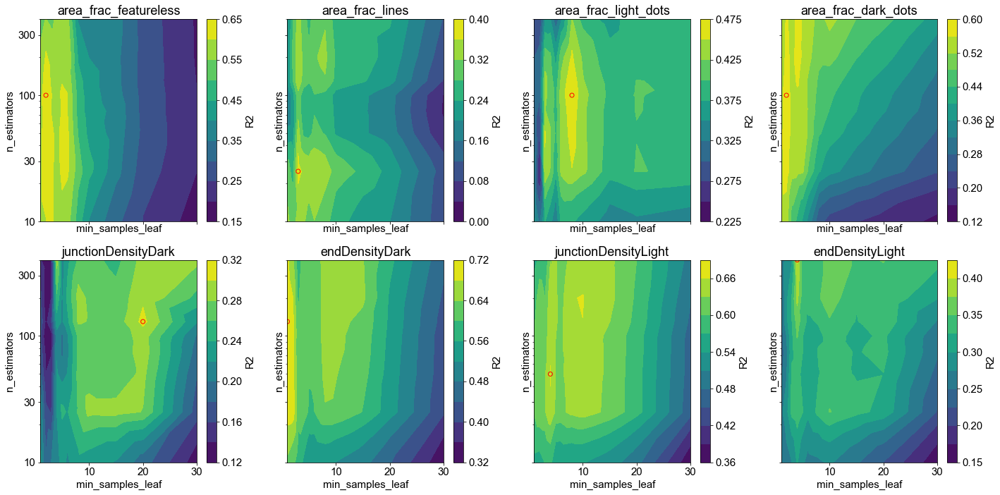

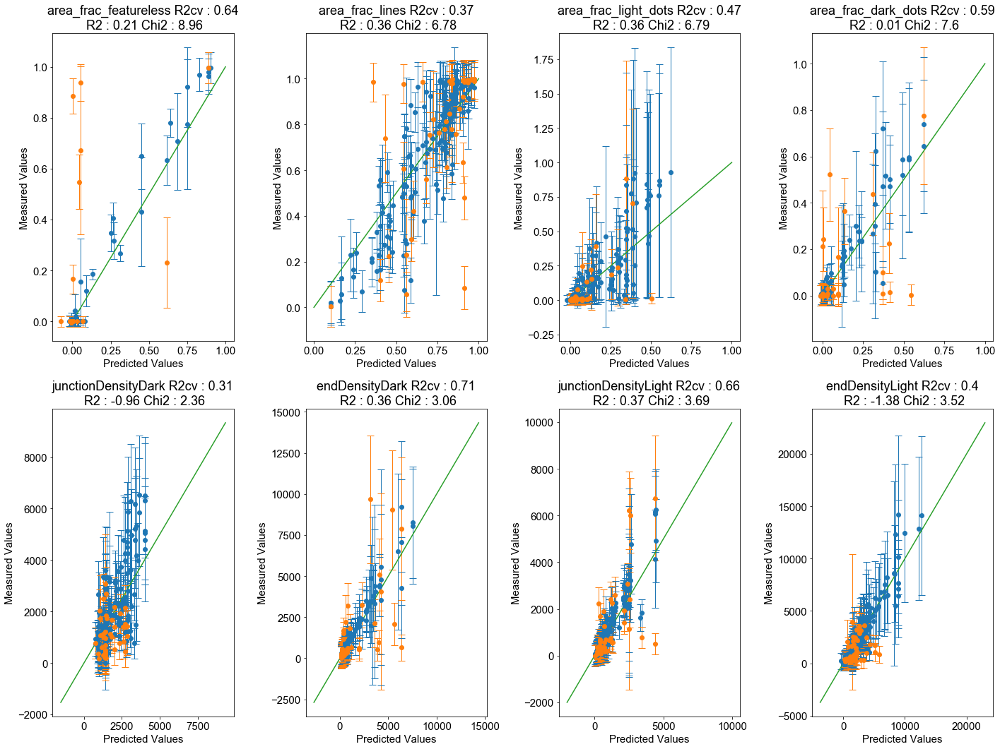

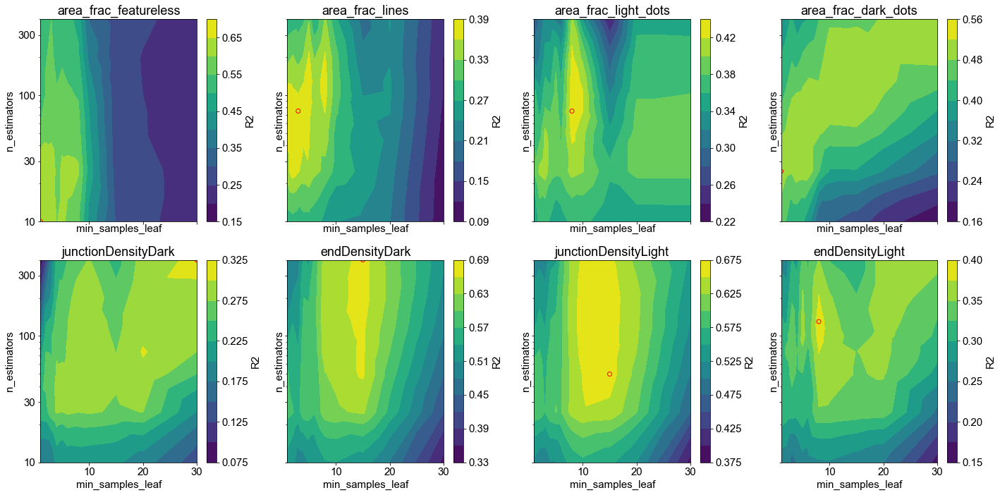

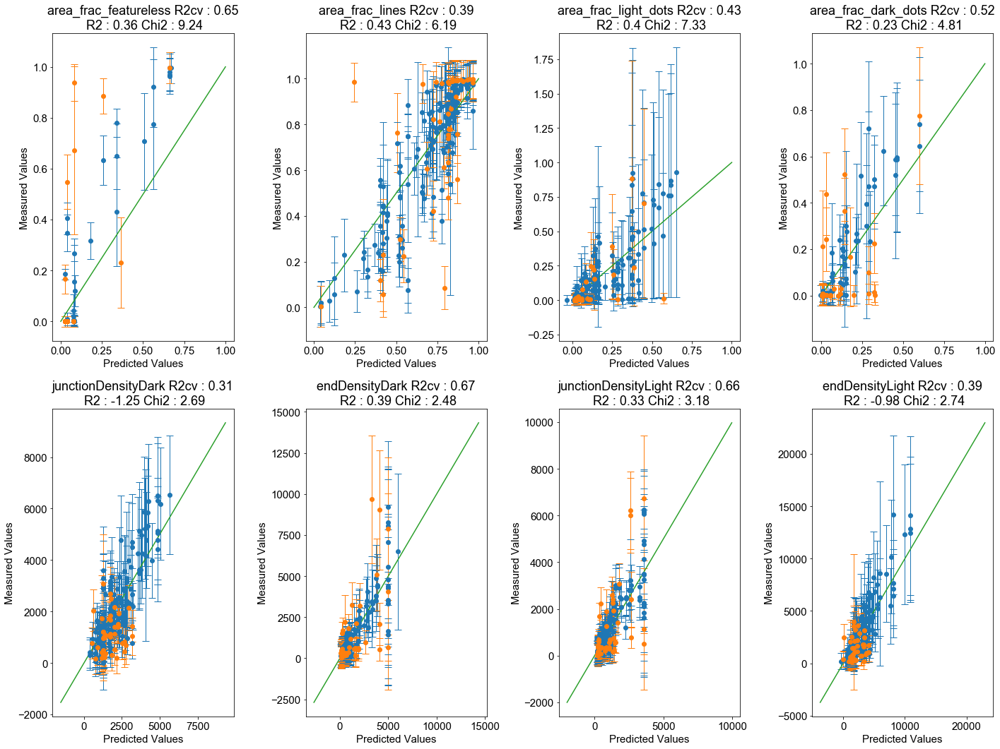

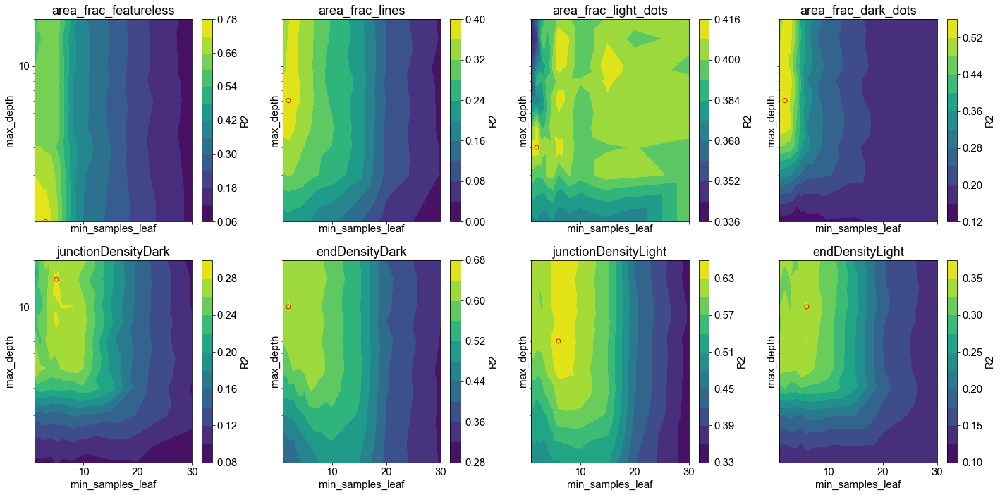

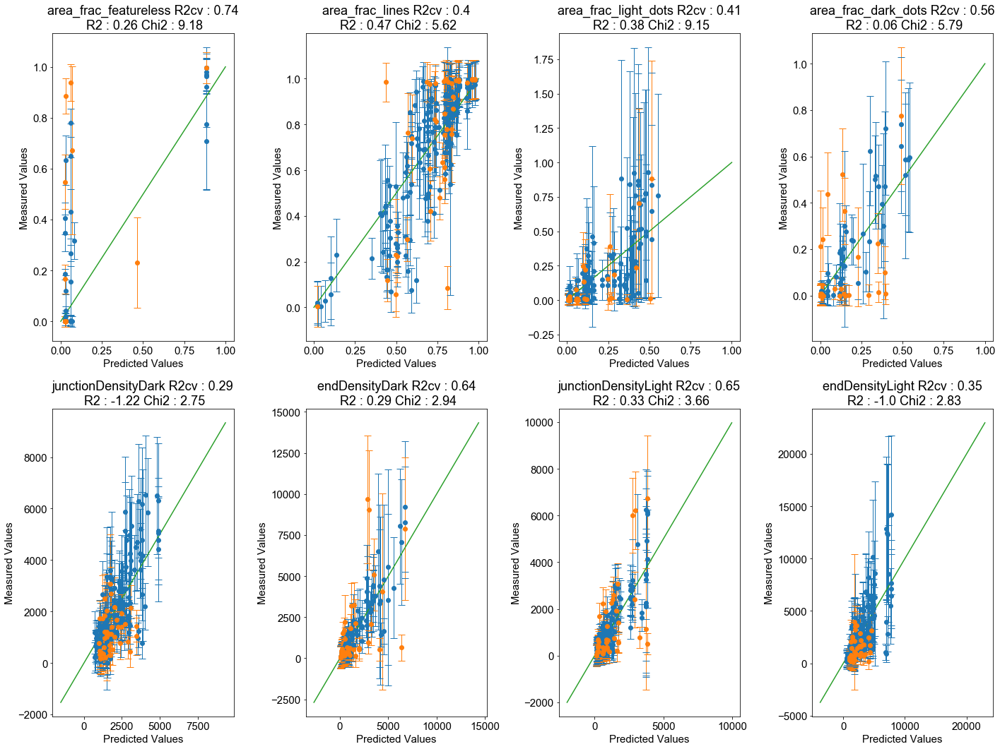

In [109]:
option3d = run_cv_test_p_first(lgbr(boosting_type='dart'),GBR_params,['ratioWithNPs'],predicts2,'O3DBGR',['block_ratio'])
option3g = run_cv_test_p_first(gbr(),GBR_params,['ratioWithNPs'],predicts2,'O3GBR',['block_ratio'])
option3r = run_cv_test_p_first(rfr(),RFR_params,['ratioWithNPs'],predicts2,'O3RFR',['block_ratio'])

(2500, 2)
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6


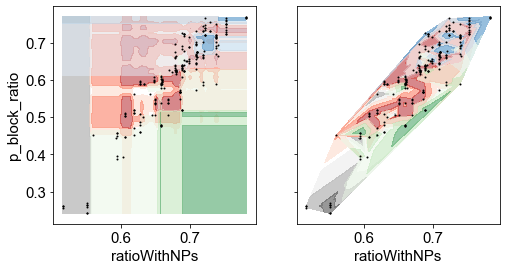

(2500, 2)


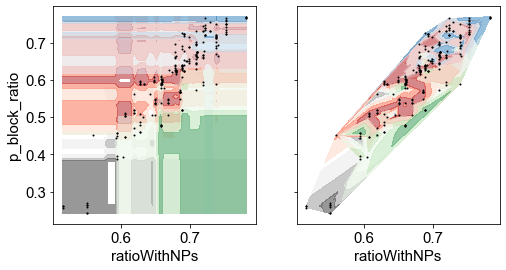

(2500, 2)


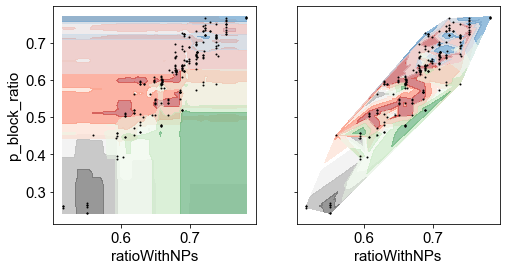

In [110]:
combi_datapn = combi_datan
GBR = gbr(min_samples_leaf = 9,n_estimators = 50,learning_rate = 0.1)
ptrain = combi_datapn.sample(frac = 0.8)
GBR.fit(ptrain[ins_ch],ptrain['block_ratio'])
combi_datapn['p_block_ratio'] = GBR.predict(combi_datapn[ins_ch])


ins_specific = ['ratioWithNPs','p_block_ratio']

range1 = [min(combi_datapn[ins_specific[0]]),max(combi_datapn[ins_specific[0]])]
range2 = [min(combi_datapn[ins_specific[1]]),max(combi_datapn[ins_specific[1]])]
X,Y = np.meshgrid(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50))
inputs = np.hstack([X.reshape(-1,1),Y.reshape(-1,1)])
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option3d[pi][1]
    trained_e.fit(combi_datapn[ins_specific],combi_datapn[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],combi_datapn[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
plt.show()   

fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option3g[pi][1]
    trained_e.fit(combi_datapn[ins_specific],combi_datapn[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],combi_datapn[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
plt.show()  

fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option3r[pi][1]
    trained_e.fit(combi_datapn[ins_specific],combi_datapn[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],combi_datapn[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
plt.show()  

In [111]:
# option 4: p_block_ratio and chiN_eff

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=30. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

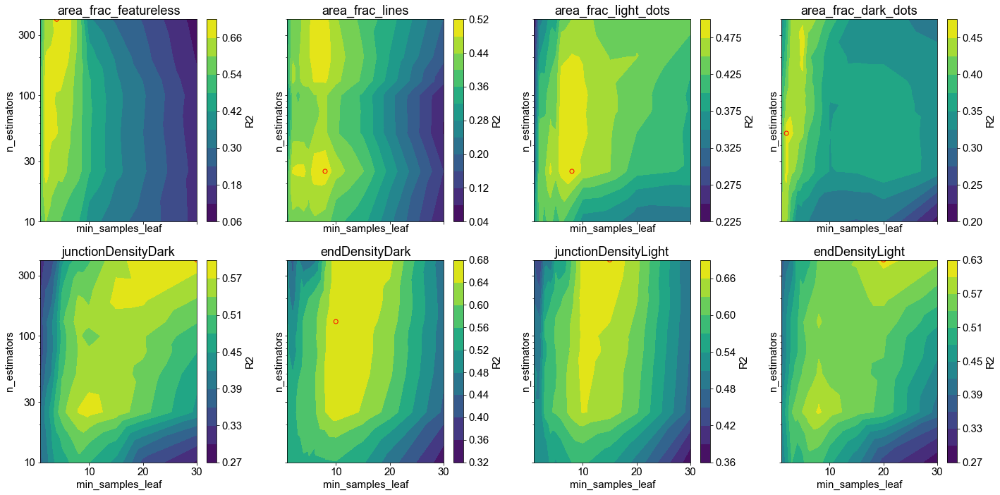

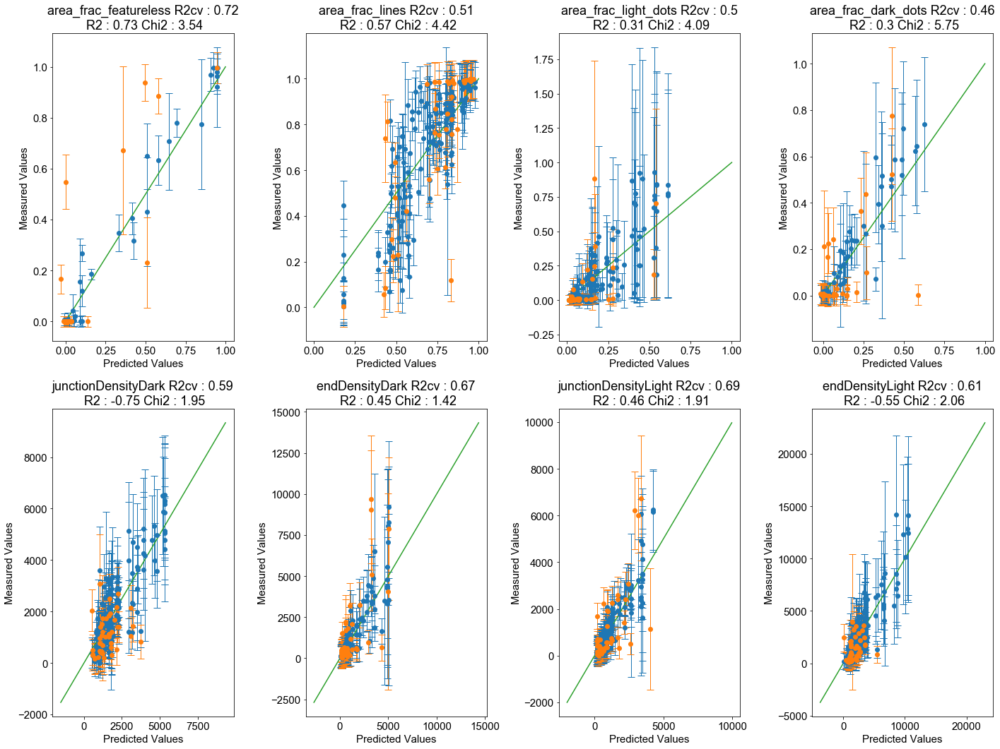

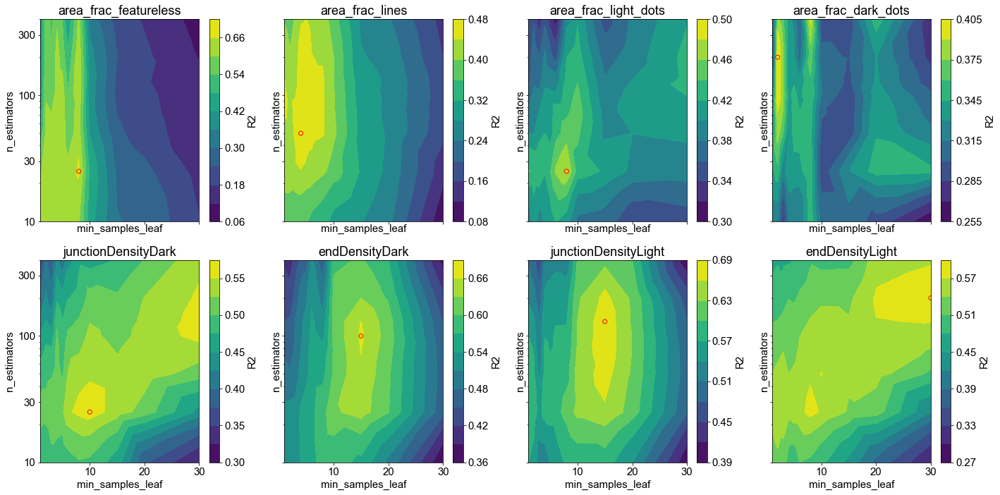

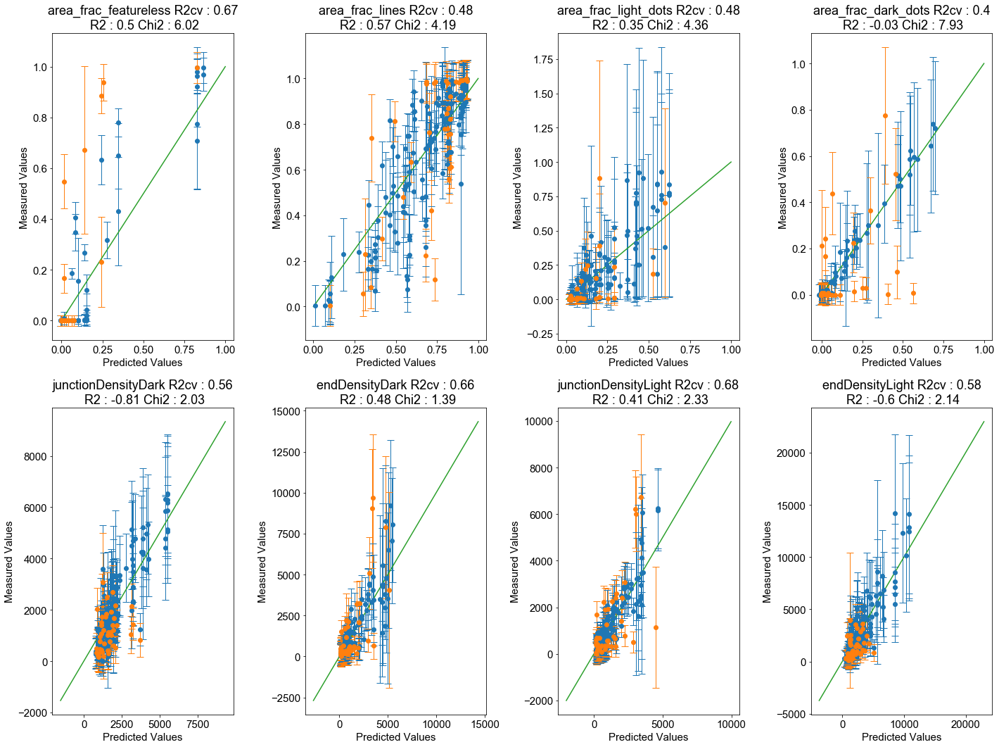

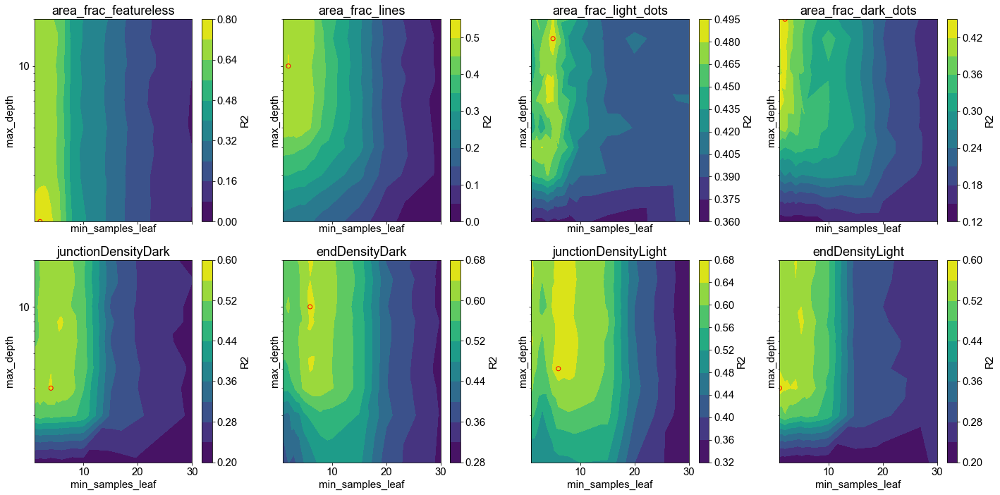

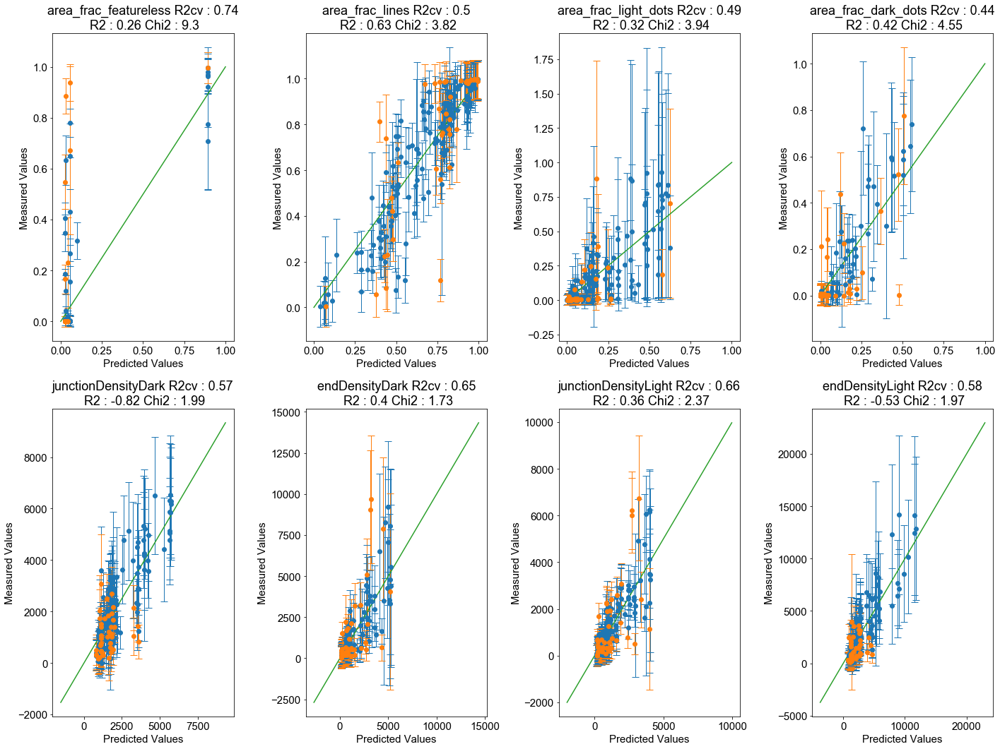

In [112]:
option4d = run_cv_test_p_first(lgbr(boosting_type='dart'),GBR_params,['chiN_eff'],predicts2,'O4DBGR',['block_ratio'])
option4g = run_cv_test_p_first(gbr(),GBR_params,['chiN_eff'],predicts2,'O4GBR',['block_ratio'])
option4r = run_cv_test_p_first(rfr(),RFR_params,['chiN_eff'],predicts2,'O4RFR',['block_ratio'])

(2500, 2)
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6


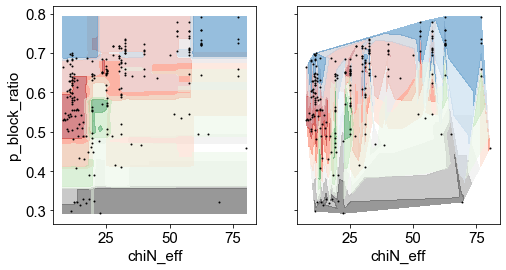

(2500, 2)


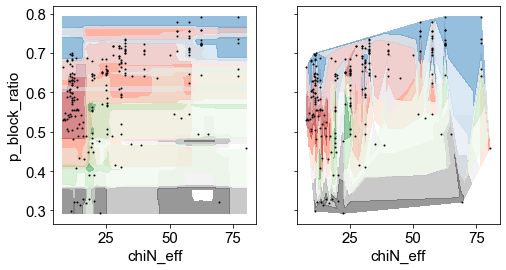

(2500, 2)


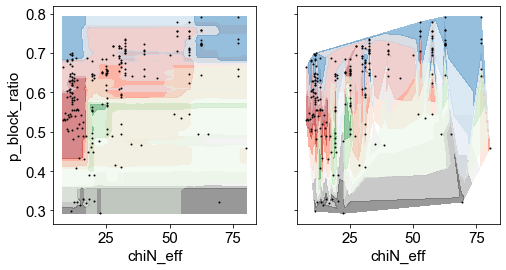

In [113]:
combi_datapn = combi_datan
GBR = gbr(min_samples_leaf = 9,n_estimators = 50,learning_rate = 0.1)
ptrain = combi_datapn.sample(frac = 0.8)
GBR.fit(ptrain[ins_ch],ptrain['block_ratio'])
combi_datapn['p_block_ratio'] = GBR.predict(combi_datapn[ins_ch])


ins_specific = ['chiN_eff','p_block_ratio']

range1 = [min(combi_datapn[ins_specific[0]]),max(combi_datapn[ins_specific[0]])]
range2 = [min(combi_datapn[ins_specific[1]]),max(combi_datapn[ins_specific[1]])]
X,Y = np.meshgrid(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50))
inputs = np.hstack([X.reshape(-1,1),Y.reshape(-1,1)])
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option4d[pi][1]
    trained_e.fit(combi_datapn[ins_specific],combi_datapn[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],combi_datapn[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
plt.show()   

fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option4g[pi][1]
    trained_e.fit(combi_datapn[ins_specific],combi_datapn[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],combi_datapn[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
plt.show()  

fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
print(inputs.shape)
predict_v = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']
for pi in range(len(predict_v)):
    predict = predict_v[pi]
    trained_e = option4r[pi][1]
    trained_e.fit(combi_datapn[ins_specific],combi_datapn[predict])
    predicted = trained_e.predict(inputs)
    ax3[0].contourf(np.linspace(range1[0],range1[1],50),np.linspace(range2[0],range2[1],50),predicted.reshape(50,50),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    ax3[1].tricontourf(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],combi_datapn[predict],cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    
ax3[0].set_xlabel(ins_specific[0])
ax3[1].set_xlabel(ins_specific[0])
ax3[0].set_ylabel(ins_specific[1])
ax3[0].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
ax3[1].scatter(combi_datapn[ins_specific[0]],combi_datapn[ins_specific[1]],s = 1,color = 'k')
plt.show()  

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

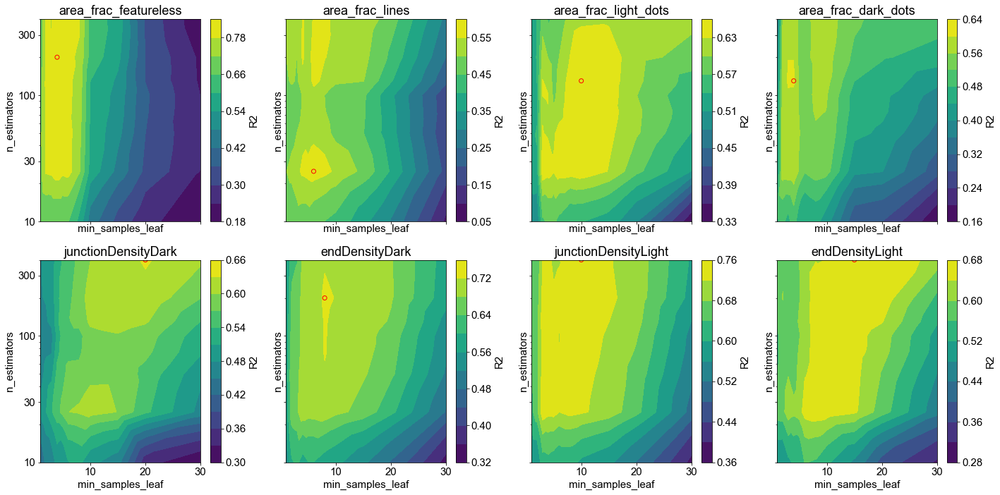

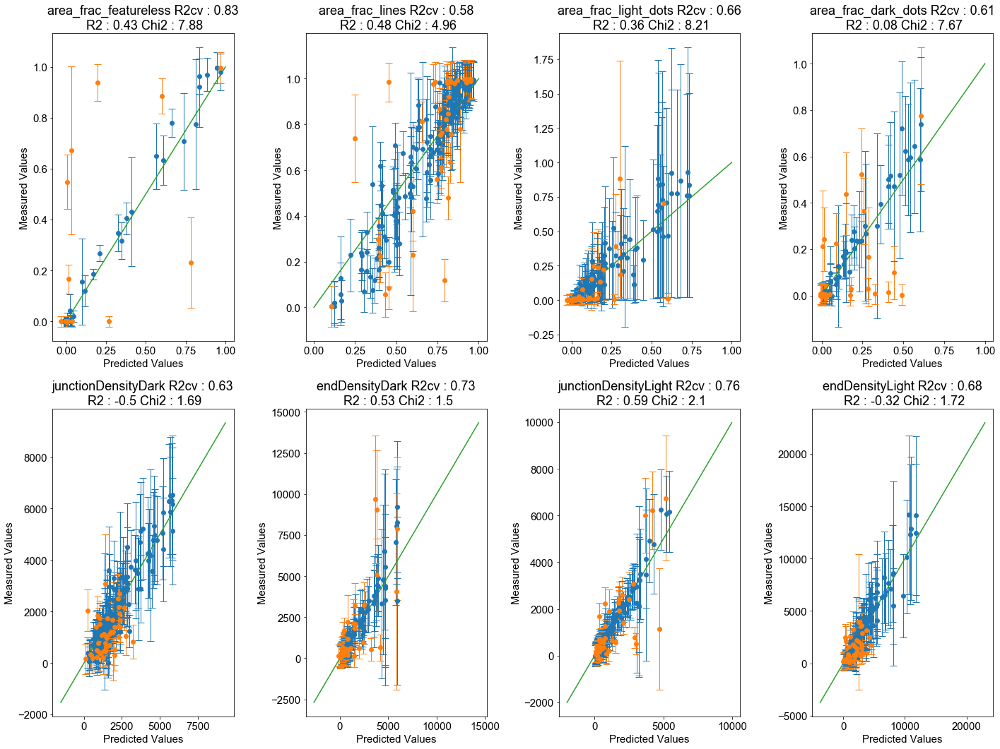

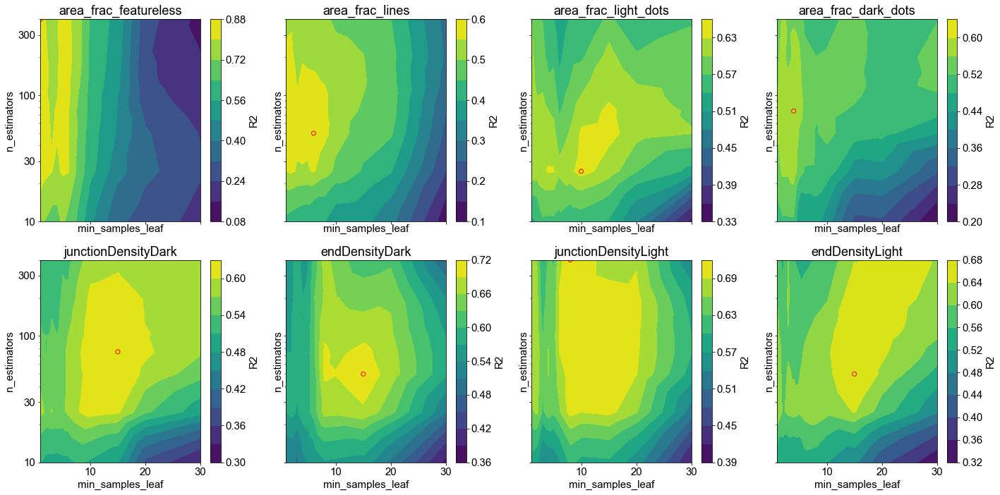

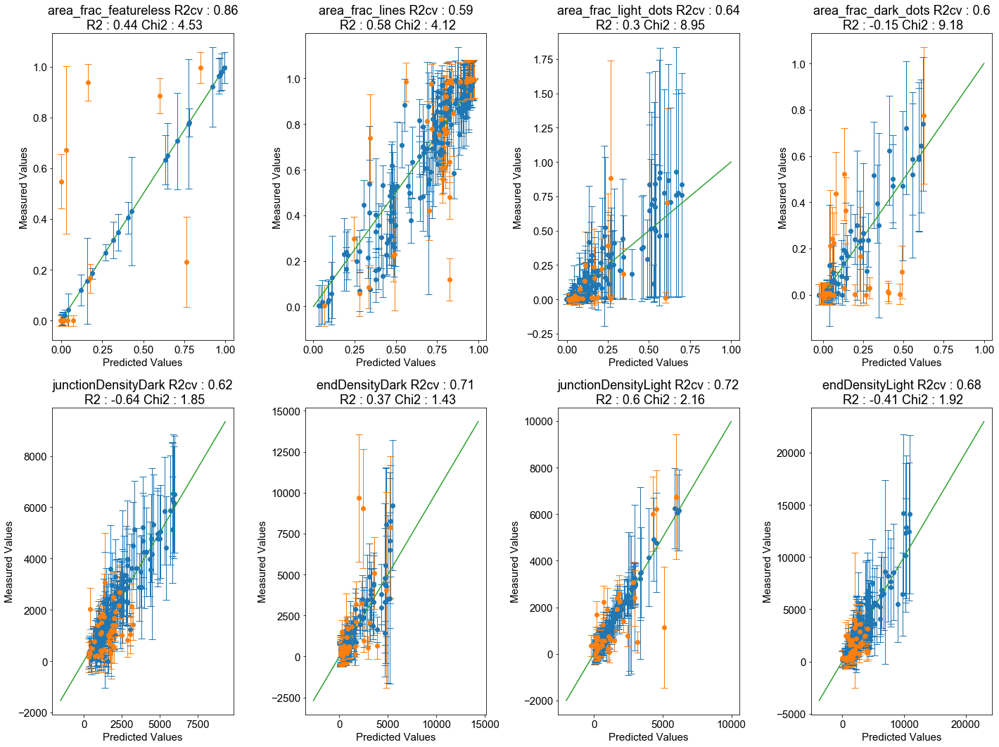

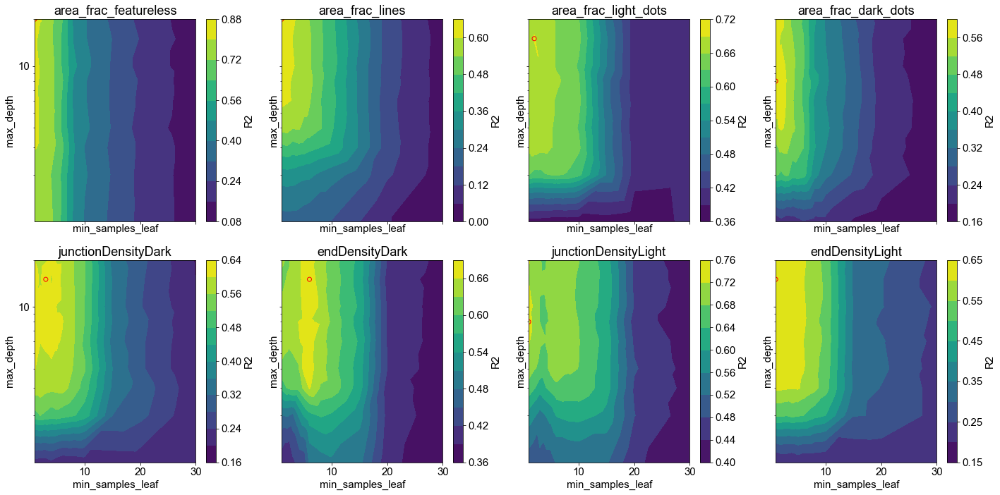

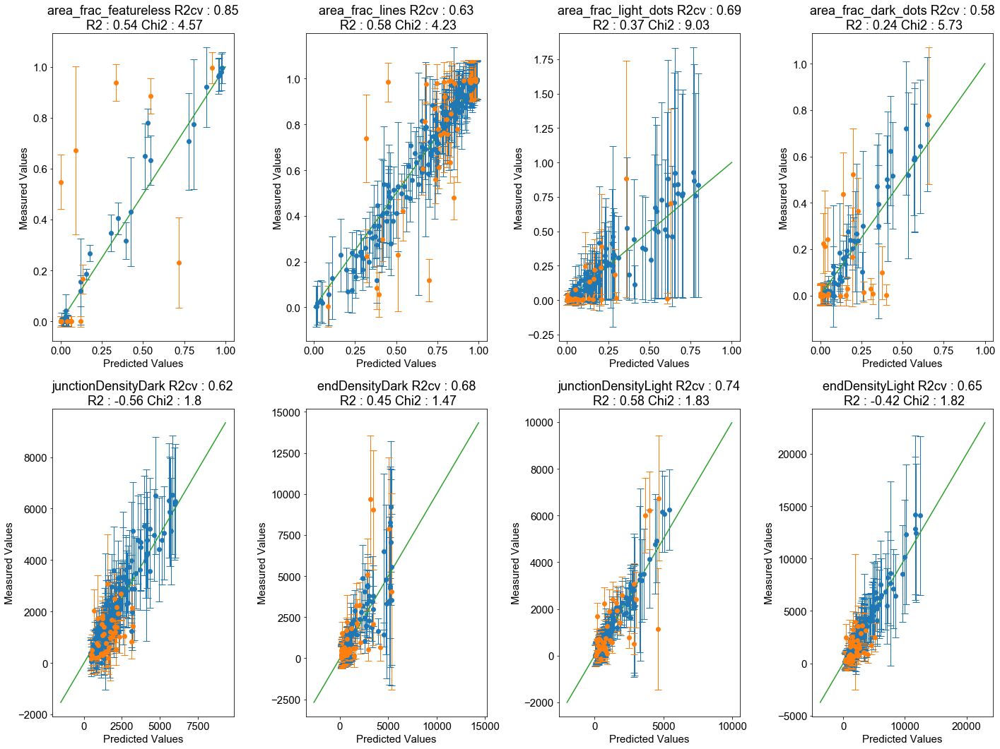

In [114]:
# option5: predicted block ratio, periodicity and all previous inputs
option5d = run_cv_test_p_first(lgbr(boosting_type='dart'),GBR_params,ins_ch,predicts2,'O5DBGR',['periodicity','block_ratio'])
option5g = run_cv_test_p_first(gbr(),GBR_params,ins_ch,predicts2,'O5GBR',['periodicity','block_ratio'])
option5r = run_cv_test_p_first(rfr(),RFR_params,ins_ch,predicts2,'O5RFR',['periodicity','block_ratio'])

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=3. Current value: min_data_in_leaf=3
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=30. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

<Figure size 432x288 with 0 Axes>

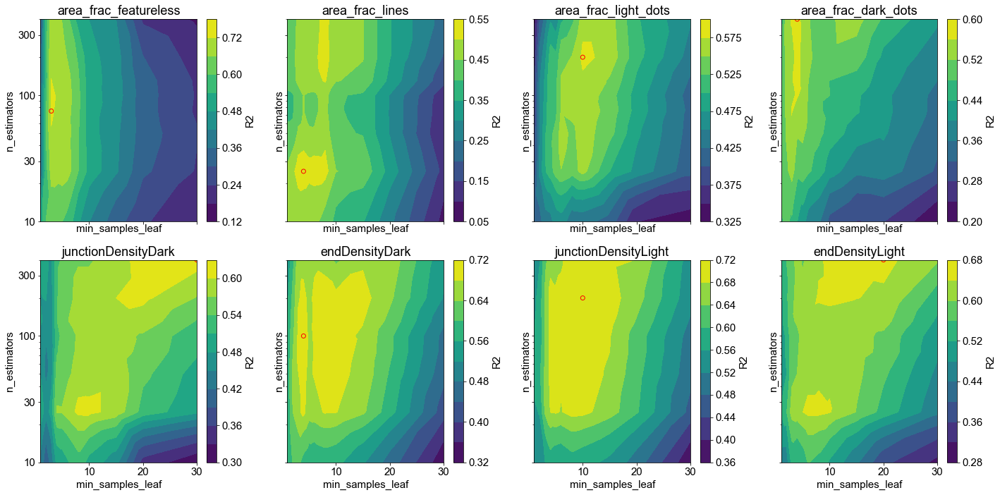

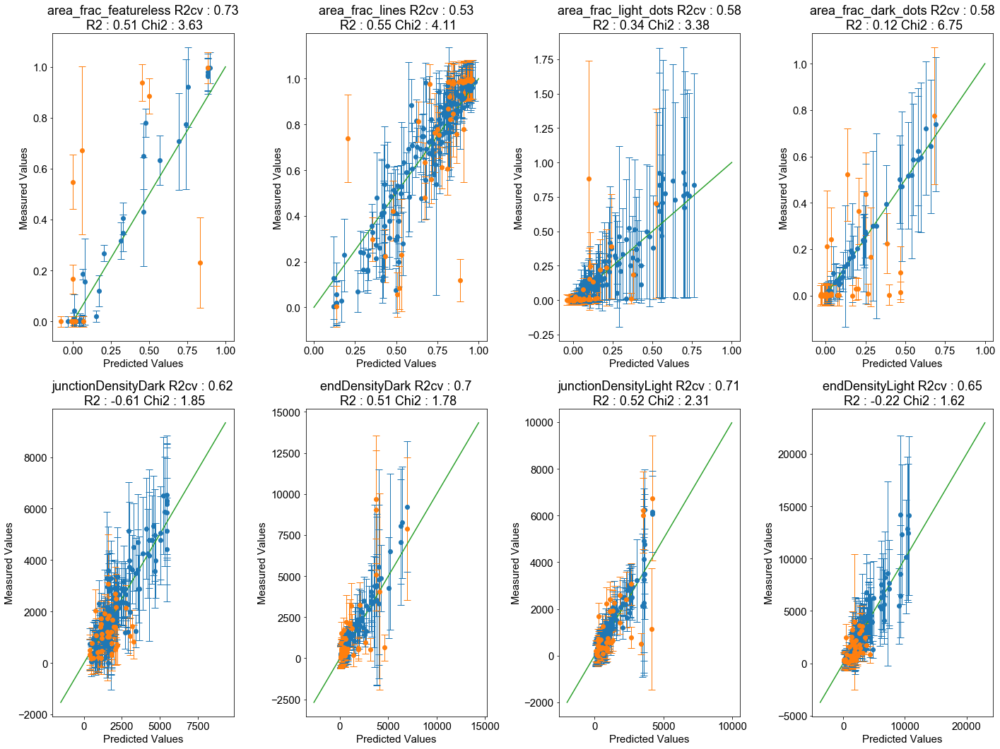

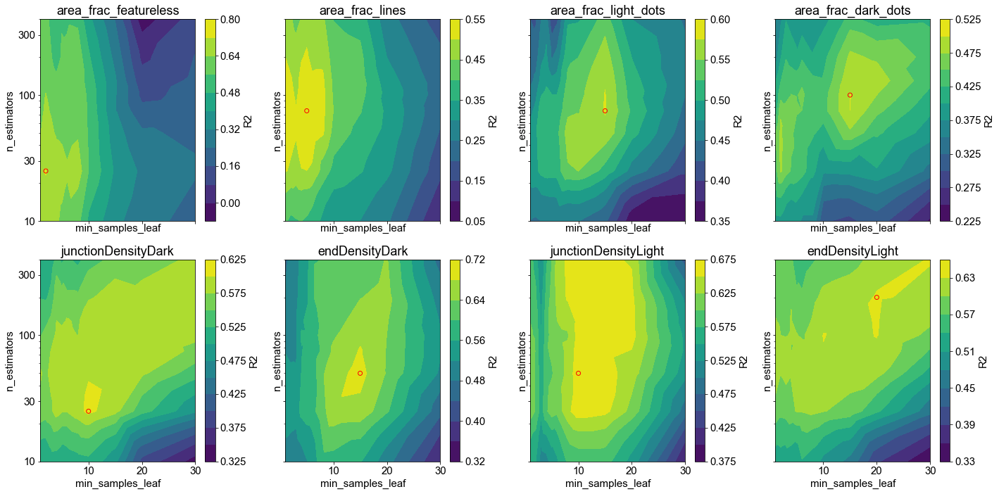

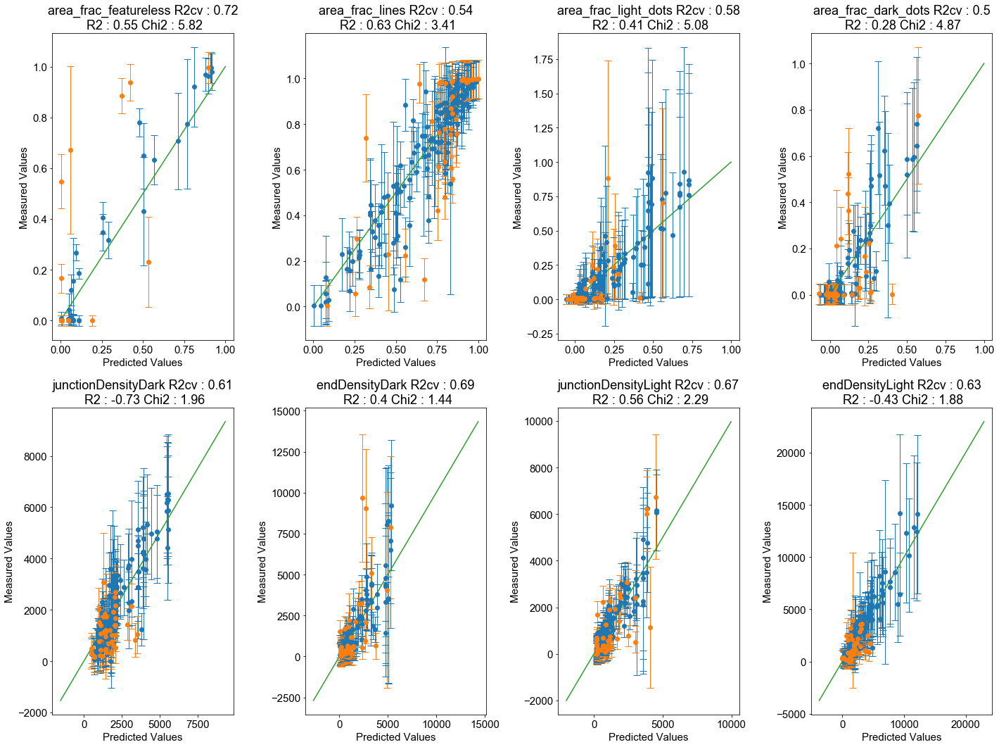

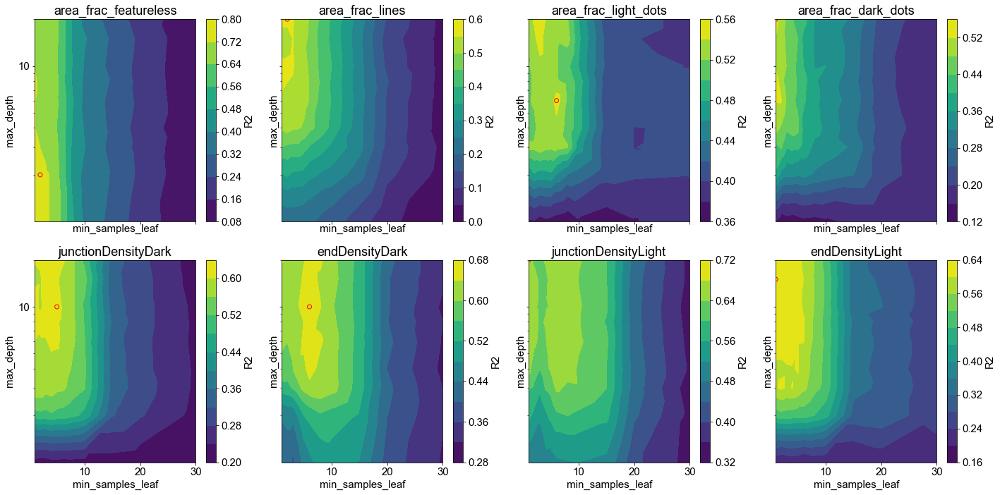

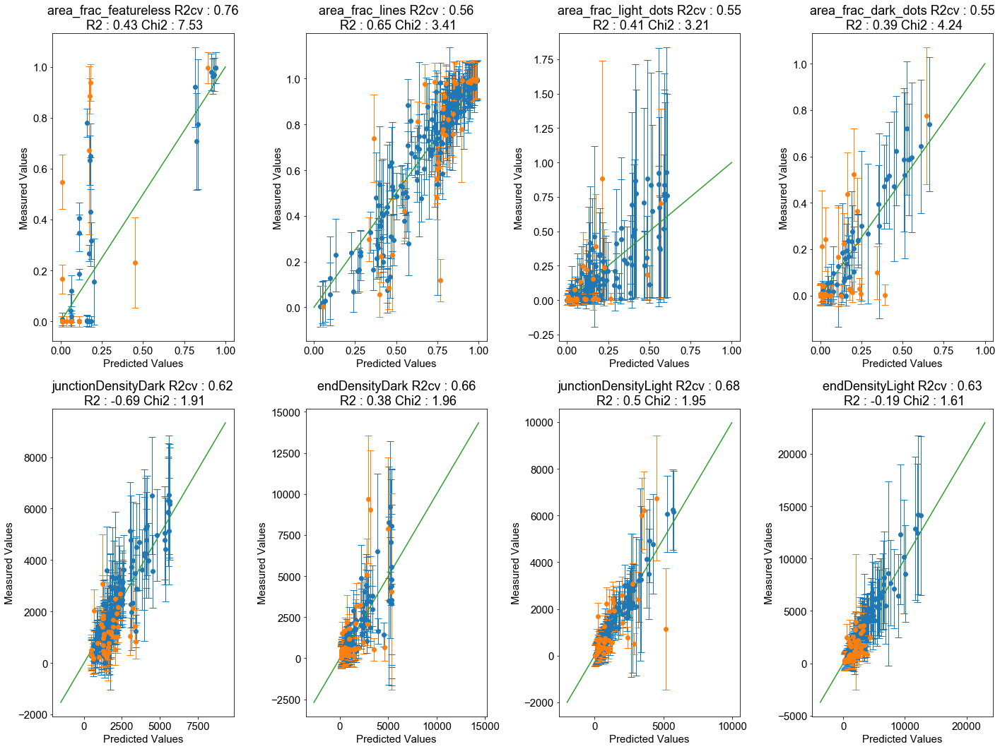

In [115]:
# option 6: predicted block ratio, periodicity, ratioWithNPs, chiN_eff

option6d = run_cv_test_p_first(lgbr(boosting_type='dart'),GBR_params,['ratioWithNPs','chiN_eff'],predicts2,'O6DBGR',['periodicity','block_ratio'])
option6g = run_cv_test_p_first(gbr(),GBR_params,['ratioWithNPs','chiN_eff'],predicts2,'O6GBR',['periodicity','block_ratio'])
option6r = run_cv_test_p_first(rfr(),RFR_params,['ratioWithNPs','chiN_eff'],predicts2,'O6RFR',['periodicity','block_ratio'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


<Figure size 432x288 with 0 Axes>

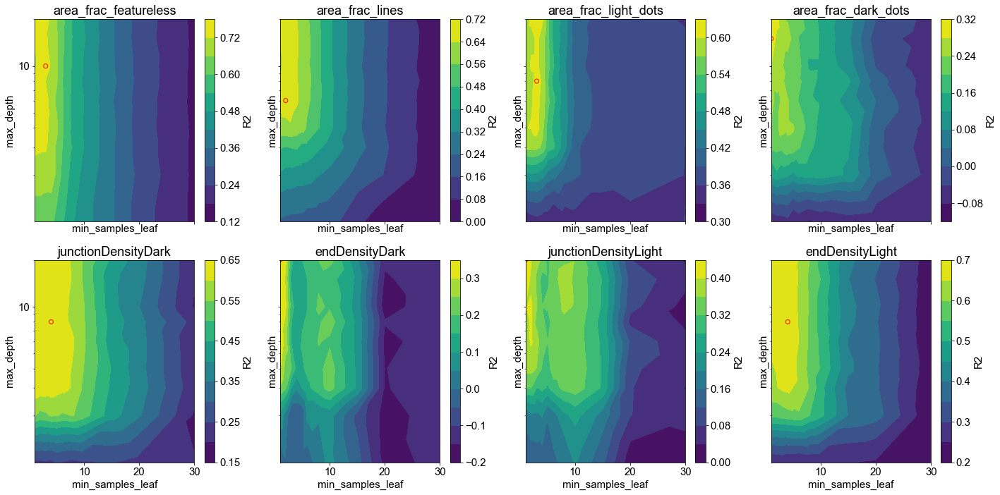

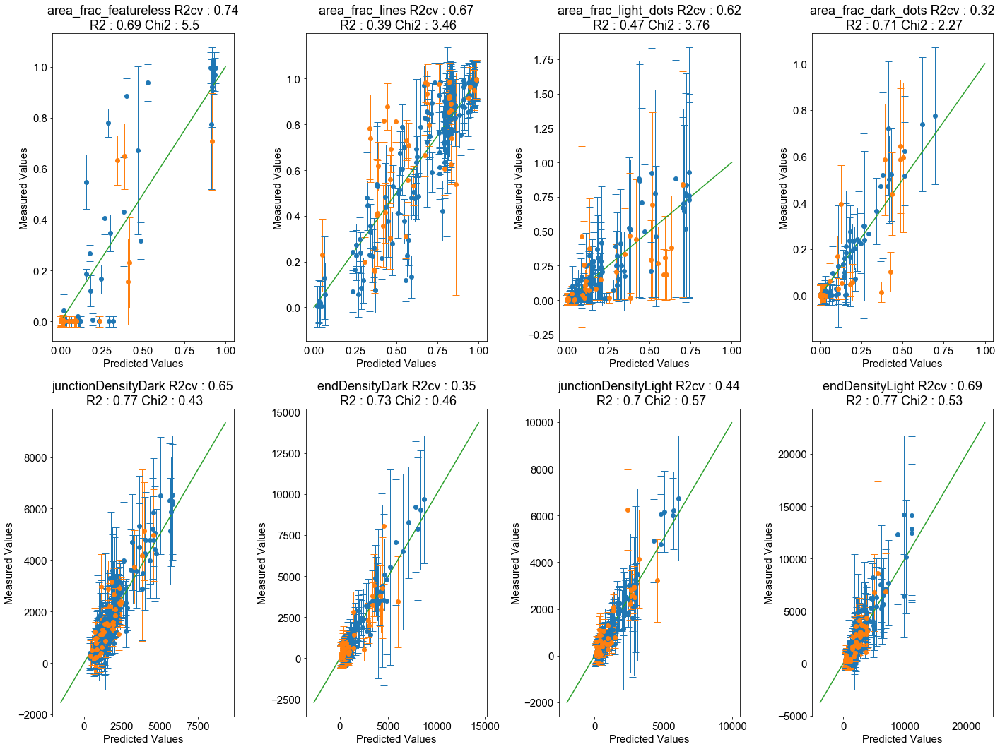

In [27]:
optionrx = run_cv_test_p_first(rfr(),RFR_params,['chiN_eff'],predicts2,'OxRFR',['periodicity','block_ratio'])

In [39]:
data62k = pd.read_csv('62k.csv',index_col = 0)

In [53]:
data62k['grainSize'] = data62k['grain_size']
data62k['junctionDensityDark'] = data62k['junct_density_dark']
data62k['junctionDensityLight'] = data62k['junct_density_light']
data62k['endDensityDark'] = data62k['end_density_dark']
data62k['endDensityLight'] = data62k['end_density_light']
data62k['MW'] = data62k['PS'] + data62k['P4VP']
data62k['fPS'] = data62k['PS'] / data62k['MW']

data62k['fCombCalc'] = 1 - (data62k['PS'] / (data62k['PS'] + data62k['P4VP'] + data62k['P4VP']/105 * data62k['PDP']*304.51)) # weight of PS block, P4VP block, and PDP

data62k['fPDPCalc'] = (data62k['P4VP']*(data62k['PDP']-1)*304.51)/(data62k['PS']*105 + data62k['P4VP']*105 + data62k['P4VP']*(data62k['PDP'])*304.51)

#ia_data['freePDP_NPCalc'] = (ia_data['P4VP']*ia_data['PDP']*304.51)/(ia_data['PS']*105 + ia_data['P4VP']*105 + ia_data['P4VP']*(ia_data['PDP']-1)*304.51)

data62k['ratioWithNPs'] = data62k['fCombCalc'] + data62k['fNP']/100 # block ratio assuming all NPs are in P4VP

data62k['npSizeNormed'] = data62k['NP_size']/(data62k['periodicity']*data62k['block_ratio'])

data62k['thicknessNormed']=data62k['thickness']/data62k['periodicity']


data62k['periodPS'] = data62k['periodicity']*(1-data62k['block_ratio'])
data62k['periodP4VP'] = data62k['periodicity']*(data62k['block_ratio'])


# approximating the domain widths of PS and P4VP(PDP)
data62k['chiN_eff'] = (data62k['PS']+data62k['P4VP'])*(1- data62k['fPDPCalc'])*(1-data62k['fS']/100)

#ia_data['thickness_hist'] = pd.cut(ia_data['thickness'].values,bins = np.arange(40,260,10))

data62k.replace(np.inf,0,inplace = True)
data62k = data62k.fillna(0)

data62k['assumedBlockRatio'] = data62k['area_frac_featureless']/2 + (1-data62k['area_frac_featureless'])* data62k['block_ratio']

ins = ['PDP', 'fS', 'fNP', 'NP_size','MW', 'fPS','thickness']
df62 = data62k
num_df62 = df62.apply(pd.to_numeric, errors='coerce')
num_df62 = num_df62[num_df62.columns[1:]].dropna(axis = 1)
mdf_mean62 = num_df62.groupby(ins).mean().reset_index()
mdf_std62 = num_df62.groupby(ins).std().reset_index()

In [55]:
mdf_mean62['PS'] = mdf_mean62['MW'] - mdf_mean62['P4VP']
mdf_mean62['fPS'] = mdf_mean62['PS'] / mdf_mean62['MW'] 

In [56]:
mdf_std62

,PDP,fS,fNP,NP_size,MW,fPS,thickness,P4VP,P4VP_ratio,fComb,...,npSizeNormed,thicknessNormed,periodPS,periodP4VP,chiN_eff,assumedBlockRatio,junctionDensityDark,junctionDensityLight,endDensityDark,endDensityLight
0,1.2,40,0,0,81.7,0.755202,208,0.0,0.0,0.0,...,0.000000,0.105908,1.945975,1.014375,0.0,0.001943,380.425790,41.641408,454.543095,121.667500
1,1.2,40,4,5,81.7,0.755202,240,0.0,0.0,0.0,...,0.002613,0.056569,0.585708,0.354593,0.0,0.000526,16.296173,18.053020,11.516827,3.454150
2,1.4,40,0,0,81.7,0.755202,215,0.0,0.0,0.0,...,0.000000,0.041377,1.104814,0.287234,0.0,0.001899,116.030235,36.049967,48.888707,27.761833
3,1.5,40,1,5,81.7,0.755202,240,0.0,0.0,0.0,...,0.000248,0.000000,0.049512,0.049512,0.0,0.000693,34.174359,26.902538,9.026294,70.717199
4,1.6,40,0,0,81.7,0.755202,187,0.0,0.0,0.0,...,0.000000,0.000000,0.156731,0.156731,0.0,0.001041,26.396840,30.451888,52.989192,14.016710
5,1.8,40,0,0,81.7,0.755202,188,0.0,0.0,0.0,...,0.000000,0.036181,0.631488,0.437403,0.0,0.002269,19.910043,25.899116,3.361689,12.675513
6,2.0,40,0,0,81.7,0.755202,198,0.0,0.0,0.0,...,0.000000,0.000000,0.161296,0.161296,0.0,0.002097,10.361744,39.203299,6.229948,15.755012
7,2.0,40,2,5,81.7,0.755202,240,0.0,0.0,0.0,...,0.003431,0.056569,0.608117,0.463257,0.0,0.000747,7.821810,27.337052,9.335681,4.933885
8,2.2,40,0,0,81.7,0.755202,164,0.0,0.0,0.0,...,0.000000,0.031562,0.151088,1.182452,0.0,0.008488,12.936168,34.921663,8.559005,9.740881
9,2.2,40,0,0,81.7,0.755202,167,0.0,0.0,0.0,...,0.000000,0.000000,0.192789,0.192789,0.0,0.002571,9.533800,20.797402,10.000081,11.443258


In [57]:
errors62k = copy.deepcopy(mdf_std62)
for i in range(len(predicts1)):
    errors62k[predicts1[i]] = np.sqrt(errors62k[predicts1[i]]**2 + np.max(np.vstack(((err_params[predicts1[i]][0]*errors62k[predicts1[i]] + err_params[predicts1[i]][1]),err_avgs[predicts1[i]]*np.ones(len(errors62k[predicts1[i]])))),axis = 0)**2)


Index(['PDP', 'fS', 'fNP', 'NP_size', 'MW', 'fPS', 'thickness', 'P4VP',
       'P4VP_ratio', 'fComb', 'pxlsToUm', 'imgSize', 'periodicity',
       'grain_size', 'frac_featureless', 'frac_dark_domains',
       'frac_light_domains', 'area_frac_featureless', 'area_frac_light_dots',
       'area_frac_lines', 'area_frac_dark_dots', 'percent_lines_dark',
       'junct_density_dark', 'end_density_dark', 'percent_lines_light',
       'junct_density_light', 'end_density_light', 'block_ratio', 'grainSize',
       'fCombCalc', 'fPDPCalc', 'ratioWithNPs', 'npSizeNormed',
       'thicknessNormed', 'periodPS', 'periodP4VP', 'chiN_eff',
       'assumedBlockRatio', 'junctionDensityDark', 'junctionDensityLight',
       'endDensityDark', 'endDensityLight', 'PS'],
      dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

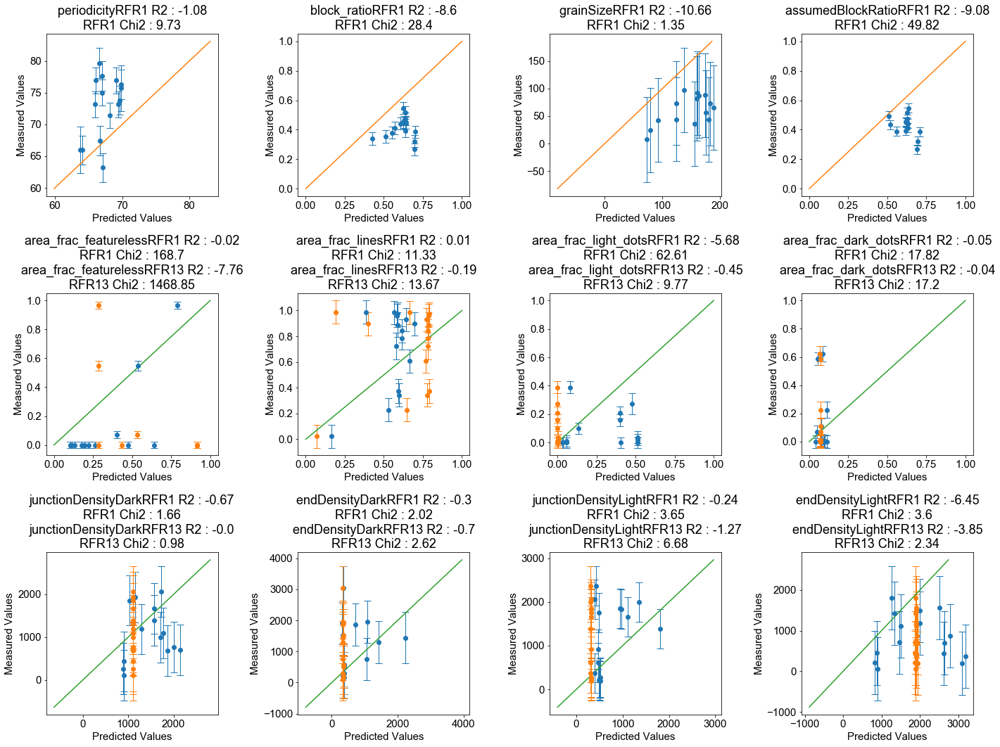

In [62]:
ins_specific = ['chiN_eff']
p_first = ['periodicity','block_ratio']
fig2,ax2 = plt.subplots(3,4,figsize = (20,15))
ax2 = [ax for sublist in ax2 for ax in sublist]
ins_final = ins_specific[::]
combi_dat62 = copy.deepcopy(mdf_mean62)
print(combi_dat62.columns)
for predict in predicts1:
    ni = predicts1.index(predict)
    Xn_test1,Xn_testx,yn_test,en_test = combi_dat62[ins_ch],combi_dat62[ins_specific],combi_dat62[predict],errors62k[predict]
    model1 = option1r[predicts1.index(predict)][1]
    Chi2_1 = np.sum(((model1.predict(Xn_test1)-yn_test)/en_test)**2/len(yn_test))
    ax2[ni].errorbar(model1.predict(Xn_test1),yn_test,yerr = en_test,linewidth = 0, marker = 'o',elinewidth = 1,capthick = 1,capsize = 5, label = 'RFR1')
    
    if predict in predicts2:
        for p in p_first:
            Xn_testx['p_' + p] = model1.predict(combi_dat62.loc[Xn_testx.index,ins_ch])
        modelx = optionrx[predicts2.index(predict)][1]
        Chi2_x = np.sum(((modelx.predict(Xn_testx)-yn_test)/en_test)**2/len(yn_test))
        ax2[ni].errorbar(modelx.predict(Xn_testx),yn_test,yerr = en_test,linewidth = 0, marker = 'o',elinewidth = 1,capthick = 1,capsize = 5, label = 'RFR13')
        ax2[ni].set_title(predict + 'RFR1 R2 : ' + str(round(model1.score(Xn_test1,yn_test),2)) + '\nRFR1 Chi2 : ' + str(round(Chi2_1,2)) + '\n' + predict + 'RFR13 R2 : ' + str(round(modelx.score(Xn_testx,yn_test),2)) + '\nRFR13 Chi2 : ' + str(round(Chi2_x,2)))
    
    else:
        ax2[ni].set_title(predict + 'RFR1 R2 : ' + str(round(model1.score(Xn_test1,yn_test),2)) + '\nRFR1 Chi2 : ' + str(round(Chi2_1,2)))
    
    if max(yn_test) < 1.1:
        ax2[ni].plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1))
    else:
        y_max,y_min = ax2[ni].get_ylim()
        ax2[ni].plot(np.linspace(y_max,y_min,10),np.linspace(y_max,y_min,10))

    
    ax2[ni].set_xlabel('Predicted Values')
    ax2[ni].set_ylabel('Measured Values')
fig2.tight_layout()
plt.show()

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=30. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=5. Current value: min_data_in_leaf=5
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=6. Current value: min_data_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_le

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may

[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=8. Current value: min_data_in_leaf=8
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=2. Current value: min_data_in_leaf=2
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:61: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may

<Figure size 432x288 with 0 Axes>

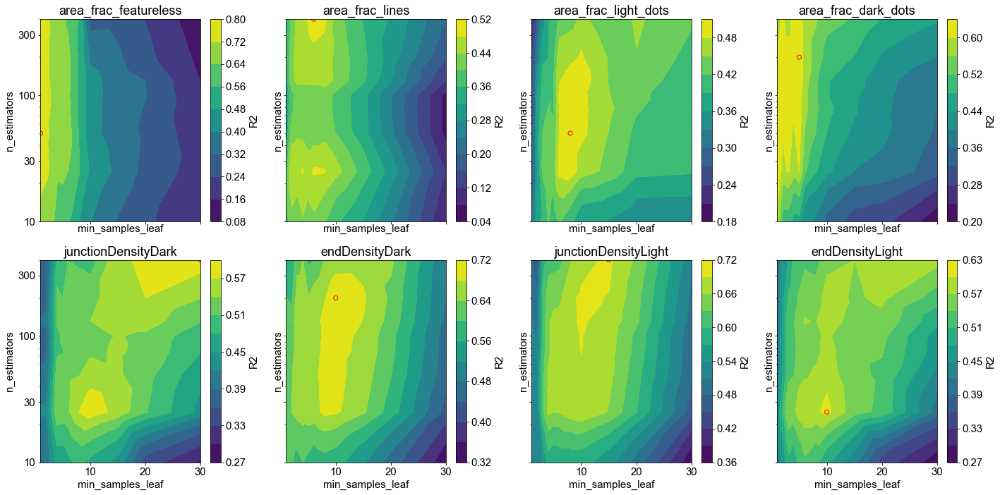

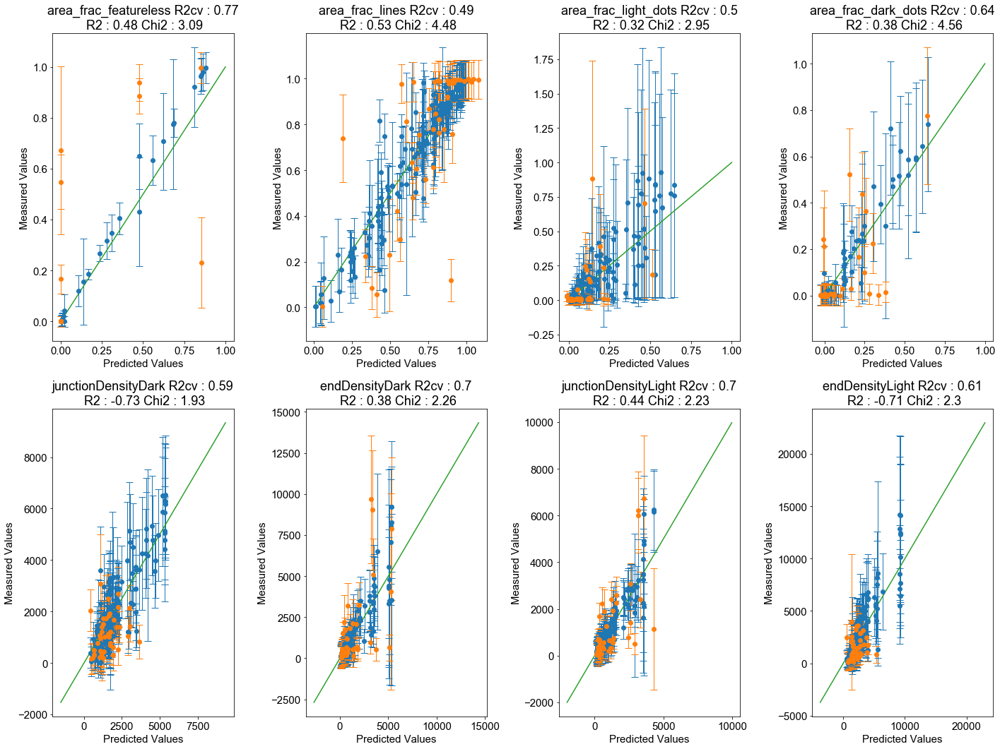

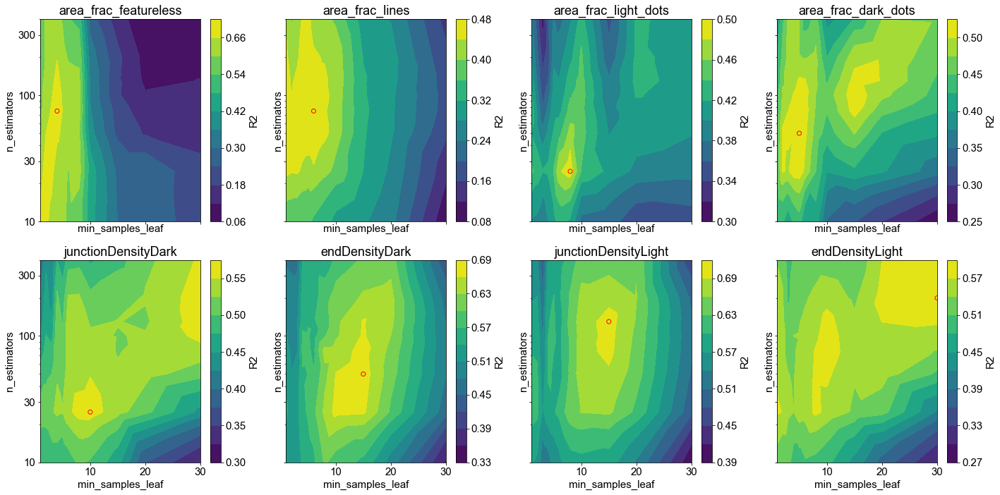

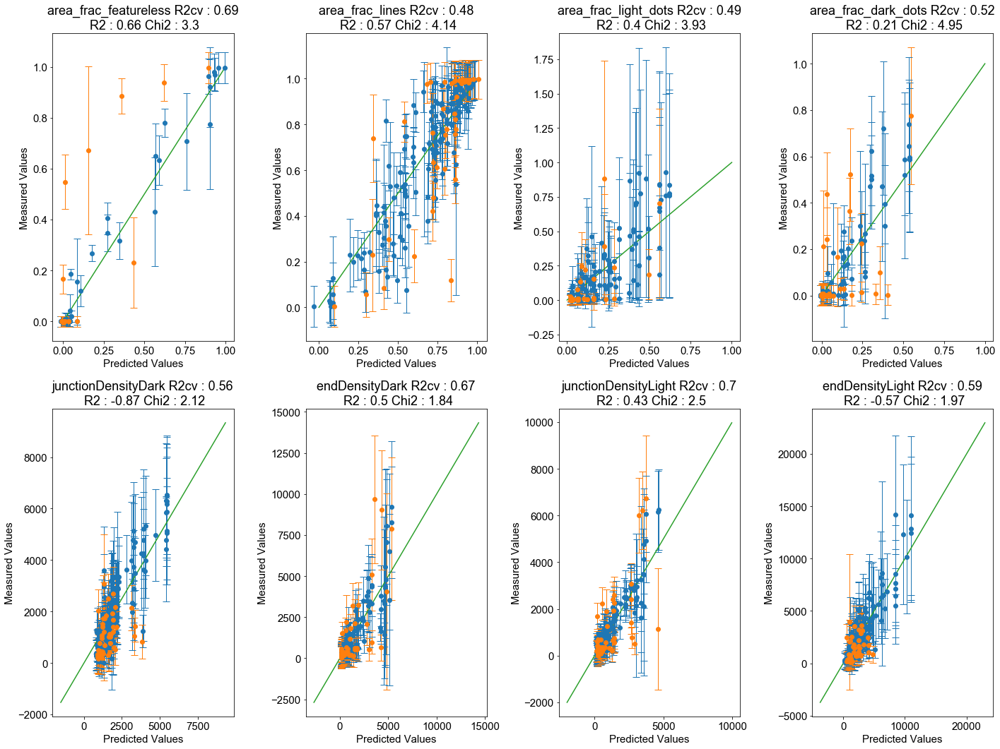

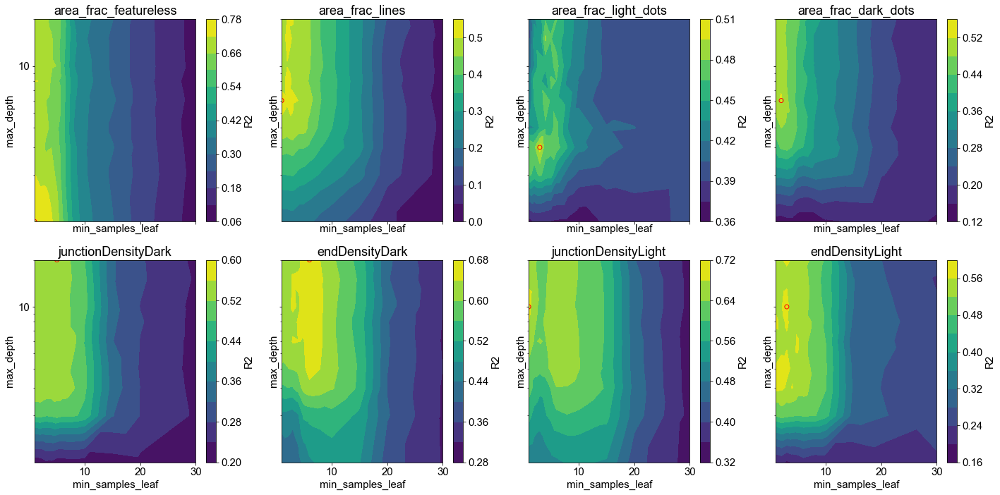

...

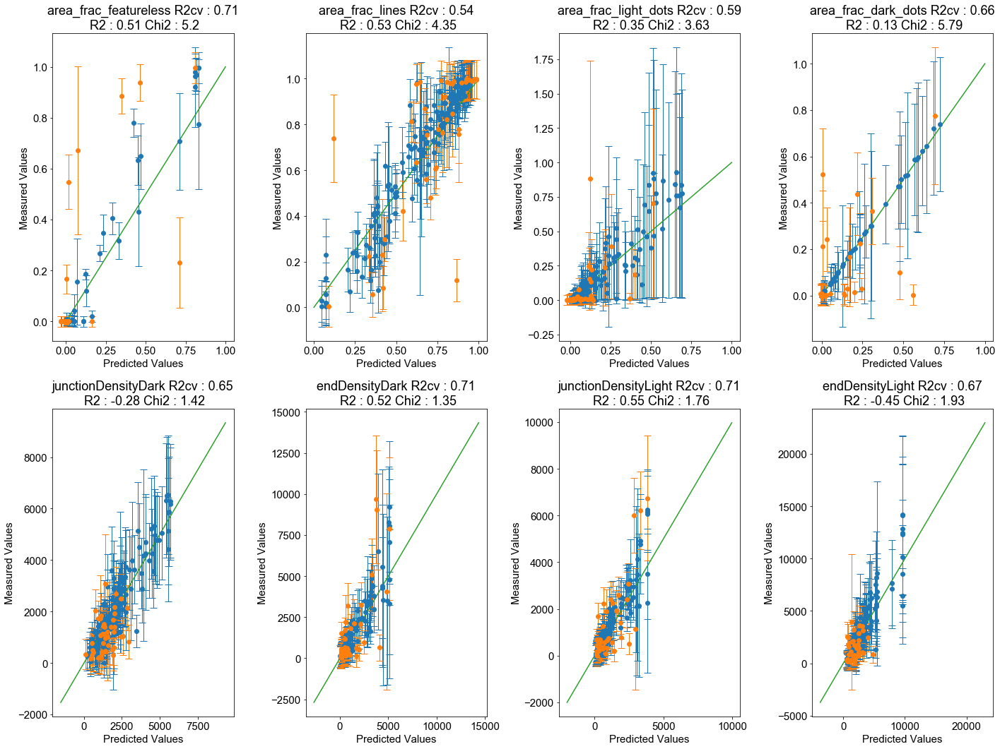

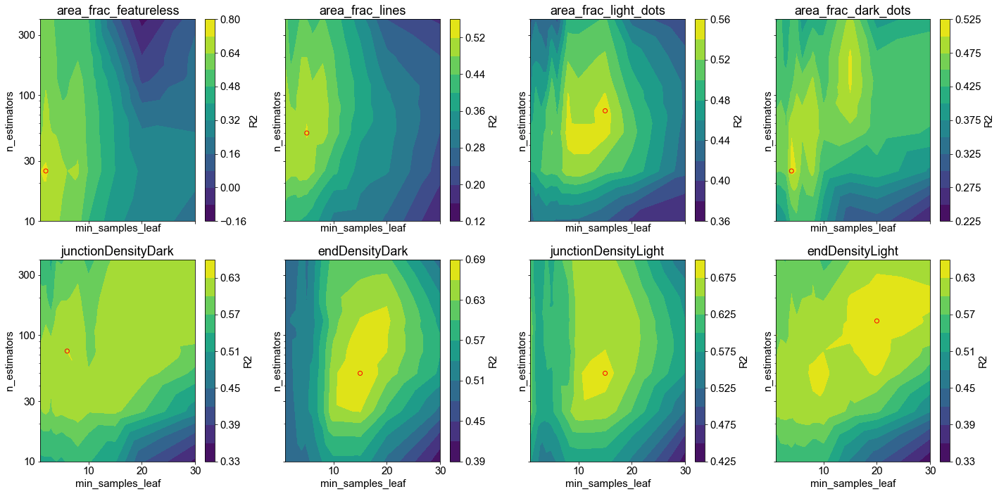

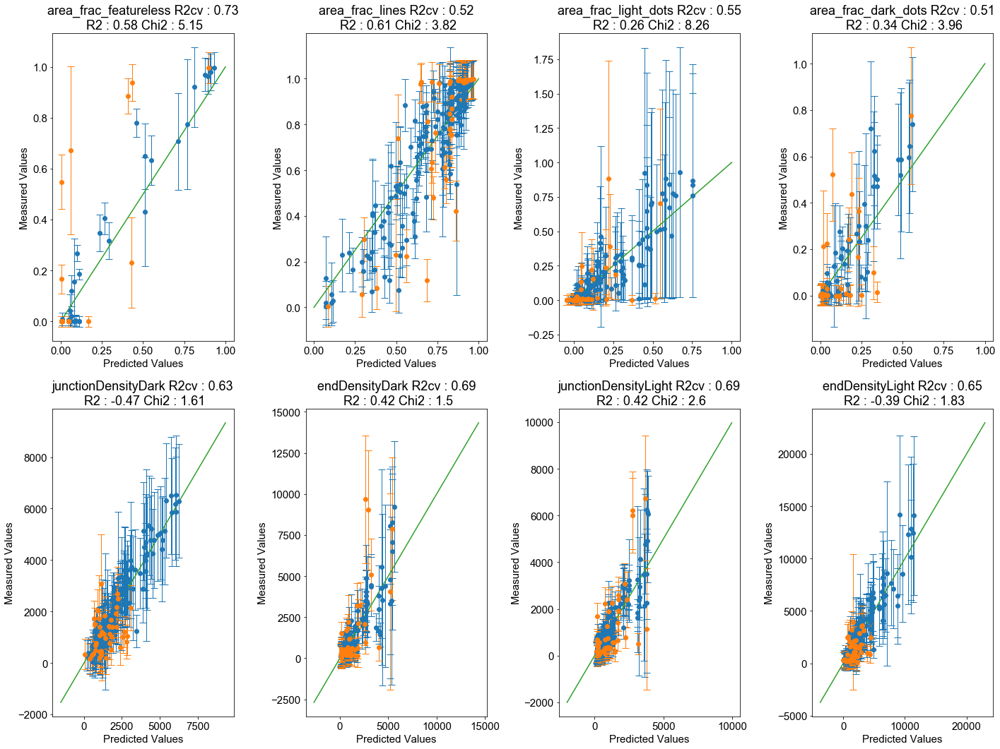

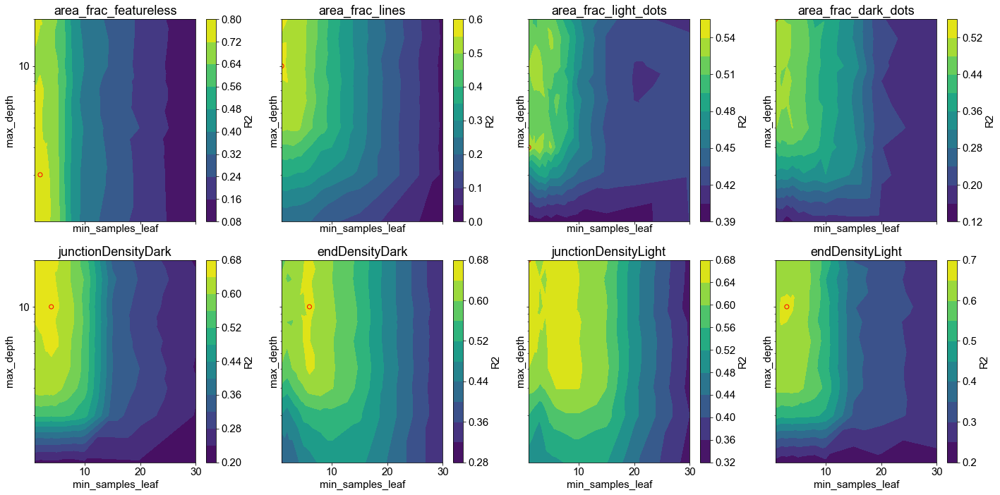

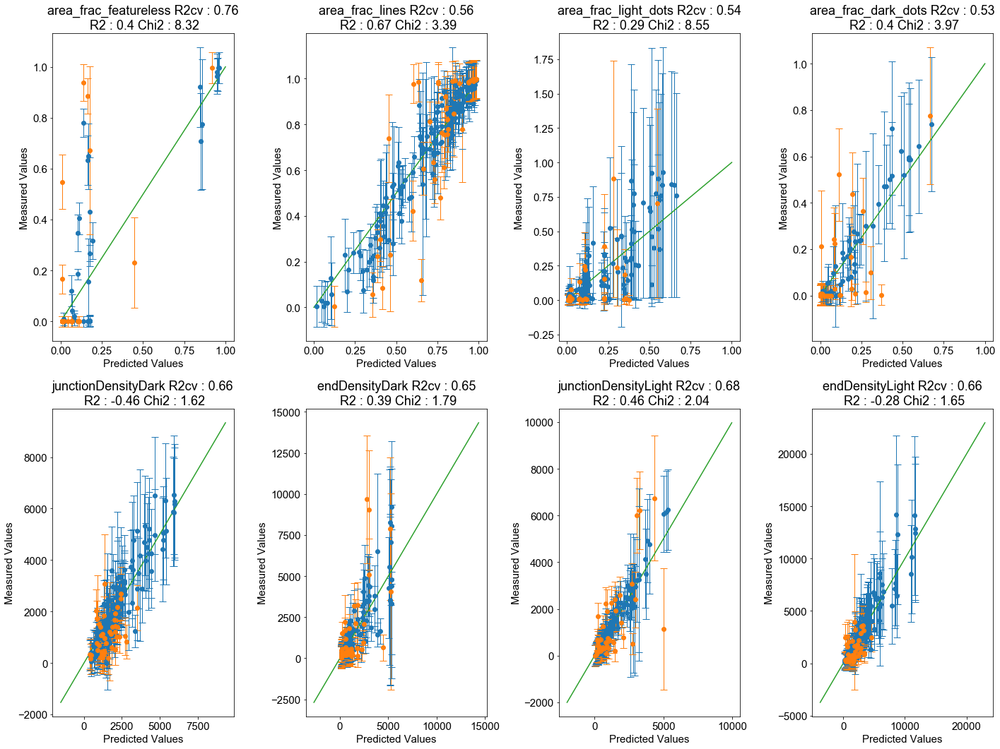

In [116]:
option7_11 = [[['ratioWithNPs','chiN_eff'],['block_ratio']],
              [['ratioWithNPs','chiN_eff'],['periodicity']],
              [['ratioWithNPs'],['periodicity','block_ratio']],
              [['chiN_eff'],['periodicity','block_ratio']],
              [['ratioWithNPs','chiN_eff'],['periodicity','block_ratio','assumedBlockRatio']]]

option7_11s = []
for option in option7_11:
    number = 9 + option7_11.index(option)
    optiond = run_cv_test_p_first(lgbr(boosting_type='dart'),GBR_params,option[0],predicts2,'O' + str(number) + 'DBGR',option[1])
    optiong = run_cv_test_p_first(gbr(),GBR_params,option[0],predicts2,'O' + str(number) + 'GBR',option[1])
    optionr = run_cv_test_p_first(rfr(),RFR_params,option[0],predicts2,'O' + str(number) + 'RFR',option[1])
    option7_11s.append([optionr,optiong,optiond])

In [117]:
option1all = [option1f,option1r,option1s,option1k,option1l,option1d]
resultsR2test,resultsR2cv,resultsChi2 = {},{},{}
model_name = ['GBR1','RFR1','SVR1','KRR1','LGBR1','DGBR1']
predicts1 = ['periodicity','block_ratio','grainSize','assumedBlockRatio',
            'area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots',
            'junctionDensityDark','endDensityDark', 'junctionDensityLight','endDensityLight']

predicts2 = ['area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots',
            'junctionDensityDark','endDensityDark', 'junctionDensityLight','endDensityLight']
for ni in range(len(option1all)):
    resultsR2test[model_name[ni]] = {predicts1[nj] : option1all[ni][nj][3] for nj in range(len(predicts1))}
    resultsR2cv[model_name[ni]] = {predicts1[nj] : option1all[ni][nj][1].best_score_ for nj in range(len(predicts1))}
    resultsChi2[model_name[ni]] = {predicts1[nj] : option1all[ni][nj][4] for nj in range(len(predicts1))}

    
option105all = [option105r,option105g,option105d]
option11all = [option11r,option11g,option11d]
option1sall = [option1s_r,option1s_g,option1s_d]
option2all = [option2r,option2g,option2d]
option3all = [option3r,option3g,option3d]
option4all = [option4r,option4g,option4d]
option5all = [option5r,option5g,option5d]
option6all = [option5r,option5g,option5d]
all_options = [option105all,option11all,option1sall,option2all,option3all,option4all,option5all,option6all] + option7_11s
model_names2 = ['RFR','GBR','DGBR']
for nk in range(4):
    for ni in range(len(model_names2)):
        resultsR2test[model_names2[ni] + str(nk+2)] = {predicts1[nj] : all_options[nk][ni][nj][3] for nj in range(len(predicts1))}
        resultsR2cv[model_names2[ni] + str(nk+2)] = {predicts1[nj] : all_options[nk][ni][nj][1].best_score_ for nj in range(len(predicts1))}
        resultsChi2[model_names2[ni] + str(nk+2)] = {predicts1[nj] : all_options[nk][ni][nj][4] for nj in range(len(predicts1))}

for nk in range(4,13):
    for ni in range(len(model_names2)):
        resultsR2test[model_names2[ni] + str(nk+2)] = {predicts2[nj] : all_options[nk][ni][nj][3] for nj in range(len(predicts2))}
        resultsR2cv[model_names2[ni] + str(nk+2)] = {predicts2[nj] : all_options[nk][ni][nj][1].best_score_ for nj in range(len(predicts2))}
        resultsChi2[model_names2[ni] + str(nk+2)] = {predicts2[nj] : all_options[nk][ni][nj][4] for nj in range(len(predicts2))}

In [118]:
all_results_db_cv = pd.DataFrame.from_dict(resultsR2cv).transpose()
all_results_db_test = pd.DataFrame.from_dict(resultsR2test).transpose()
all_results_db_Chi2 = pd.DataFrame.from_dict(resultsChi2).transpose()
all_results_db_test.to_csv('tests_r2.csv')
all_results_db_Chi2.to_csv('tests_Chi2.csv')
all_results_db_cv.to_csv('cv_r2.csv')

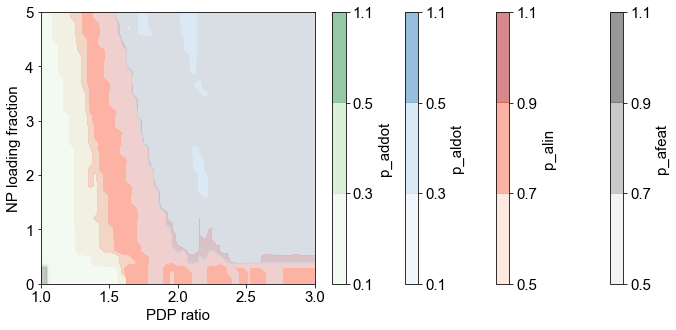

In [119]:
ePS,eP4VP,efS,eNP_size,ethickness = 61.7,20,40,5,100

ePDP,efNP = np.meshgrid(np.linspace(1,3,51),np.linspace(0,5,51))
ePDP,efNP = ePDP.reshape(-1,1),efNP.reshape(-1,1)
pred_dbe = pd.DataFrame(np.hstack([ePDP,efNP]),index = list(range(len(ePDP))),columns = ['PDP','fNP'])
pred_dbe['PS'] = ePS
pred_dbe['P4VP'] = eP4VP
pred_dbe['fS'] = efS
pred_dbe['NP_size'] = eNP_size
pred_dbe['thickness'] = ethickness

pred_dbe['MW'] = pred_dbe['PS'] + pred_dbe['P4VP']
pred_dbe['fPS'] = pred_dbe['PS'] / pred_dbe['MW']
pred_dbe['fCombCalc'] = 1 - (pred_dbe['PS'] / (pred_dbe['PS'] + pred_dbe['P4VP'] + pred_dbe['P4VP']/105 * pred_dbe['PDP']*304.51)) 
# weight of PS block, P4VP block, and PDP
pred_dbe['fPDPCalc'] = (pred_dbe['P4VP']*(pred_dbe['PDP']-1)*304.51)/(pred_dbe['PS']*105 + pred_dbe['P4VP']*105 + pred_dbe['P4VP']*(pred_dbe['PDP'])*304.51)
pred_dbe['freePDP_NPCalc'] = (pred_dbe['P4VP']*pred_dbe['PDP']*304.51)/(pred_dbe['PS']*105 + pred_dbe['P4VP']*105 + pred_dbe['P4VP']*(pred_dbe['PDP']-1)*304.51)
pred_dbe['ratioWithNPs'] = pred_dbe['fCombCalc'] + pred_dbe['fNP']/100 
pred_dbe['chiN_eff'] = (pred_dbe['PS']+pred_dbe['P4VP'])*(1- pred_dbe['fPDPCalc'])*(1-pred_dbe['fS']/100)
# block ratio assuming all NPs are in P4VP
ins_x = ins_ch
estimator1 = option1r[1][1]
estimator2 = option1r[0][1]
estimator1.fit(combi_datan[ins_x],combi_datan['block_ratio'])
estimator2.fit(combi_datan[ins_x],combi_datan['periodicity'])
pred_dbe['p_block_ratio'] = estimator1.predict(pred_dbe[ins_x])
pred_dbe['p_periodicity'] = estimator2.predict(pred_dbe[ins_x])

ins_y = ['chiN_eff','p_periodicity','p_block_ratio']
est_afeat = option7_11s[3][0][0][1]
est_alin = option7_11s[3][0][1][1]
est_aldot = option7_11s[3][0][2][1]
est_addot = option7_11s[3][0][3][1]

pred_dbe['p_afeat'] = est_afeat.predict(pred_dbe[ins_y])
pred_dbe['p_alin'] = est_alin.predict(pred_dbe[ins_y])
pred_dbe['p_aldot'] = est_aldot.predict(pred_dbe[ins_y])
pred_dbe['p_addot'] = est_addot.predict(pred_dbe[ins_y])

plt.figure(figsize = (12,5))
preds = ['p_afeat','p_alin','p_aldot','p_addot']
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
#fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
#print(inputs.shape)
for pi in range(4):
    na = plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe[preds[pi]].values.reshape(51,51),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    plt.colorbar(na,label = preds[pi])
plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
#plt.gcf().tight_layout()
plt.savefig('pred_61.7-20.pdf',format = 'pdf')
plt.show()

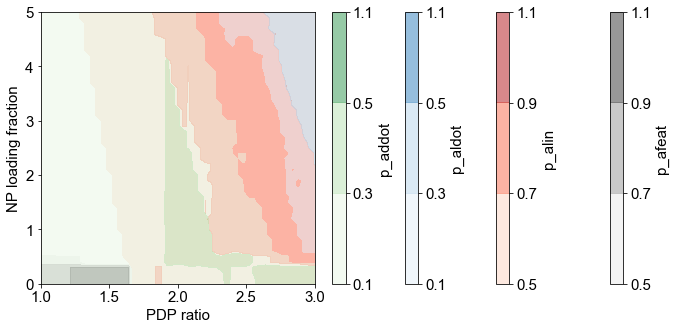

In [120]:
ePS,eP4VP,efS,eNP_size,ethickness = 47,10,40,5,100

ePDP,efNP = np.meshgrid(np.linspace(1,3,51),np.linspace(0,5,51))
ePDP,efNP = ePDP.reshape(-1,1),efNP.reshape(-1,1)
pred_dbe1 = pd.DataFrame(np.hstack([ePDP,efNP]),index = list(range(len(ePDP))),columns = ['PDP','fNP'])
pred_dbe1['PS'] = ePS
pred_dbe1['P4VP'] = eP4VP
pred_dbe1['fS'] = efS
pred_dbe1['NP_size'] = eNP_size
pred_dbe1['thickness'] = ethickness

pred_dbe1['MW'] = pred_dbe1['PS'] + pred_dbe1['P4VP']
pred_dbe1['fPS'] = pred_dbe1['PS'] / pred_dbe1['MW']
pred_dbe1['fCombCalc'] = 1 - (pred_dbe1['PS'] / (pred_dbe1['PS'] + pred_dbe1['P4VP'] + pred_dbe1['P4VP']/105 * pred_dbe1['PDP']*304.51)) 
# weight of PS block, P4VP block, and PDP
pred_dbe1['fPDPCalc'] = (pred_dbe1['P4VP']*(pred_dbe1['PDP']-1)*304.51)/(pred_dbe1['PS']*105 + pred_dbe1['P4VP']*105 + pred_dbe1['P4VP']*(pred_dbe1['PDP'])*304.51)
pred_dbe1['freePDP_NPCalc'] = (pred_dbe1['P4VP']*pred_dbe1['PDP']*304.51)/(pred_dbe1['PS']*105 + pred_dbe1['P4VP']*105 + pred_dbe1['P4VP']*(pred_dbe1['PDP']-1)*304.51)
pred_dbe1['ratioWithNPs'] = pred_dbe1['fCombCalc'] + pred_dbe1['fNP']/100 
pred_dbe1['chiN_eff'] = (pred_dbe1['PS']+pred_dbe1['P4VP'])*(1- pred_dbe1['fPDPCalc'])*(1-pred_dbe1['fS']/100)
# block ratio assuming all NPs are in P4VP
ins_x = ins_ch
estimator1 = option1r[1][1]
estimator2 = option1r[0][1]
estimator1.fit(combi_datan[ins_x],combi_datan['block_ratio'])
estimator2.fit(combi_datan[ins_x],combi_datan['periodicity'])
pred_dbe1['p_block_ratio'] = estimator1.predict(pred_dbe1[ins_x])
pred_dbe1['p_periodicity'] = estimator2.predict(pred_dbe1[ins_x])

ins_y = ['chiN_eff','p_periodicity','p_block_ratio']
est_afeat = option7_11s[3][0][0][1]
est_alin = option7_11s[3][0][1][1]
est_aldot = option7_11s[3][0][2][1]
est_addot = option7_11s[3][0][3][1]

pred_dbe1['p_afeat'] = est_afeat.predict(pred_dbe1[ins_y])
pred_dbe1['p_alin'] = est_alin.predict(pred_dbe1[ins_y])
pred_dbe1['p_aldot'] = est_aldot.predict(pred_dbe1[ins_y])
pred_dbe1['p_addot'] = est_addot.predict(pred_dbe1[ins_y])

plt.figure(figsize = (12,5))
preds = ['p_afeat','p_alin','p_aldot','p_addot']
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
#fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
#print(inputs.shape)
for pi in range(4):
    na = plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe1[preds[pi]].values.reshape(51,51),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    plt.colorbar(na,label = preds[pi])
plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
#plt.gcf().tight_layout()
plt.savefig('pred_47-10.pdf',format = 'pdf')
plt.show()

In [150]:
combi_data61 = mdf_mean[np.abs(mdf_mean['PS']-61.7)<0.5]

In [151]:
print(combi_data61)

    PDP  fS  fNP  NP_size    MW       fPS    PS  P4VP  fComb  thickness  ...  \
16  1.2  40  0.0        0  81.7  0.755202  61.7  20.0  0.592      208.0  ...   
22  1.4  40  0.0        0  81.7  0.755202  61.7  20.0  0.621      215.0  ...   
39  1.6  40  0.0        0  81.7  0.755202  61.7  20.0  0.646      187.0  ...   

    fCombCalc  fPDPCalc  ratioWithNPs  npSizeNormed  thicknessNormed  \
16   0.592207  0.076670      0.592207           0.0         2.669300   
22   0.621246  0.142421      0.621246           0.0         2.800090   
39   0.646425  0.199430      0.646425           0.0         2.500322   

     periodPS  periodP4VP   chiN_eff  assumedBlockRatio  PDP_dist_ratio  
16  32.982653   19.562638  45.261625           0.497838        0.000475  
22  44.828086   32.028865  42.038522           0.469966        0.000391  
39  45.211333   29.625910  39.243941           0.409068        0.000341  

[3 rows x 35 columns]


In [ ]:
ePS,eP4VP,efS,eNP_size,ethickness = 47,10,40,5,100

ePDP,efNP = np.meshgrid(np.linspace(1,3,51),np.linspace(0,5,51))
ePDP,efNP = ePDP.reshape(-1,1),efNP.reshape(-1,1)
pred_dbe2 = pd.DataFrame(np.hstack([ePDP,efNP]),index = list(range(len(ePDP))),columns = ['PDP','fNP'])
pred_dbe2['PS'] = ePS
pred_dbe2['P4VP'] = eP4VP
pred_dbe2['fS'] = efS
pred_dbe2['NP_size'] = eNP_size
pred_dbe2['thickness'] = ethickness

pred_dbe2['MW'] = pred_dbe2['PS'] + pred_dbe2['P4VP']
pred_dbe2['fPS'] = pred_dbe2['PS'] / pred_dbe2['MW']
pred_dbe2['fCombCalc'] = 1 - (pred_dbe2['PS'] / (pred_dbe2['PS'] + pred_dbe2['P4VP'] + pred_dbe2['P4VP']/105 * pred_dbe2['PDP']*304.51)) 
# weight of PS block, P4VP block, and PDP
pred_dbe2['fPDPCalc'] = (pred_dbe2['P4VP']*(pred_dbe2['PDP']-1)*304.51)/(pred_dbe2['PS']*105 + pred_dbe2['P4VP']*105 + pred_dbe2['P4VP']*(pred_dbe2['PDP'])*304.51)
pred_dbe2['freePDP_NPCalc'] = (pred_dbe2['P4VP']*pred_dbe2['PDP']*304.51)/(pred_dbe2['PS']*105 + pred_dbe2['P4VP']*105 + pred_dbe2['P4VP']*(pred_dbe2['PDP']-1)*304.51)
pred_dbe2['ratioWithNPs'] = pred_dbe2['fCombCalc'] + pred_dbe2['fNP']/100 
pred_dbe2['chiN_eff'] = (pred_dbe2['PS']+pred_dbe2['P4VP'])*(1- pred_dbe2['fPDPCalc'])*(1-pred_dbe2['fS']/100)
# block ratio assuming all NPs are in P4VP
ins_x = ins_ch
estimator1 = option1r[1][1]
estimator2 = option1r[0][1]
estimator3 = option1r[2][1]
estimator4 = option1r[2][1]
estimator1.fit(combi_datan[ins_x],combi_datan['block_ratio'])
estimator2.fit(combi_datan[ins_x],combi_datan['periodicity'])
estimator3.fit(combi_datan[ins_x],combi_datan['block_ratio'])
estimator4.fit(combi_datan[ins_x],combi_datan['periodicity'])
pred_dbe2['p_block_ratio'] = estimator1.predict(pred_dbe2[ins_x])
pred_dbe2['p_periodicity'] = estimator2.predict(pred_dbe2[ins_x])
pred_dbe2['p_grainsize'] = estimator3.predict(pred_dbe2[ins_x])
pred_dbe2['p_assumedBlockRatio'] = estimator4.predict(pred_dbe2[ins_x])

ins_y = ['chiN_eff','p_periodicity','p_block_ratio']
est_jdd = option7_11s[3][0][4][1]
est_edd = option7_11s[3][0][5][1]
est_jld = option7_11s[3][0][6][1]
est_eld = option7_11s[3][0][7][1]

pred_dbe2['p_jdd'] = est_jdd.predict(pred_dbe2[ins_y])
pred_dbe2['p_edd'] = est_edd.predict(pred_dbe2[ins_y])
pred_dbe2['p_jld'] = est_jld.predict(pred_dbe2[ins_y])
pred_dbe2['p_eld'] = est_eld.predict(pred_dbe2[ins_y])

plt.figure(figsize = (12,5))
preds = ['p_jdd','p_edd','p_jld','p_eld'] + ['p_periodicity','p_block_ratio','p_grainsize','p_assumedBlockRatio']
#fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
#print(inputs.shape)
for pi in range(8):
    na = plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe1[preds[pi]].values.reshape(51,51),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    plt.colorbar(na,label = preds[pi])
    plt.gca().set_xlabel('PDP ratio')
    plt.gca().set_ylabel('NP loading fraction')
    plt.show()
#plt.gcf().tight_layout()
#plt.savefig('pred_47-10.pdf',format = 'pdf')


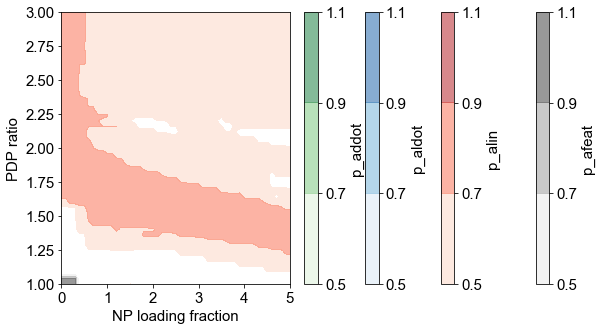

In [121]:
plt.figure(figsize = (10,5))
preds = ['p_afeat','p_alin','p_aldot','p_addot']
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
#fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
#print(inputs.shape)
for pi in range(4):
    na = plt.contourf(np.linspace(0,5,51),np.linspace(1,3,51),pred_dbe[preds[pi]].values.reshape(51,51).transpose(),cmap = cmaps[pi],alpha = 0.5,levels = [0.5,0.7,0.9,1.1])
    plt.colorbar(na,label = preds[pi])
plt.gca().set_ylabel('PDP ratio')
plt.gca().set_xlabel('NP loading fraction')
#plt.gcf().tight_layout()
plt.savefig('pred_61.7-20t.pdf',format = 'pdf')
plt.show()

In [122]:
combi_test[['PDP','fNP','periodicity','block_ratio',
            'area_frac_featureless','area_frac_lines','area_frac_light_dots','area_frac_dark_dots']]

,PDP,fNP,periodicity,block_ratio,area_frac_featureless,area_frac_lines,area_frac_light_dots,area_frac_dark_dots
16,1.2,0.0,78.062978,0.247905,0.984112,0.009700,0.000000,0.006188
22,1.4,0.0,76.856951,0.416546,0.646032,0.210213,0.000000,0.143755
39,1.6,0.0,74.837243,0.396013,0.126895,0.355717,0.000083,0.517305
14,1.2,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
20,1.4,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
37,1.6,0.0,45.200013,0.482877,0.844721,0.143937,0.002633,0.008708
81,1.8,0.0,45.904059,0.508430,0.271139,0.661672,0.001382,0.065807


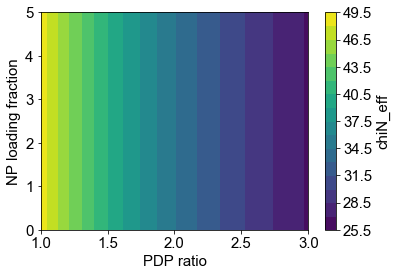

In [123]:
plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe['chiN_eff'].values.reshape(51,51),levels = 20)
plt.colorbar(label = 'chiN_eff')
plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
plt.savefig('61.7-20-chiN_eff.pdf',format = 'pdf')
plt.show()

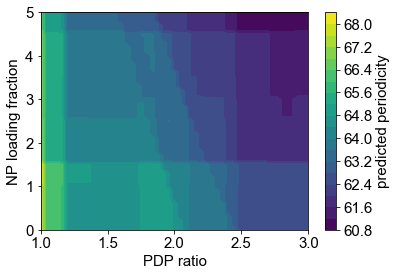

In [124]:
plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe['p_periodicity'].values.reshape(51,51),levels = 20)
plt.colorbar(label = 'predicted periodicity')
plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
plt.savefig('61.7-20-per.pdf',format = 'pdf')
plt.show()

In [127]:
print([min(combi_datan['chiN_eff']),max(combi_datan['chiN_eff'])])

[7.868962456271161, 80.39999999999999]


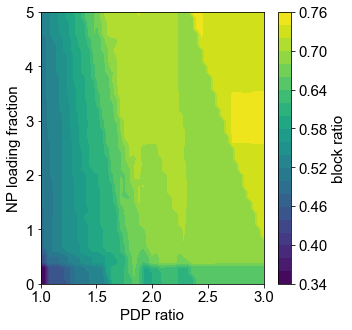

In [128]:
plt.figure(figsize = (5,5))
plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe['p_block_ratio'].values.reshape(51,51),levels = 20)
plt.colorbar(label = 'block ratio')

plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
plt.savefig('61.7-20-block_ratio.pdf',format = 'pdf')
plt.show()

In [129]:
sel19 = mdf_mean[(mdf_mean['PS'] == 19.0) & (mdf_mean['NP_size'] == 3.0)][ins_simple + predicts2].groupby(['PDP','fNP']).mean().reset_index()

In [130]:
import numpy as np

In [131]:
for pol in mdf_mean['PS'].unique():
    selpol = mdf_mean[np.abs(mdf_mean['PS']- pol) < 0.5]
    print('')
    print([pol,len(selpol)])
    for npx in selpol['NP_size'].unique():
        selnp = selpol[np.abs(selpol['NP_size'] - npx) < 0.5].groupby(['fNP','PDP']).mean().reset_index()
        if len(selnp) > 4 and npx > 0:
            print(npx)
            print(selnp[ins + predicts2[:4]])


[19.0, 94]
5
   PDP     fS   fNP  NP_size    MW       fPS  area_frac_featureless  \
0  1.7  38.75   1.0      5.0  24.2  0.785124                    0.0   
1  2.0  35.00   1.0      5.0  24.2  0.785124                    0.0   
2  2.2  32.50   1.0      5.0  24.2  0.785124                    0.0   
3  2.4  35.00   1.0      5.0  24.2  0.785124                    0.0   
4  2.0  35.00   2.0      5.0  24.2  0.785124                    0.0   
5  1.7  40.00   3.0      5.0  24.2  0.785124                    0.0   
6  2.0  35.00   3.0      5.0  24.2  0.785124                    0.0   
7  2.2  32.50   3.0      5.0  24.2  0.785124                    0.0   
8  2.0  40.00   6.0      5.0  24.2  0.785124                    0.0   
9  2.6  40.00  10.0      5.0  24.2  0.785124                    1.0   

   area_frac_lines  area_frac_light_dots  area_frac_dark_dots  
0         0.952807              0.044588             0.002606  
1         0.907458              0.091940             0.000602  
2         0.

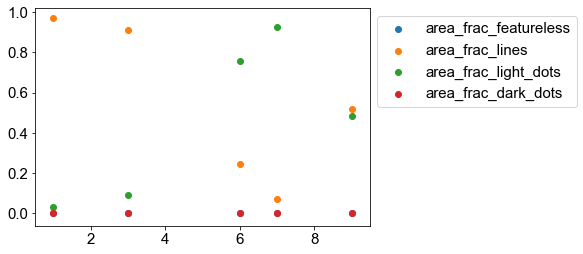

In [132]:
subsel = sel19[sel19['PDP'] == 2.0]
for ai in range(4):
    plt.scatter(subsel['fNP'],subsel[predicts2[ai]],label = predicts2[ai])

plt.legend(bbox_to_anchor = [1,1])
plt.show()

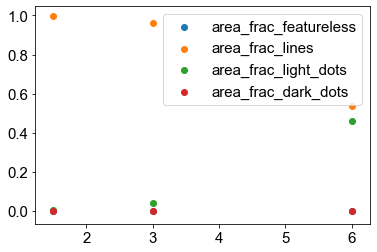

In [133]:
subsel = sel19[sel19['PDP'] == 1.7]
for ai in range(4):
    plt.scatter(subsel['fNP'],subsel[predicts2[ai]],label = predicts2[ai])

plt.legend(bbox_to_anchor = [1,1])
plt.show()

In [134]:
sel50 = mdf_mean[(mdf_mean['PS'] == 50.0) & (mdf_mean['NP_size'] == 15.0)][ins_simple + predicts2].groupby(['PDP','fNP']).mean().reset_index()

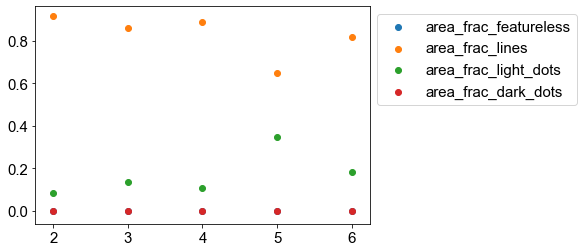

In [135]:
subsel = sel50[sel50['PDP'] == 1.8]
for ai in range(4):
    plt.scatter(subsel['fNP'],subsel[predicts2[ai]],label = predicts2[ai])

plt.legend(bbox_to_anchor = [1,1])
plt.show()

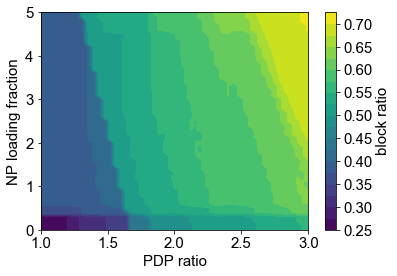

In [136]:
plt.figure()
plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe1['p_block_ratio'].values.reshape(51,51),levels = 20)
plt.colorbar(label = 'block ratio')

plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
plt.savefig('47-10-block_ratio.pdf',format = 'pdf')
plt.show()

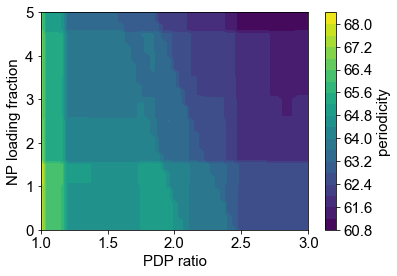

In [137]:
plt.contourf(np.linspace(1,3,51),np.linspace(0,5,51),pred_dbe['p_periodicity'].values.reshape(51,51),levels = 20)
plt.colorbar(label = 'periodicity')
plt.gca().set_xlabel('PDP ratio')
plt.gca().set_ylabel('NP loading fraction')
plt.savefig('61.7-20-periodicity.pdf',format = 'pdf')
plt.show()

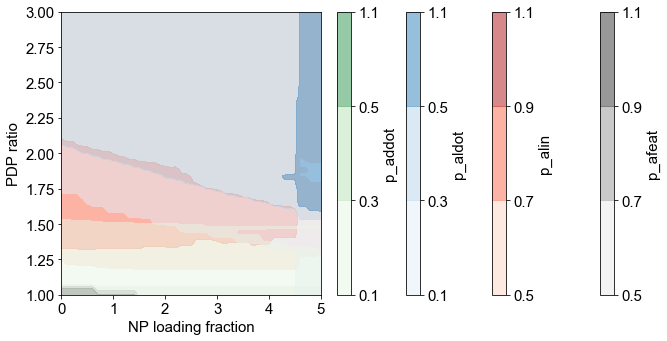

In [138]:
ePS,eP4VP,efS,eNP_size,ethickness = 61.7,20,40,5,100

ePDP,efNP = np.meshgrid(np.linspace(1,3,51),np.linspace(0,5,51))
ePDP,efNP = ePDP.reshape(-1,1),efNP.reshape(-1,1)
pred_dbe = pd.DataFrame(np.hstack([ePDP,efNP]),index = list(range(len(ePDP))),columns = ['PDP','fNP'])
pred_dbe['PS'] = ePS
pred_dbe['P4VP'] = eP4VP
pred_dbe['fS'] = efS
pred_dbe['NP_size'] = eNP_size
pred_dbe['thickness'] = ethickness

pred_dbe['MW'] = pred_dbe['PS'] + pred_dbe['P4VP']
pred_dbe['fPS'] = pred_dbe['PS'] / pred_dbe['MW']
pred_dbe['fCombCalc'] = 1 - (pred_dbe['PS'] / (pred_dbe['PS'] + pred_dbe['P4VP'] + pred_dbe['P4VP']/105 * pred_dbe['PDP']*304.51)) 
# weight of PS block, P4VP block, and PDP
pred_dbe['fPDPCalc'] = (pred_dbe['P4VP']*(pred_dbe['PDP']-1)*304.51)/(pred_dbe['PS']*105 + pred_dbe['P4VP']*105 + pred_dbe['P4VP']*(pred_dbe['PDP'])*304.51)
pred_dbe['freePDP_NPCalc'] = (pred_dbe['P4VP']*pred_dbe['PDP']*304.51)/(pred_dbe['PS']*105 + pred_dbe['P4VP']*105 + pred_dbe['P4VP']*(pred_dbe['PDP']-1)*304.51)
pred_dbe['ratioWithNPs'] = pred_dbe['fCombCalc'] + pred_dbe['fNP']/100 
pred_dbe['chiN_eff'] = (pred_dbe['PS']+pred_dbe['P4VP'])*(1- pred_dbe['fPDPCalc'])*(1-pred_dbe['fS']/100)
# block ratio assuming all NPs are in P4VP
ins_x = ins_ch

ins_y = ins_ch
est_afeat = option1r[4][1]
est_alin = option1r[5][1]
est_aldot = option1r[6][1]
est_addot = option1r[7][1]

pred_dbe['p_afeat'] = est_afeat.predict(pred_dbe[ins_y])
pred_dbe['p_alin'] = est_alin.predict(pred_dbe[ins_y])
pred_dbe['p_aldot'] = est_aldot.predict(pred_dbe[ins_y])
pred_dbe['p_addot'] = est_addot.predict(pred_dbe[ins_y])

plt.figure(figsize = (10,5))
preds = ['p_afeat','p_alin','p_aldot','p_addot']
cmaps = ['Greys','Reds','Blues','Greens']
levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
#fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
#print(inputs.shape)
for pi in range(4):
    na = plt.contourf(np.linspace(0,5,51),np.linspace(1,3,51),pred_dbe[preds[pi]].values.reshape(51,51).transpose(),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])
    plt.colorbar(na,label = preds[pi])
plt.gca().set_ylabel('PDP ratio')
plt.gca().set_xlabel('NP loading fraction')
plt.gcf().tight_layout()
plt.savefig('pred_61.7-20_o1rt.pdf',format = 'pdf')
plt.show()

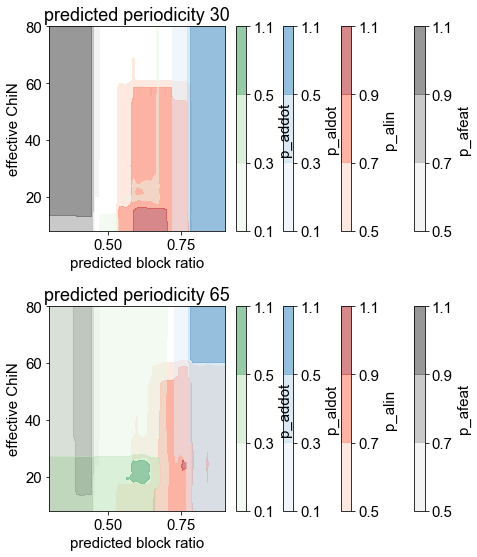

In [140]:
x_ins = []
for per in [30,65]:
    X,Y = np.meshgrid(np.linspace(0.2,0.8,51),np.linspace(8,80,51))
    X,Y = X.reshape(-1,1),Y.reshape(-1,1)
    df = pd.DataFrame(np.hstack([X,Y]),columns = ['p_block_ratio','chiN_eff'])
    df['p_periodicity'] = per
    x_ins.append(df)

ins_y = ['chiN_eff','p_periodicity','p_block_ratio']
est_afeat = option7_11s[3][0][0][1]
est_alin = option7_11s[3][0][1][1]
est_aldot = option7_11s[3][0][2][1]
est_addot = option7_11s[3][0][3][1]

fig,ax = plt.subplots(2,1,figsize = (7,8))#,gridspec_kw = {'width_ratios' : [6,1,1,1,1]})
#ax = [axi for sublist in ax for axi in sublist]
for i in range(2):
    x_ins[i]['p_afeat'] = est_afeat.predict(x_ins[i][ins_y])
    x_ins[i]['p_alin'] = est_alin.predict(x_ins[i][ins_y])
    x_ins[i]['p_aldot'] = est_aldot.predict(x_ins[i][ins_y])
    x_ins[i]['p_addot'] = est_addot.predict(x_ins[i][ins_y])


    preds = ['p_afeat','p_alin','p_aldot','p_addot']
    cmaps = ['Greys','Reds','Blues','Greens']
    levels = [[0.5,0.7,0.9,1.1],[0.5,0.7,0.9,1.1],[0.1,0.3,0.5,1.1],[0.1,0.3,0.5,1.1]]
    #fig3,ax3 = plt.subplots(1,2,figsize = (8,4),sharex = True, sharey = True)
    #print(inputs.shape)
    for pi in range(4):
        na = ax[i].contourf(np.linspace(0.3,0.9,51),np.linspace(8,80,51),x_ins[i][preds[pi]].values.reshape(51,51),cmap = cmaps[pi],alpha = 0.5,levels = levels[pi])

        fig.colorbar(na,ax = ax[i],label = preds[pi])
    ax[i].set_title('predicted periodicity ' + str(x_ins[i]['p_periodicity'].unique()[0]))
    ax[i].set_xlabel('predicted block ratio')
    ax[i].set_ylabel('effective ChiN')
    #plt.gcf().tight_layout()
    
#ax[1].tricontourf(pred_dbe['p_block_ratio'],pred_dbe['chiN_eff'],pred_dbe['fS'],alpha = 0.5,cmap = 'Purples')
#plt.colorbar()
fig.tight_layout()
plt.savefig('RFR13_resp_func.pdf',format = 'pdf')
plt.show()

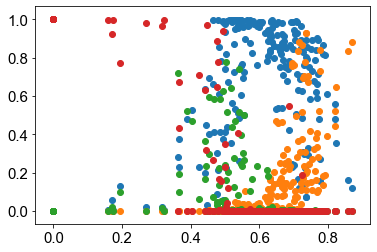

In [145]:


plt.scatter(combi_data['block_ratio'],combi_data['area_frac_lines'])
plt.scatter(combi_data['block_ratio'],combi_data['area_frac_light_dots'])
plt.scatter(combi_data['block_ratio'],combi_data['area_frac_dark_dots'])
plt.scatter(combi_data['block_ratio'],combi_data['area_frac_featureless'])
plt.show()